<a href="https://colab.research.google.com/github/IISuperluminaLII/SCGAN/blob/main/Skipped_Connection_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import numpy as np

In [ ]:
def mnist_dataset(batch_size):
    #fashion MNIST is a drop in replacement for MNIST that is harder to solve 
    (train_images, _), (_, _) = tf.keras.datasets.fashion_mnist.load_data()
    train_images = train_images.reshape([-1, 28, 28, 1]).astype('float32')
    train_images = train_images/127.5  - 1
    dataset = tf.data.Dataset.from_tensor_slices(train_images)
    dataset = dataset.map(image_reshape)
    dataset = dataset.cache()
    dataset = dataset.shuffle(len(train_images))
    dataset = dataset.batch(batch_size, drop_remainder=True)
    dataset = dataset.prefetch(1)
    return dataset
    
#Function for reshaping images into the multiple resolutions we will use
def image_reshape(x):
    return [
        tf.image.resize(x, (7, 7)),
        tf.image.resize(x, (14, 14)),
        x
    ]

In [ ]:
NOISE_DIM = 100
from tensorflow.keras import layers
def generator_model():
    outputs = []

    z_in = tf.keras.Input(shape=(NOISE_DIM,))
    x = layers.Dense(7*7*256)(z_in)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = layers.Reshape((7, 7, 256))(x)

    for i in range(3):
        if i == 0:
            x = layers.Conv2DTranspose(128, (5, 5), strides=(1, 1),
                padding='same')(x)
            x = layers.BatchNormalization()(x)
            x = layers.LeakyReLU()(x)
        else:
            x = layers.Conv2DTranspose(128, (5, 5), strides=(2, 2),
                padding='same')(x)
            x = layers.BatchNormalization()(x)
            x = layers.LeakyReLU()(x)

        x = layers.Conv2D(128, (5, 5), strides=(1, 1), padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)

        outputs.append(layers.Conv2DTranspose(1, (5, 5), strides=(1, 1),
            padding='same', activation='tanh')(x))

    model = tf.keras.Model(inputs=z_in, outputs=outputs)
    return model

In [ ]:
def discriminator_model():
    # we have multiple inputs to make a real/fake decision from
    inputs = [
        tf.keras.Input(shape=(28, 28, 1)),
        tf.keras.Input(shape=(14, 14, 1)),
        tf.keras.Input(shape=(7, 7, 1))
    ]

    x = None
    for image_in in inputs:
        if x is None:
            # for the first input we don't have features to append to
            x = layers.Conv2D(64, (5, 5), strides=(2, 2),
                padding='same')(image_in)
            x = layers.LeakyReLU()(x)
            x = layers.Dropout(0.3)(x)
        else:
            # every additional input gets its own conv layer then appended
            y = layers.Conv2D(64, (5, 5), strides=(2, 2),
                padding='same')(image_in)
            y = layers.LeakyReLU()(y)
            y = layers.Dropout(0.3)(y)
            x = layers.concatenate([x, y])

        x = layers.Conv2D(128, (3, 3), strides=(1, 1), padding='same')(x)
        x = layers.LeakyReLU()(x)
        x = layers.Dropout(0.3)(x)

        x = layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same')(x)
        x = layers.LeakyReLU()(x)
        x = layers.Dropout(0.3)(x)

    x = layers.Flatten()(x)
    out = layers.Dense(1)(x)
    inputs = inputs[::-1] # reorder the list to be smallest resolution first
    model = tf.keras.Model(inputs=inputs, outputs=out)
    return model

# create the models and optimizers for later functions
generator = generator_model()
discriminator = discriminator_model()
generator_optimizer = tf.keras.optimizers.Adam(1e-3)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-3)

In [ ]:
def plot_sample(sample):
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    num_samples = min(3, len(sample[0]))

    grid = gridspec.GridSpec(3, num_samples)
    grid.update(left=0, bottom=0, top=1, right=1, wspace=0.01, hspace=0.01)
    fig = plt.figure(figsize=[num_samples, 3])
    for x in range(3):
        images = sample[x].numpy() #this converts the tensor to a numpy array
        images = np.squeeze(images)
        for y in range(num_samples):
            ax = fig.add_subplot(grid[x, y])
            ax.set_axis_off()
            ax.imshow((images[y] + 1.0)/2, cmap='gray')
    plt.show()

tf.Tensor(0.66781735, shape=(), dtype=float32) - tf.Tensor(1.0785521, shape=(), dtype=float32)


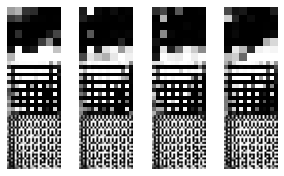

___________________________
tf.Tensor(1.1847858, shape=(), dtype=float32) - tf.Tensor(0.6258342, shape=(), dtype=float32)


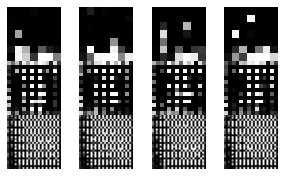

___________________________
tf.Tensor(1.6174314, shape=(), dtype=float32) - tf.Tensor(0.41741896, shape=(), dtype=float32)


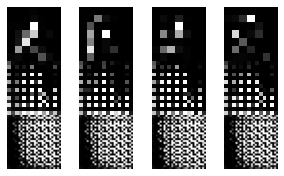

___________________________
tf.Tensor(5.6698103, shape=(), dtype=float32) - tf.Tensor(2.1527956, shape=(), dtype=float32)


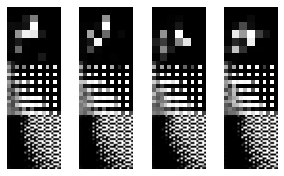

___________________________
tf.Tensor(2.8325906e-07, shape=(), dtype=float32) - tf.Tensor(18.488518, shape=(), dtype=float32)


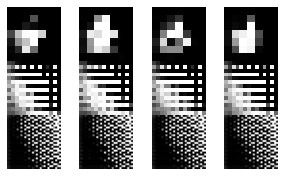

___________________________
tf.Tensor(0.0002631335, shape=(), dtype=float32) - tf.Tensor(9.59458, shape=(), dtype=float32)


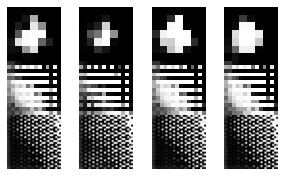

___________________________
tf.Tensor(0.1589435, shape=(), dtype=float32) - tf.Tensor(2.2065878, shape=(), dtype=float32)


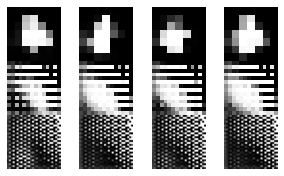

___________________________
tf.Tensor(0.5784762, shape=(), dtype=float32) - tf.Tensor(1.1837316, shape=(), dtype=float32)


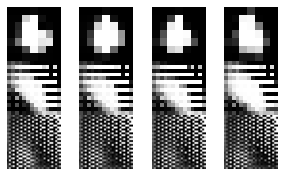

___________________________
tf.Tensor(0.16404122, shape=(), dtype=float32) - tf.Tensor(2.692739, shape=(), dtype=float32)


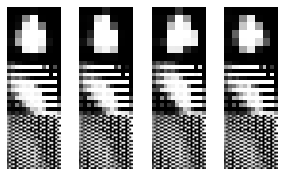

___________________________
tf.Tensor(0.27433756, shape=(), dtype=float32) - tf.Tensor(2.1158817, shape=(), dtype=float32)


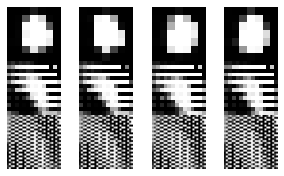

___________________________
tf.Tensor(1.179158, shape=(), dtype=float32) - tf.Tensor(1.0933216, shape=(), dtype=float32)


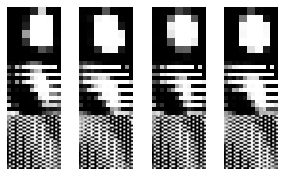

___________________________
tf.Tensor(3.1729336, shape=(), dtype=float32) - tf.Tensor(0.794999, shape=(), dtype=float32)


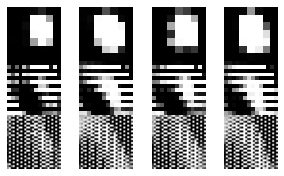

___________________________
tf.Tensor(4.4145126, shape=(), dtype=float32) - tf.Tensor(0.83145666, shape=(), dtype=float32)


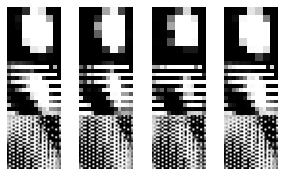

___________________________
tf.Tensor(4.3576694, shape=(), dtype=float32) - tf.Tensor(0.8553296, shape=(), dtype=float32)


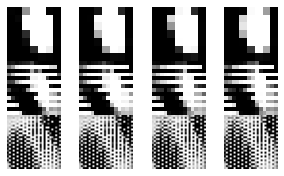

___________________________
tf.Tensor(3.1485991, shape=(), dtype=float32) - tf.Tensor(0.876428, shape=(), dtype=float32)


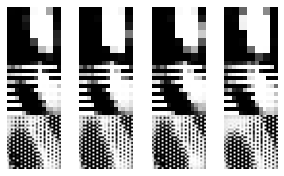

___________________________
tf.Tensor(0.95642805, shape=(), dtype=float32) - tf.Tensor(1.1739993, shape=(), dtype=float32)


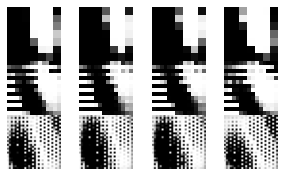

___________________________
tf.Tensor(0.45454803, shape=(), dtype=float32) - tf.Tensor(1.5916913, shape=(), dtype=float32)


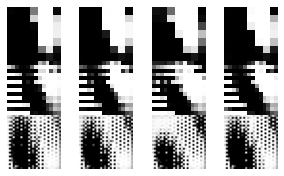

___________________________
tf.Tensor(0.76607764, shape=(), dtype=float32) - tf.Tensor(1.1307683, shape=(), dtype=float32)


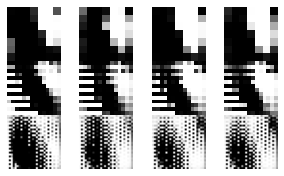

___________________________
tf.Tensor(1.8905166, shape=(), dtype=float32) - tf.Tensor(0.7231591, shape=(), dtype=float32)


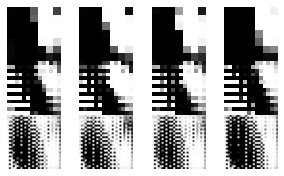

___________________________
tf.Tensor(3.648079, shape=(), dtype=float32) - tf.Tensor(0.61483645, shape=(), dtype=float32)


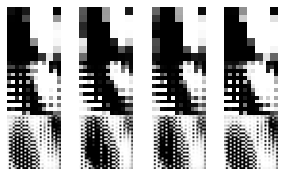

___________________________
tf.Tensor(4.6471195, shape=(), dtype=float32) - tf.Tensor(0.42238086, shape=(), dtype=float32)


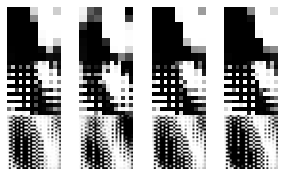

___________________________
tf.Tensor(3.4915047, shape=(), dtype=float32) - tf.Tensor(0.3513075, shape=(), dtype=float32)


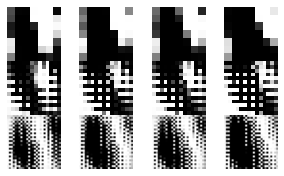

___________________________
tf.Tensor(1.3668745, shape=(), dtype=float32) - tf.Tensor(0.75502753, shape=(), dtype=float32)


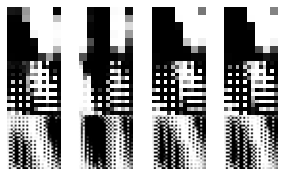

___________________________
tf.Tensor(0.34009928, shape=(), dtype=float32) - tf.Tensor(2.04604, shape=(), dtype=float32)


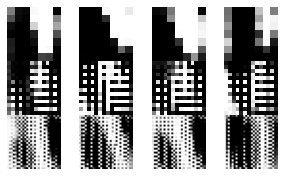

___________________________
tf.Tensor(0.20249327, shape=(), dtype=float32) - tf.Tensor(2.4394543, shape=(), dtype=float32)


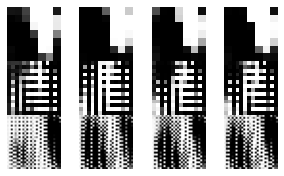

___________________________
tf.Tensor(0.83299005, shape=(), dtype=float32) - tf.Tensor(1.5468402, shape=(), dtype=float32)


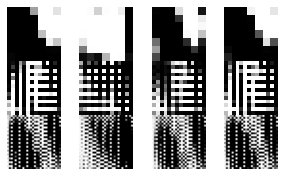

___________________________
tf.Tensor(1.9881607, shape=(), dtype=float32) - tf.Tensor(1.276398, shape=(), dtype=float32)


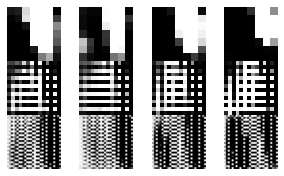

___________________________
tf.Tensor(3.3417726, shape=(), dtype=float32) - tf.Tensor(0.9959291, shape=(), dtype=float32)


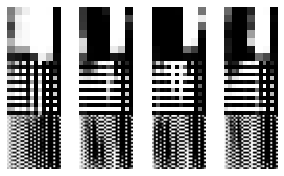

___________________________
tf.Tensor(3.4043505, shape=(), dtype=float32) - tf.Tensor(0.6392069, shape=(), dtype=float32)


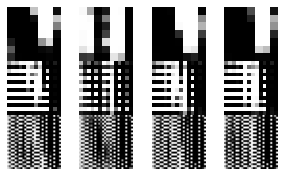

___________________________
tf.Tensor(2.0339944, shape=(), dtype=float32) - tf.Tensor(0.5723791, shape=(), dtype=float32)


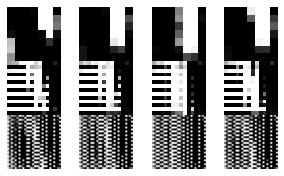

___________________________
tf.Tensor(1.0365827, shape=(), dtype=float32) - tf.Tensor(0.90756804, shape=(), dtype=float32)


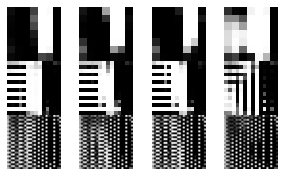

___________________________
tf.Tensor(0.85779065, shape=(), dtype=float32) - tf.Tensor(1.1022778, shape=(), dtype=float32)


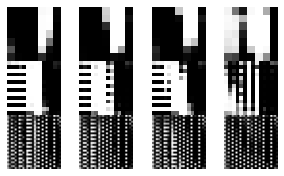

___________________________
tf.Tensor(2.607378, shape=(), dtype=float32) - tf.Tensor(0.74857855, shape=(), dtype=float32)


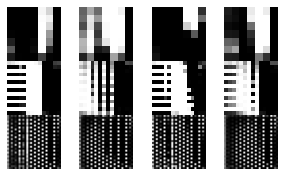

___________________________
tf.Tensor(5.4677124, shape=(), dtype=float32) - tf.Tensor(0.6850363, shape=(), dtype=float32)


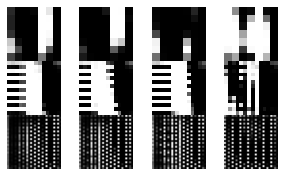

___________________________
tf.Tensor(5.7930627, shape=(), dtype=float32) - tf.Tensor(0.6722878, shape=(), dtype=float32)


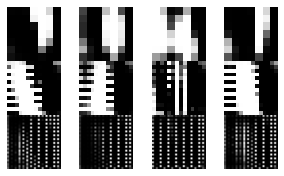

___________________________
tf.Tensor(3.8009677, shape=(), dtype=float32) - tf.Tensor(0.6137025, shape=(), dtype=float32)


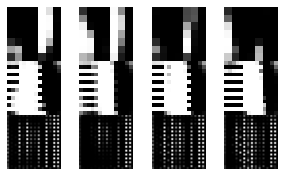

___________________________
tf.Tensor(2.453115, shape=(), dtype=float32) - tf.Tensor(0.4814852, shape=(), dtype=float32)


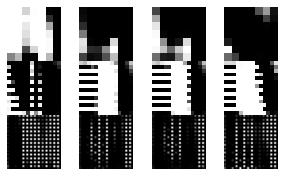

___________________________
tf.Tensor(2.5245657, shape=(), dtype=float32) - tf.Tensor(0.38954613, shape=(), dtype=float32)


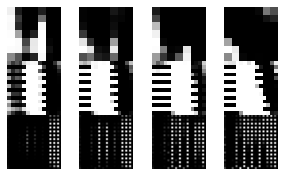

___________________________
tf.Tensor(4.7174883, shape=(), dtype=float32) - tf.Tensor(0.24091925, shape=(), dtype=float32)


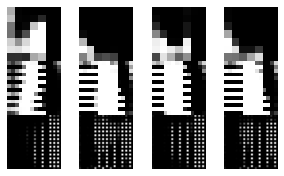

___________________________
tf.Tensor(7.7088213, shape=(), dtype=float32) - tf.Tensor(0.16567805, shape=(), dtype=float32)


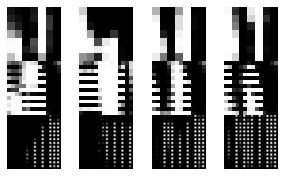

___________________________
tf.Tensor(10.418976, shape=(), dtype=float32) - tf.Tensor(0.18436044, shape=(), dtype=float32)


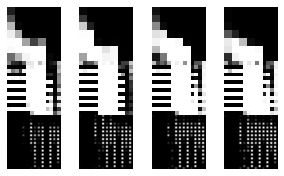

___________________________
tf.Tensor(12.24225, shape=(), dtype=float32) - tf.Tensor(0.14198923, shape=(), dtype=float32)


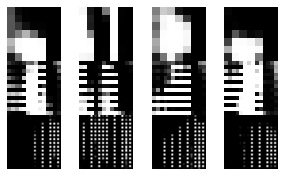

___________________________
tf.Tensor(12.168917, shape=(), dtype=float32) - tf.Tensor(0.07515829, shape=(), dtype=float32)


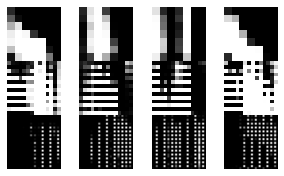

___________________________
tf.Tensor(10.633982, shape=(), dtype=float32) - tf.Tensor(0.017402105, shape=(), dtype=float32)


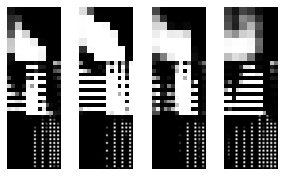

___________________________
tf.Tensor(8.387806, shape=(), dtype=float32) - tf.Tensor(0.089002885, shape=(), dtype=float32)


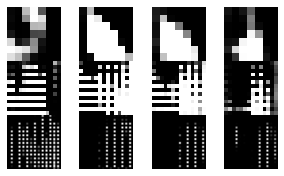

___________________________
tf.Tensor(7.5850697, shape=(), dtype=float32) - tf.Tensor(0.14730525, shape=(), dtype=float32)


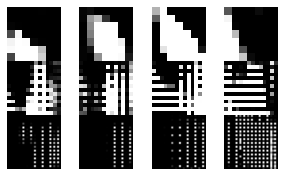

___________________________
tf.Tensor(12.663739, shape=(), dtype=float32) - tf.Tensor(0.049295656, shape=(), dtype=float32)


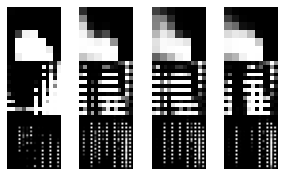

___________________________
tf.Tensor(17.152678, shape=(), dtype=float32) - tf.Tensor(0.55590904, shape=(), dtype=float32)


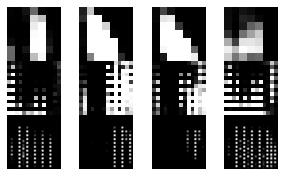

___________________________
tf.Tensor(9.608056, shape=(), dtype=float32) - tf.Tensor(0.08531892, shape=(), dtype=float32)


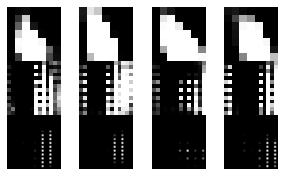

___________________________
tf.Tensor(2.5871043, shape=(), dtype=float32) - tf.Tensor(1.1317418, shape=(), dtype=float32)


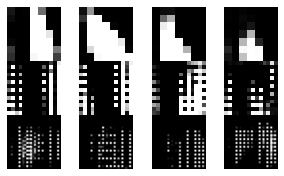

___________________________
tf.Tensor(18.040718, shape=(), dtype=float32) - tf.Tensor(1.2897899, shape=(), dtype=float32)


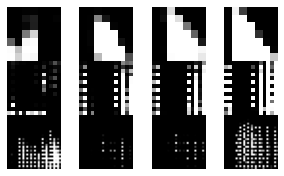

___________________________
tf.Tensor(15.144724, shape=(), dtype=float32) - tf.Tensor(1.9646832, shape=(), dtype=float32)


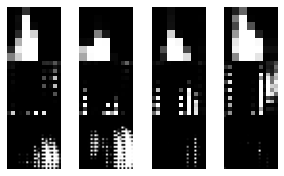

___________________________
tf.Tensor(4.506194, shape=(), dtype=float32) - tf.Tensor(3.5969436, shape=(), dtype=float32)


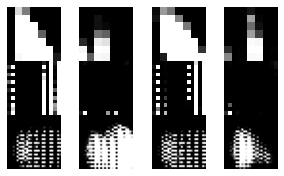

___________________________
tf.Tensor(1.9150023, shape=(), dtype=float32) - tf.Tensor(3.5715687, shape=(), dtype=float32)


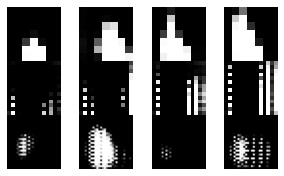

___________________________
tf.Tensor(14.40756, shape=(), dtype=float32) - tf.Tensor(3.4442902, shape=(), dtype=float32)


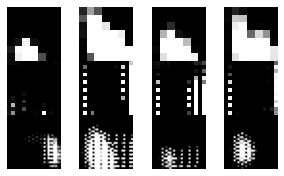

___________________________
tf.Tensor(6.4056015, shape=(), dtype=float32) - tf.Tensor(2.6145558, shape=(), dtype=float32)


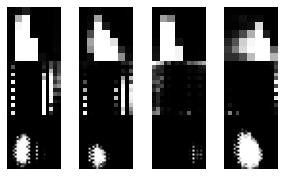

___________________________
tf.Tensor(2.2830276, shape=(), dtype=float32) - tf.Tensor(1.1402835, shape=(), dtype=float32)


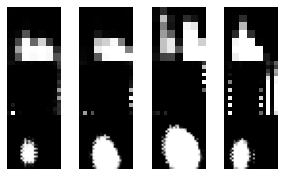

___________________________
tf.Tensor(2.2022412, shape=(), dtype=float32) - tf.Tensor(0.7108449, shape=(), dtype=float32)


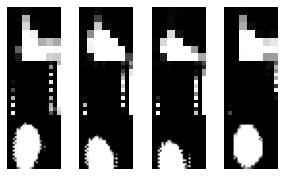

___________________________
tf.Tensor(5.466242, shape=(), dtype=float32) - tf.Tensor(0.32750872, shape=(), dtype=float32)


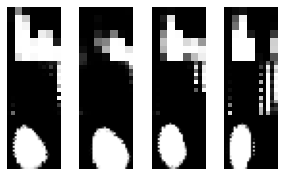

___________________________
tf.Tensor(8.0939455, shape=(), dtype=float32) - tf.Tensor(0.5618144, shape=(), dtype=float32)


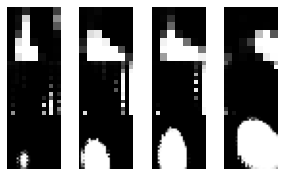

___________________________
tf.Tensor(9.575976, shape=(), dtype=float32) - tf.Tensor(0.6625748, shape=(), dtype=float32)


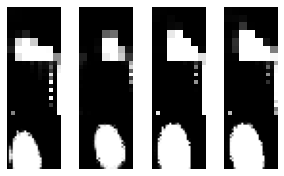

___________________________
tf.Tensor(7.844734, shape=(), dtype=float32) - tf.Tensor(0.5839995, shape=(), dtype=float32)


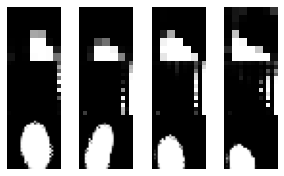

___________________________
tf.Tensor(5.960632, shape=(), dtype=float32) - tf.Tensor(0.5359248, shape=(), dtype=float32)


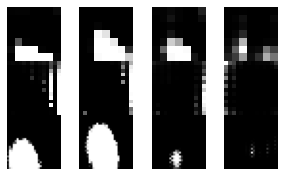

___________________________
tf.Tensor(4.052066, shape=(), dtype=float32) - tf.Tensor(0.3042648, shape=(), dtype=float32)


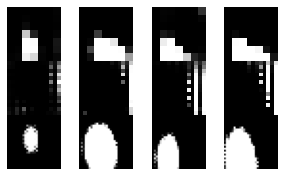

___________________________
tf.Tensor(2.443036, shape=(), dtype=float32) - tf.Tensor(0.2931092, shape=(), dtype=float32)


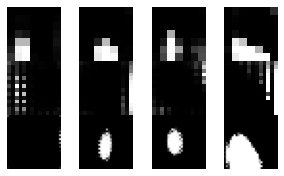

___________________________
tf.Tensor(1.6205957, shape=(), dtype=float32) - tf.Tensor(0.39526016, shape=(), dtype=float32)


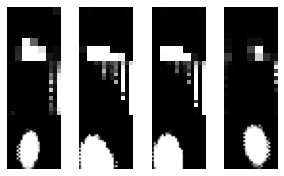

___________________________
tf.Tensor(1.2640331, shape=(), dtype=float32) - tf.Tensor(0.55315363, shape=(), dtype=float32)


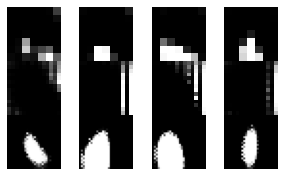

___________________________
tf.Tensor(1.3080646, shape=(), dtype=float32) - tf.Tensor(0.5372059, shape=(), dtype=float32)


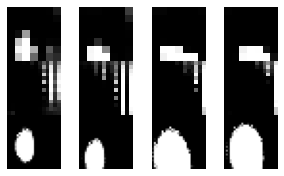

___________________________
tf.Tensor(1.7456908, shape=(), dtype=float32) - tf.Tensor(0.35684115, shape=(), dtype=float32)


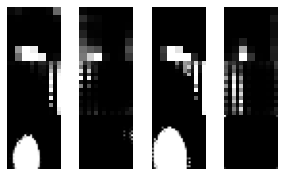

___________________________
tf.Tensor(2.378138, shape=(), dtype=float32) - tf.Tensor(0.25196025, shape=(), dtype=float32)


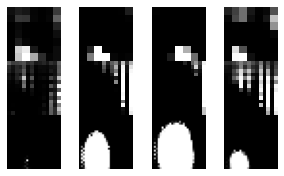

___________________________
tf.Tensor(3.3718753, shape=(), dtype=float32) - tf.Tensor(0.17255564, shape=(), dtype=float32)


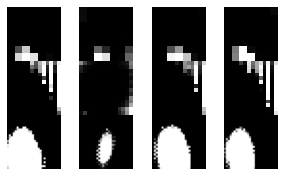

___________________________
tf.Tensor(4.3418846, shape=(), dtype=float32) - tf.Tensor(0.20927444, shape=(), dtype=float32)


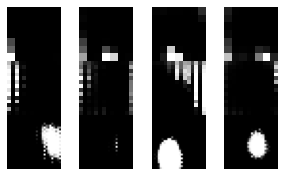

___________________________
tf.Tensor(4.9617057, shape=(), dtype=float32) - tf.Tensor(0.34528968, shape=(), dtype=float32)


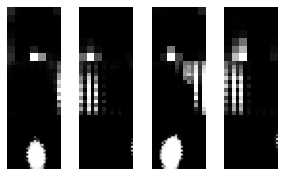

___________________________
tf.Tensor(5.2138186, shape=(), dtype=float32) - tf.Tensor(0.3012895, shape=(), dtype=float32)


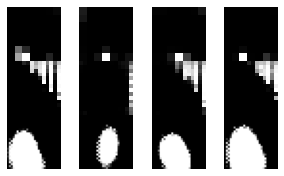

___________________________
tf.Tensor(5.411663, shape=(), dtype=float32) - tf.Tensor(0.79373735, shape=(), dtype=float32)


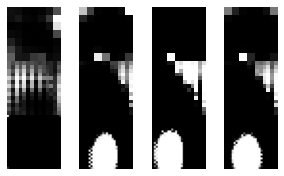

___________________________
tf.Tensor(4.940421, shape=(), dtype=float32) - tf.Tensor(0.4925645, shape=(), dtype=float32)


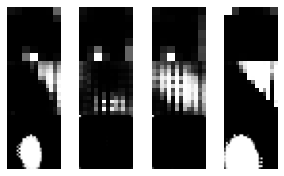

___________________________
tf.Tensor(4.677695, shape=(), dtype=float32) - tf.Tensor(0.9820782, shape=(), dtype=float32)


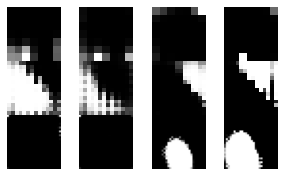

___________________________
tf.Tensor(4.874646, shape=(), dtype=float32) - tf.Tensor(1.2002274, shape=(), dtype=float32)


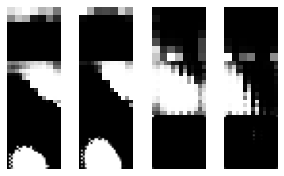

___________________________
tf.Tensor(4.5246515, shape=(), dtype=float32) - tf.Tensor(0.9620793, shape=(), dtype=float32)


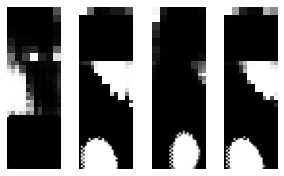

___________________________
tf.Tensor(4.7295923, shape=(), dtype=float32) - tf.Tensor(0.47042578, shape=(), dtype=float32)


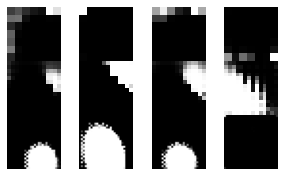

___________________________
tf.Tensor(4.7778826, shape=(), dtype=float32) - tf.Tensor(0.53935766, shape=(), dtype=float32)


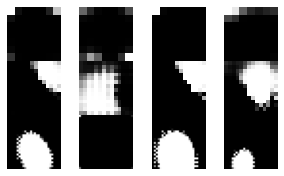

___________________________
tf.Tensor(5.056036, shape=(), dtype=float32) - tf.Tensor(0.23265067, shape=(), dtype=float32)


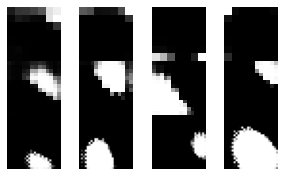

___________________________
tf.Tensor(4.783065, shape=(), dtype=float32) - tf.Tensor(0.23147911, shape=(), dtype=float32)


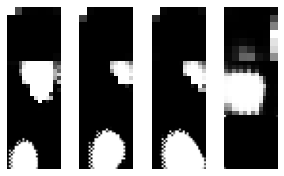

___________________________
tf.Tensor(3.8092504, shape=(), dtype=float32) - tf.Tensor(0.37325972, shape=(), dtype=float32)


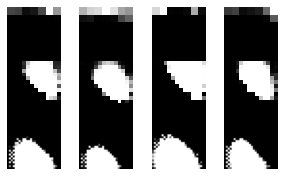

___________________________
tf.Tensor(3.58388, shape=(), dtype=float32) - tf.Tensor(0.2861039, shape=(), dtype=float32)


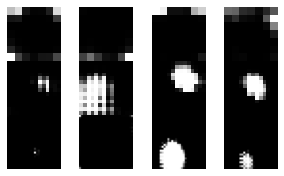

___________________________
tf.Tensor(3.0827909, shape=(), dtype=float32) - tf.Tensor(0.30734128, shape=(), dtype=float32)


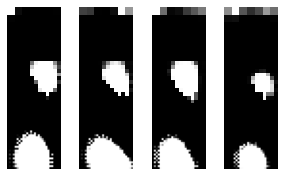

___________________________
tf.Tensor(3.2495074, shape=(), dtype=float32) - tf.Tensor(0.4518737, shape=(), dtype=float32)


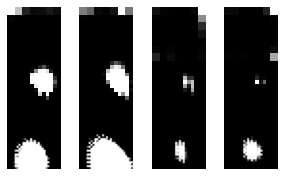

___________________________
tf.Tensor(3.0539708, shape=(), dtype=float32) - tf.Tensor(0.48959982, shape=(), dtype=float32)


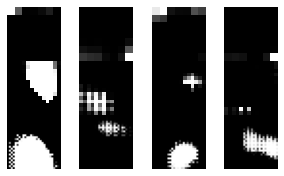

___________________________
tf.Tensor(3.3051772, shape=(), dtype=float32) - tf.Tensor(0.28729576, shape=(), dtype=float32)


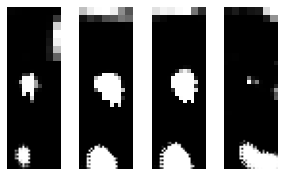

___________________________
tf.Tensor(3.7982702, shape=(), dtype=float32) - tf.Tensor(0.6698987, shape=(), dtype=float32)


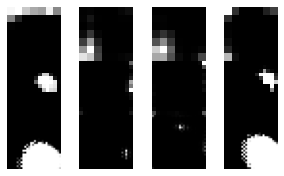

___________________________
tf.Tensor(4.724065, shape=(), dtype=float32) - tf.Tensor(0.69602025, shape=(), dtype=float32)


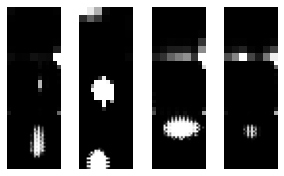

___________________________
tf.Tensor(4.5910015, shape=(), dtype=float32) - tf.Tensor(1.3647256, shape=(), dtype=float32)


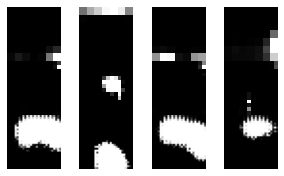

___________________________
tf.Tensor(3.294269, shape=(), dtype=float32) - tf.Tensor(0.5562942, shape=(), dtype=float32)


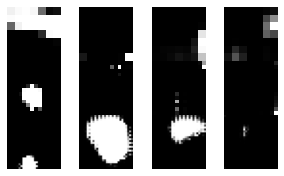

___________________________
tf.Tensor(2.6511784, shape=(), dtype=float32) - tf.Tensor(0.45278066, shape=(), dtype=float32)


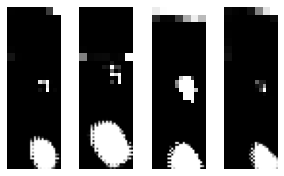

___________________________
tf.Tensor(3.4017315, shape=(), dtype=float32) - tf.Tensor(0.5440345, shape=(), dtype=float32)


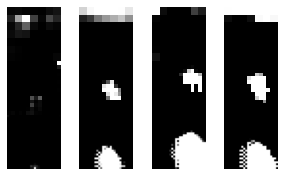

___________________________
tf.Tensor(4.297728, shape=(), dtype=float32) - tf.Tensor(0.62993383, shape=(), dtype=float32)


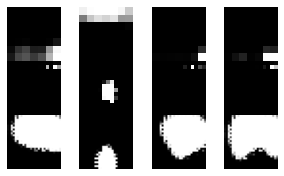

___________________________
tf.Tensor(4.9506946, shape=(), dtype=float32) - tf.Tensor(0.48238677, shape=(), dtype=float32)


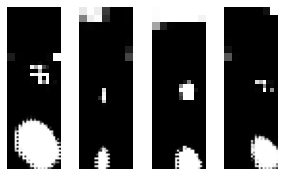

___________________________
tf.Tensor(5.6437693, shape=(), dtype=float32) - tf.Tensor(0.48233685, shape=(), dtype=float32)


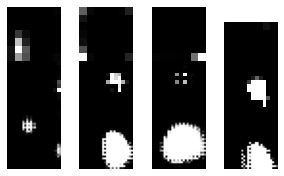

___________________________
tf.Tensor(5.427906, shape=(), dtype=float32) - tf.Tensor(0.5382968, shape=(), dtype=float32)


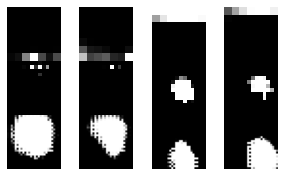

___________________________
tf.Tensor(4.8301163, shape=(), dtype=float32) - tf.Tensor(0.35096693, shape=(), dtype=float32)


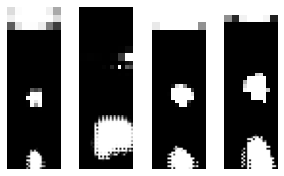

___________________________
tf.Tensor(3.411757, shape=(), dtype=float32) - tf.Tensor(0.33609948, shape=(), dtype=float32)


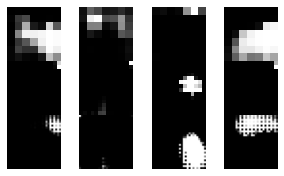

___________________________
tf.Tensor(3.3497388, shape=(), dtype=float32) - tf.Tensor(0.41823983, shape=(), dtype=float32)


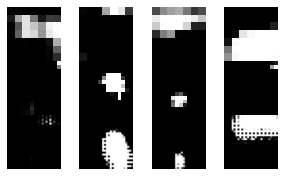

___________________________
tf.Tensor(3.000937, shape=(), dtype=float32) - tf.Tensor(0.38843074, shape=(), dtype=float32)


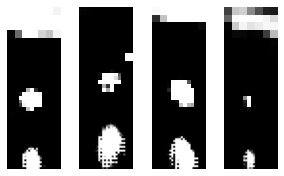

___________________________
tf.Tensor(2.7428179, shape=(), dtype=float32) - tf.Tensor(0.4609135, shape=(), dtype=float32)


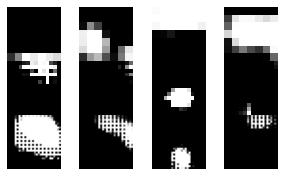

___________________________
tf.Tensor(3.046092, shape=(), dtype=float32) - tf.Tensor(0.5283544, shape=(), dtype=float32)


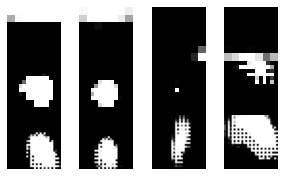

___________________________
tf.Tensor(3.0433216, shape=(), dtype=float32) - tf.Tensor(0.3579736, shape=(), dtype=float32)


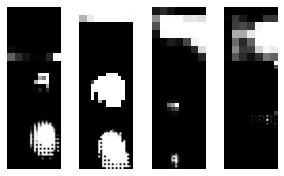

___________________________
tf.Tensor(2.9567168, shape=(), dtype=float32) - tf.Tensor(0.71676767, shape=(), dtype=float32)


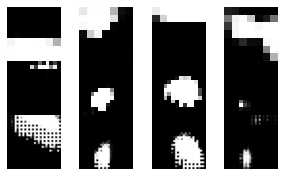

___________________________
tf.Tensor(2.3400443, shape=(), dtype=float32) - tf.Tensor(0.5223525, shape=(), dtype=float32)


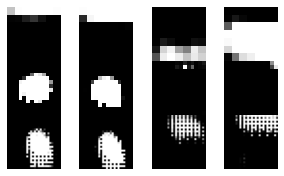

___________________________
tf.Tensor(2.4016707, shape=(), dtype=float32) - tf.Tensor(0.6561426, shape=(), dtype=float32)


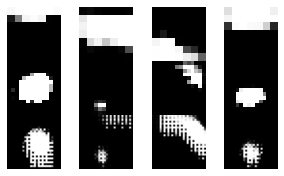

___________________________
tf.Tensor(2.4220643, shape=(), dtype=float32) - tf.Tensor(0.8530512, shape=(), dtype=float32)


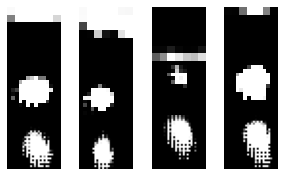

___________________________
tf.Tensor(2.019777, shape=(), dtype=float32) - tf.Tensor(0.7438544, shape=(), dtype=float32)


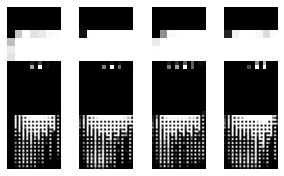

___________________________
tf.Tensor(3.154648, shape=(), dtype=float32) - tf.Tensor(0.37514433, shape=(), dtype=float32)


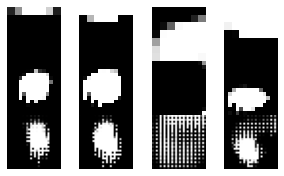

___________________________
tf.Tensor(3.2114491, shape=(), dtype=float32) - tf.Tensor(0.4220502, shape=(), dtype=float32)


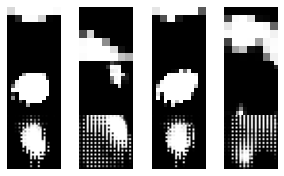

___________________________
tf.Tensor(3.5203738, shape=(), dtype=float32) - tf.Tensor(0.3975582, shape=(), dtype=float32)


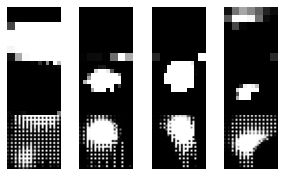

___________________________
tf.Tensor(4.295006, shape=(), dtype=float32) - tf.Tensor(0.2490503, shape=(), dtype=float32)


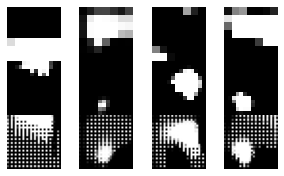

___________________________
tf.Tensor(4.2957516, shape=(), dtype=float32) - tf.Tensor(0.30418658, shape=(), dtype=float32)


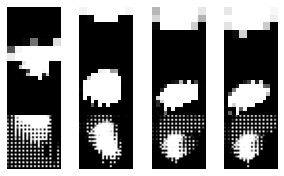

___________________________
tf.Tensor(5.2461643, shape=(), dtype=float32) - tf.Tensor(0.2587159, shape=(), dtype=float32)


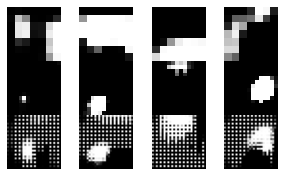

___________________________
tf.Tensor(4.7859507, shape=(), dtype=float32) - tf.Tensor(0.25933444, shape=(), dtype=float32)


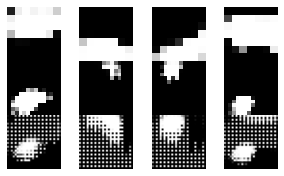

___________________________
tf.Tensor(5.138133, shape=(), dtype=float32) - tf.Tensor(0.17124039, shape=(), dtype=float32)


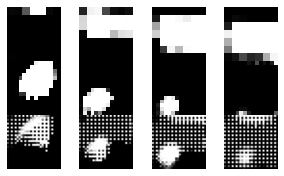

___________________________
tf.Tensor(5.441534, shape=(), dtype=float32) - tf.Tensor(0.25721312, shape=(), dtype=float32)


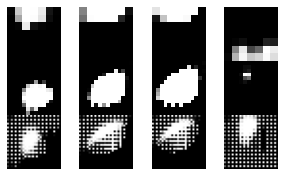

___________________________
tf.Tensor(5.39212, shape=(), dtype=float32) - tf.Tensor(0.28412312, shape=(), dtype=float32)


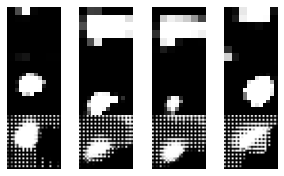

___________________________
tf.Tensor(5.890832, shape=(), dtype=float32) - tf.Tensor(0.24479108, shape=(), dtype=float32)


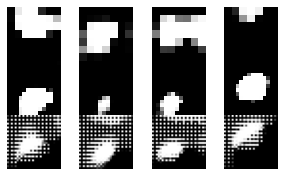

___________________________
tf.Tensor(5.806641, shape=(), dtype=float32) - tf.Tensor(0.27136302, shape=(), dtype=float32)


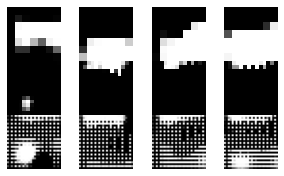

___________________________
tf.Tensor(4.3638444, shape=(), dtype=float32) - tf.Tensor(0.28839797, shape=(), dtype=float32)


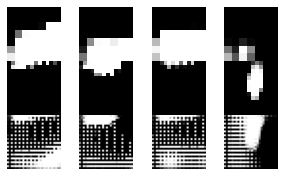

___________________________
tf.Tensor(2.2090814, shape=(), dtype=float32) - tf.Tensor(0.639183, shape=(), dtype=float32)


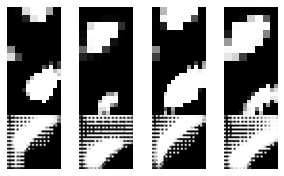

___________________________
tf.Tensor(1.5866878, shape=(), dtype=float32) - tf.Tensor(1.0788052, shape=(), dtype=float32)


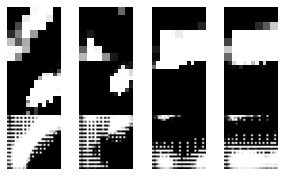

___________________________
tf.Tensor(2.4572415, shape=(), dtype=float32) - tf.Tensor(0.9683177, shape=(), dtype=float32)


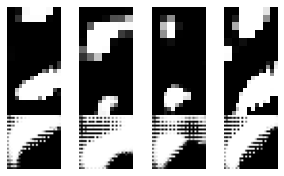

___________________________
tf.Tensor(3.994766, shape=(), dtype=float32) - tf.Tensor(1.2638748, shape=(), dtype=float32)


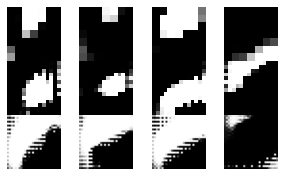

___________________________
tf.Tensor(3.8302987, shape=(), dtype=float32) - tf.Tensor(0.8018847, shape=(), dtype=float32)


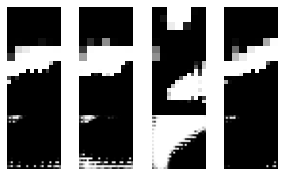

___________________________
tf.Tensor(2.6705482, shape=(), dtype=float32) - tf.Tensor(0.5746209, shape=(), dtype=float32)


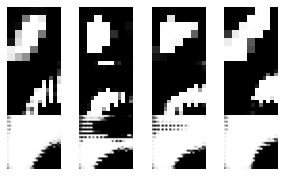

___________________________
tf.Tensor(2.319615, shape=(), dtype=float32) - tf.Tensor(0.59969956, shape=(), dtype=float32)


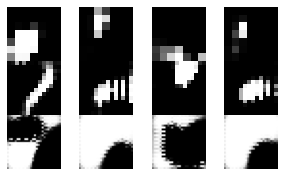

___________________________
tf.Tensor(3.7457228, shape=(), dtype=float32) - tf.Tensor(0.19487695, shape=(), dtype=float32)


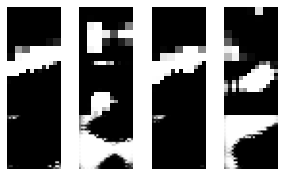

___________________________
tf.Tensor(5.823804, shape=(), dtype=float32) - tf.Tensor(0.34509566, shape=(), dtype=float32)


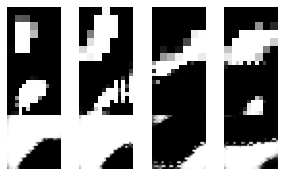

___________________________
tf.Tensor(7.520971, shape=(), dtype=float32) - tf.Tensor(0.17757156, shape=(), dtype=float32)


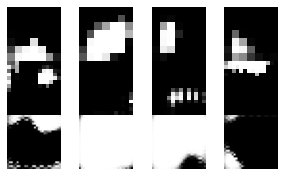

___________________________
tf.Tensor(9.208756, shape=(), dtype=float32) - tf.Tensor(0.17397894, shape=(), dtype=float32)


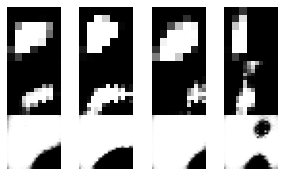

___________________________
tf.Tensor(9.938151, shape=(), dtype=float32) - tf.Tensor(0.25658464, shape=(), dtype=float32)


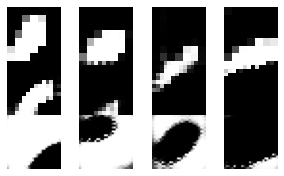

___________________________
tf.Tensor(10.516501, shape=(), dtype=float32) - tf.Tensor(0.09399681, shape=(), dtype=float32)


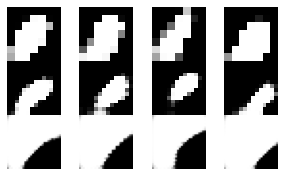

___________________________
tf.Tensor(8.657608, shape=(), dtype=float32) - tf.Tensor(0.19972056, shape=(), dtype=float32)


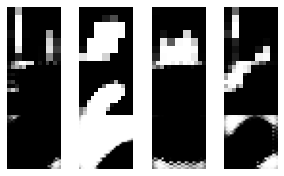

___________________________
tf.Tensor(7.872328, shape=(), dtype=float32) - tf.Tensor(0.21907514, shape=(), dtype=float32)


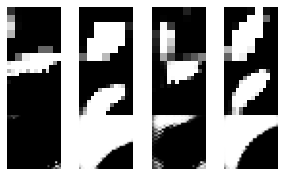

___________________________
tf.Tensor(6.946776, shape=(), dtype=float32) - tf.Tensor(0.08846763, shape=(), dtype=float32)


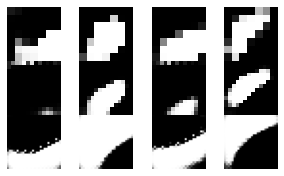

___________________________
tf.Tensor(8.02149, shape=(), dtype=float32) - tf.Tensor(0.18052587, shape=(), dtype=float32)


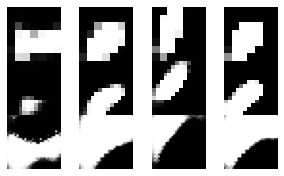

___________________________
tf.Tensor(7.5783153, shape=(), dtype=float32) - tf.Tensor(0.121307395, shape=(), dtype=float32)


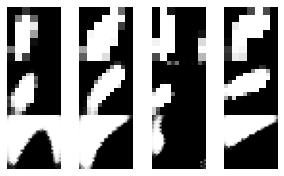

___________________________
tf.Tensor(7.1893005, shape=(), dtype=float32) - tf.Tensor(0.26296818, shape=(), dtype=float32)


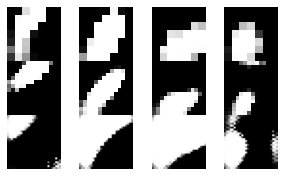

___________________________
tf.Tensor(7.4565854, shape=(), dtype=float32) - tf.Tensor(0.1680193, shape=(), dtype=float32)


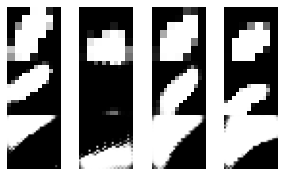

___________________________
tf.Tensor(7.219303, shape=(), dtype=float32) - tf.Tensor(0.061372172, shape=(), dtype=float32)


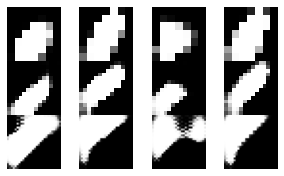

___________________________
tf.Tensor(7.307894, shape=(), dtype=float32) - tf.Tensor(0.18064271, shape=(), dtype=float32)


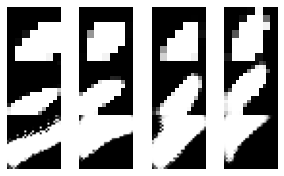

___________________________
tf.Tensor(6.562076, shape=(), dtype=float32) - tf.Tensor(0.10899991, shape=(), dtype=float32)


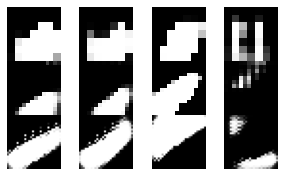

___________________________
tf.Tensor(7.3664193, shape=(), dtype=float32) - tf.Tensor(0.356507, shape=(), dtype=float32)


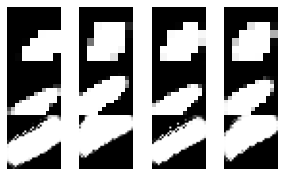

___________________________
tf.Tensor(8.6261015, shape=(), dtype=float32) - tf.Tensor(0.10164721, shape=(), dtype=float32)


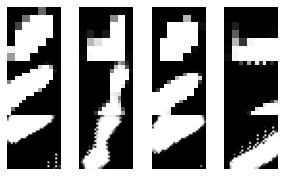

___________________________
tf.Tensor(7.2881193, shape=(), dtype=float32) - tf.Tensor(0.21814057, shape=(), dtype=float32)


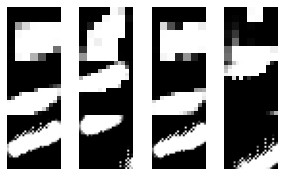

___________________________
tf.Tensor(7.4244223, shape=(), dtype=float32) - tf.Tensor(0.6419982, shape=(), dtype=float32)


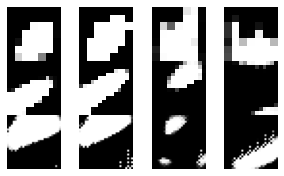

___________________________
tf.Tensor(7.1153574, shape=(), dtype=float32) - tf.Tensor(0.5653117, shape=(), dtype=float32)


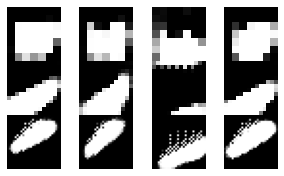

___________________________
tf.Tensor(6.023004, shape=(), dtype=float32) - tf.Tensor(0.6226338, shape=(), dtype=float32)


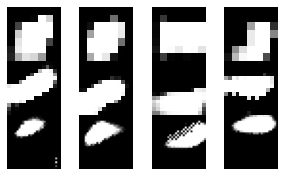

___________________________
tf.Tensor(5.1876674, shape=(), dtype=float32) - tf.Tensor(0.99073243, shape=(), dtype=float32)


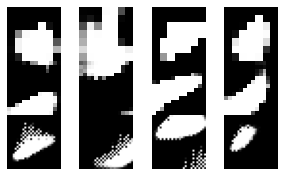

___________________________
tf.Tensor(4.3895254, shape=(), dtype=float32) - tf.Tensor(0.6132872, shape=(), dtype=float32)


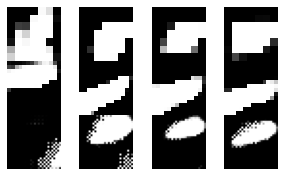

___________________________
tf.Tensor(4.938042, shape=(), dtype=float32) - tf.Tensor(1.0370214, shape=(), dtype=float32)


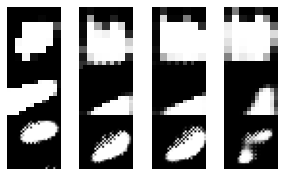

___________________________
tf.Tensor(3.85252, shape=(), dtype=float32) - tf.Tensor(0.6470179, shape=(), dtype=float32)


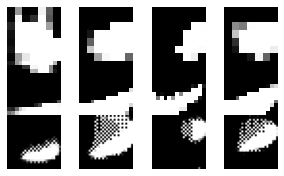

___________________________
tf.Tensor(3.9849832, shape=(), dtype=float32) - tf.Tensor(1.080078, shape=(), dtype=float32)


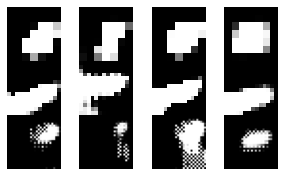

___________________________
tf.Tensor(3.2119288, shape=(), dtype=float32) - tf.Tensor(0.6726706, shape=(), dtype=float32)


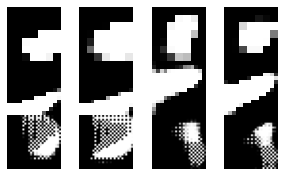

___________________________
tf.Tensor(4.687497, shape=(), dtype=float32) - tf.Tensor(0.92006016, shape=(), dtype=float32)


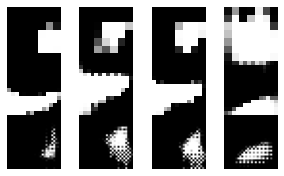

___________________________
tf.Tensor(4.814349, shape=(), dtype=float32) - tf.Tensor(0.3132496, shape=(), dtype=float32)


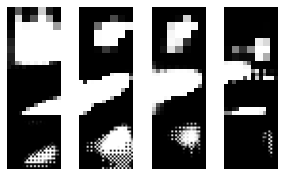

___________________________
tf.Tensor(4.5228086, shape=(), dtype=float32) - tf.Tensor(0.38929242, shape=(), dtype=float32)


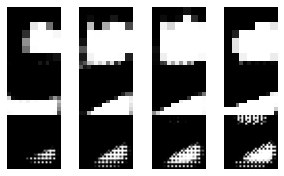

___________________________
tf.Tensor(5.6202636, shape=(), dtype=float32) - tf.Tensor(0.2623536, shape=(), dtype=float32)


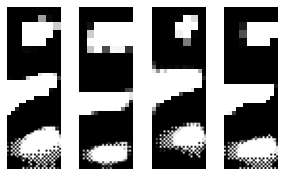

___________________________
tf.Tensor(6.086998, shape=(), dtype=float32) - tf.Tensor(0.58670175, shape=(), dtype=float32)


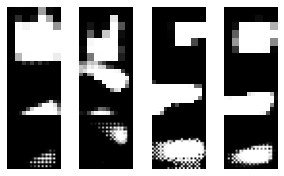

___________________________
tf.Tensor(6.084388, shape=(), dtype=float32) - tf.Tensor(0.6266043, shape=(), dtype=float32)


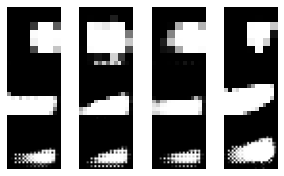

___________________________
tf.Tensor(5.3070736, shape=(), dtype=float32) - tf.Tensor(0.75260377, shape=(), dtype=float32)


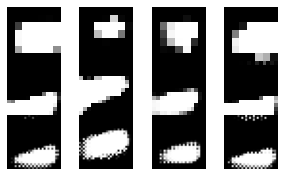

___________________________
tf.Tensor(5.208166, shape=(), dtype=float32) - tf.Tensor(0.9403414, shape=(), dtype=float32)


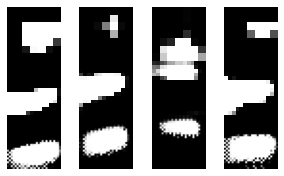

___________________________
tf.Tensor(6.646054, shape=(), dtype=float32) - tf.Tensor(0.7920754, shape=(), dtype=float32)


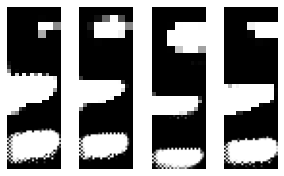

___________________________
tf.Tensor(4.231801, shape=(), dtype=float32) - tf.Tensor(0.7404907, shape=(), dtype=float32)


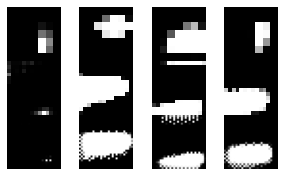

___________________________
tf.Tensor(3.0429525, shape=(), dtype=float32) - tf.Tensor(0.6571264, shape=(), dtype=float32)


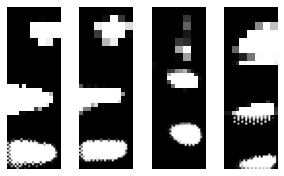

___________________________
tf.Tensor(2.7976947, shape=(), dtype=float32) - tf.Tensor(0.5177016, shape=(), dtype=float32)


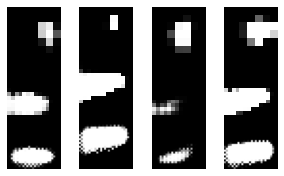

___________________________
tf.Tensor(3.9859254, shape=(), dtype=float32) - tf.Tensor(0.4012082, shape=(), dtype=float32)


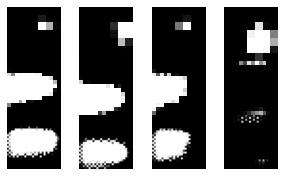

___________________________
tf.Tensor(3.7574093, shape=(), dtype=float32) - tf.Tensor(0.41285375, shape=(), dtype=float32)


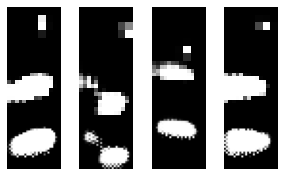

___________________________
tf.Tensor(3.364704, shape=(), dtype=float32) - tf.Tensor(0.23870963, shape=(), dtype=float32)


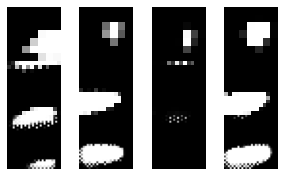

___________________________
tf.Tensor(3.4125457, shape=(), dtype=float32) - tf.Tensor(0.48864335, shape=(), dtype=float32)


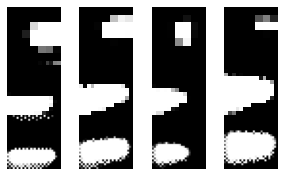

___________________________
tf.Tensor(3.6066074, shape=(), dtype=float32) - tf.Tensor(0.3207595, shape=(), dtype=float32)


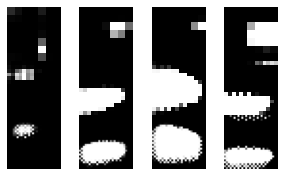

___________________________
tf.Tensor(3.2401474, shape=(), dtype=float32) - tf.Tensor(0.4132004, shape=(), dtype=float32)


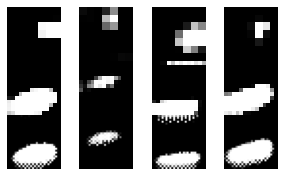

___________________________
tf.Tensor(4.0391817, shape=(), dtype=float32) - tf.Tensor(0.41251135, shape=(), dtype=float32)


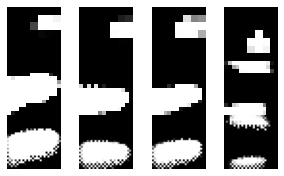

___________________________
tf.Tensor(4.4917197, shape=(), dtype=float32) - tf.Tensor(0.5761724, shape=(), dtype=float32)


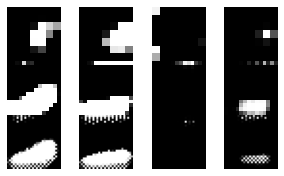

___________________________
tf.Tensor(4.3417015, shape=(), dtype=float32) - tf.Tensor(0.5584768, shape=(), dtype=float32)


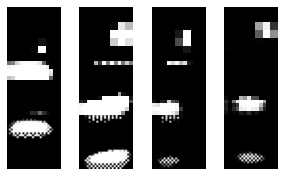

___________________________
tf.Tensor(4.489949, shape=(), dtype=float32) - tf.Tensor(0.4424403, shape=(), dtype=float32)


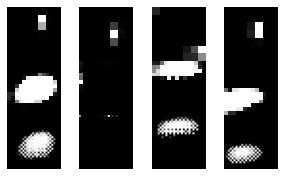

___________________________
tf.Tensor(4.807556, shape=(), dtype=float32) - tf.Tensor(0.5915523, shape=(), dtype=float32)


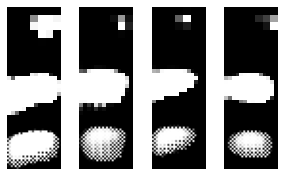

___________________________
tf.Tensor(5.4215484, shape=(), dtype=float32) - tf.Tensor(0.38993, shape=(), dtype=float32)


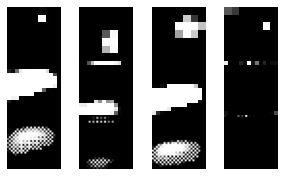

___________________________
tf.Tensor(5.6977406, shape=(), dtype=float32) - tf.Tensor(0.2581874, shape=(), dtype=float32)


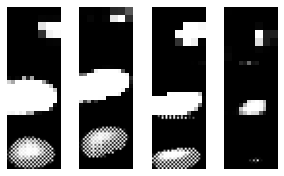

___________________________
tf.Tensor(5.0731773, shape=(), dtype=float32) - tf.Tensor(0.39974782, shape=(), dtype=float32)


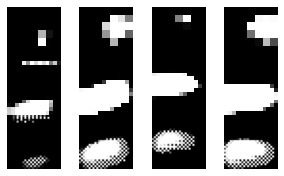

___________________________
tf.Tensor(4.255599, shape=(), dtype=float32) - tf.Tensor(0.19100878, shape=(), dtype=float32)


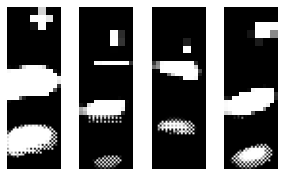

___________________________
tf.Tensor(4.0083623, shape=(), dtype=float32) - tf.Tensor(0.33734208, shape=(), dtype=float32)


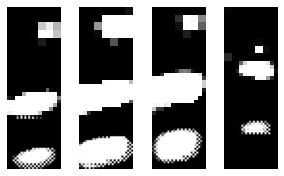

___________________________
tf.Tensor(5.4545727, shape=(), dtype=float32) - tf.Tensor(0.29340076, shape=(), dtype=float32)


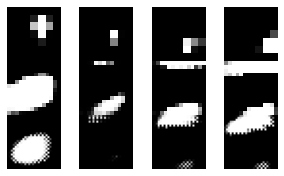

___________________________
tf.Tensor(5.8653526, shape=(), dtype=float32) - tf.Tensor(0.10636571, shape=(), dtype=float32)


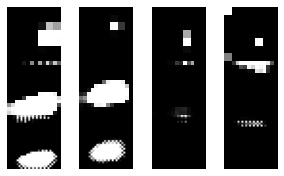

___________________________
tf.Tensor(5.7734704, shape=(), dtype=float32) - tf.Tensor(0.21348608, shape=(), dtype=float32)


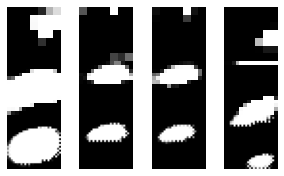

___________________________
tf.Tensor(4.39601, shape=(), dtype=float32) - tf.Tensor(0.25308138, shape=(), dtype=float32)


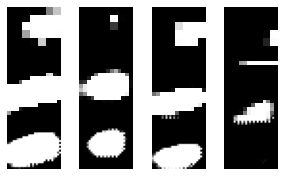

___________________________
tf.Tensor(4.272218, shape=(), dtype=float32) - tf.Tensor(0.30046165, shape=(), dtype=float32)


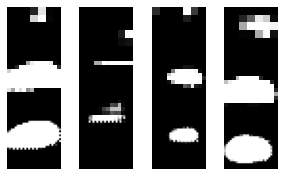

___________________________
tf.Tensor(3.5917141, shape=(), dtype=float32) - tf.Tensor(0.38667536, shape=(), dtype=float32)


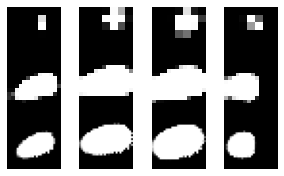

___________________________
tf.Tensor(3.6782732, shape=(), dtype=float32) - tf.Tensor(0.2442857, shape=(), dtype=float32)


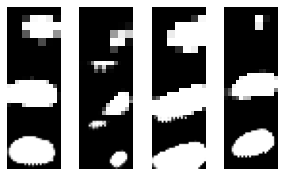

___________________________
tf.Tensor(3.310395, shape=(), dtype=float32) - tf.Tensor(0.37398, shape=(), dtype=float32)


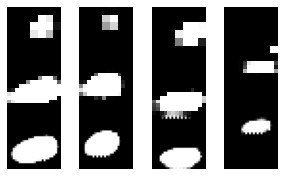

___________________________
tf.Tensor(3.2477045, shape=(), dtype=float32) - tf.Tensor(0.41491082, shape=(), dtype=float32)


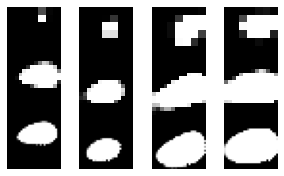

___________________________
tf.Tensor(5.4399505, shape=(), dtype=float32) - tf.Tensor(0.37133288, shape=(), dtype=float32)


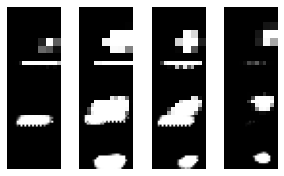

___________________________
tf.Tensor(6.1031694, shape=(), dtype=float32) - tf.Tensor(0.2655186, shape=(), dtype=float32)


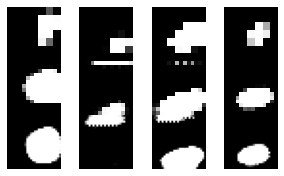

___________________________
tf.Tensor(4.52053, shape=(), dtype=float32) - tf.Tensor(0.29337788, shape=(), dtype=float32)


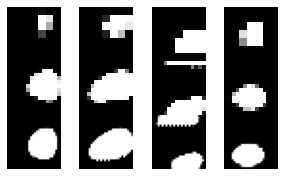

___________________________
tf.Tensor(3.722639, shape=(), dtype=float32) - tf.Tensor(0.3942158, shape=(), dtype=float32)


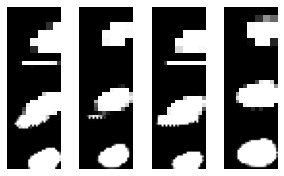

___________________________
tf.Tensor(4.2068295, shape=(), dtype=float32) - tf.Tensor(0.49171737, shape=(), dtype=float32)


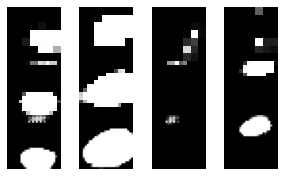

___________________________
tf.Tensor(6.0124607, shape=(), dtype=float32) - tf.Tensor(0.28756166, shape=(), dtype=float32)


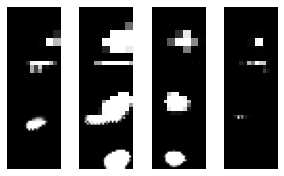

___________________________
tf.Tensor(6.3069925, shape=(), dtype=float32) - tf.Tensor(0.4147311, shape=(), dtype=float32)


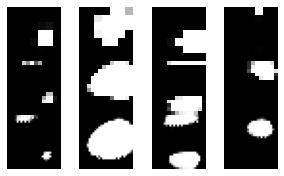

___________________________
tf.Tensor(5.5385313, shape=(), dtype=float32) - tf.Tensor(0.48657203, shape=(), dtype=float32)


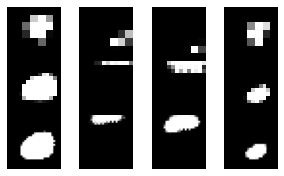

___________________________
tf.Tensor(4.116272, shape=(), dtype=float32) - tf.Tensor(0.2567253, shape=(), dtype=float32)


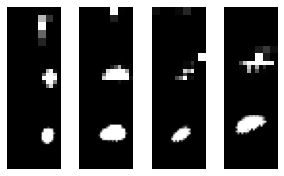

___________________________
tf.Tensor(2.8963394, shape=(), dtype=float32) - tf.Tensor(0.59389263, shape=(), dtype=float32)


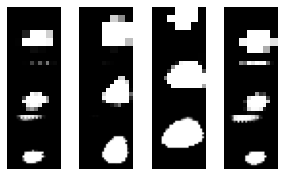

___________________________
tf.Tensor(4.667625, shape=(), dtype=float32) - tf.Tensor(0.72265774, shape=(), dtype=float32)


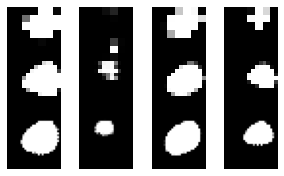

___________________________
tf.Tensor(6.2734327, shape=(), dtype=float32) - tf.Tensor(0.9031166, shape=(), dtype=float32)


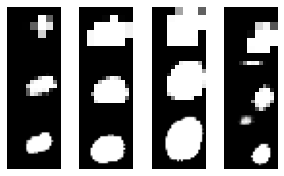

___________________________
tf.Tensor(5.7431297, shape=(), dtype=float32) - tf.Tensor(1.18789, shape=(), dtype=float32)


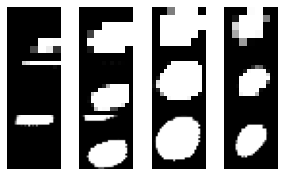

___________________________
tf.Tensor(2.794878, shape=(), dtype=float32) - tf.Tensor(0.7430715, shape=(), dtype=float32)


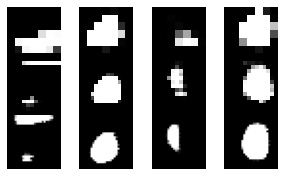

___________________________
tf.Tensor(1.6691694, shape=(), dtype=float32) - tf.Tensor(1.0708957, shape=(), dtype=float32)


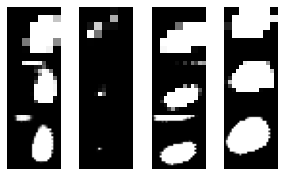

___________________________
tf.Tensor(2.7395983, shape=(), dtype=float32) - tf.Tensor(0.5328591, shape=(), dtype=float32)


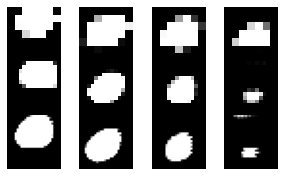

___________________________
tf.Tensor(5.0387907, shape=(), dtype=float32) - tf.Tensor(0.778554, shape=(), dtype=float32)


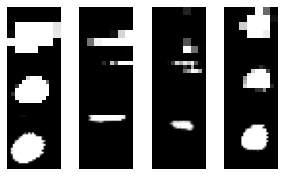

___________________________
tf.Tensor(4.647226, shape=(), dtype=float32) - tf.Tensor(0.47432506, shape=(), dtype=float32)


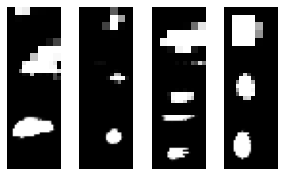

___________________________
tf.Tensor(2.2367811, shape=(), dtype=float32) - tf.Tensor(0.48135856, shape=(), dtype=float32)


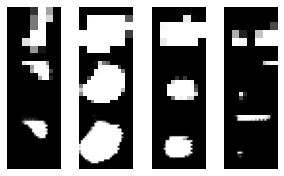

___________________________
tf.Tensor(1.8885641, shape=(), dtype=float32) - tf.Tensor(0.537465, shape=(), dtype=float32)


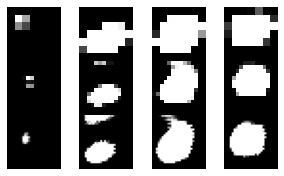

___________________________
tf.Tensor(2.4742515, shape=(), dtype=float32) - tf.Tensor(0.3590611, shape=(), dtype=float32)


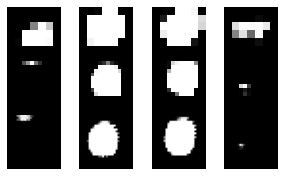

___________________________
tf.Tensor(3.8769612, shape=(), dtype=float32) - tf.Tensor(0.40216947, shape=(), dtype=float32)


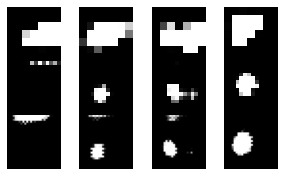

___________________________
tf.Tensor(3.707759, shape=(), dtype=float32) - tf.Tensor(0.254951, shape=(), dtype=float32)


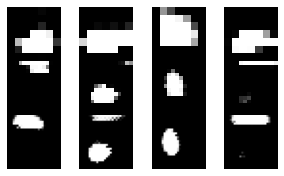

___________________________
tf.Tensor(3.6102858, shape=(), dtype=float32) - tf.Tensor(0.17141727, shape=(), dtype=float32)


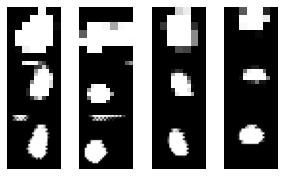

___________________________
tf.Tensor(2.5018697, shape=(), dtype=float32) - tf.Tensor(0.3088647, shape=(), dtype=float32)


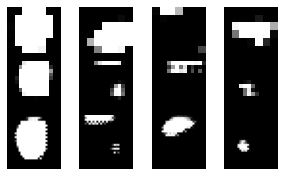

___________________________
tf.Tensor(3.001165, shape=(), dtype=float32) - tf.Tensor(0.33379978, shape=(), dtype=float32)


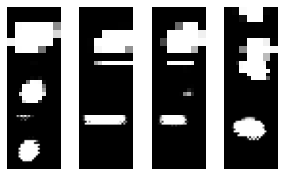

___________________________
tf.Tensor(3.5751157, shape=(), dtype=float32) - tf.Tensor(0.2732979, shape=(), dtype=float32)


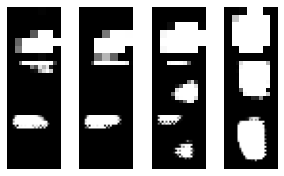

___________________________
tf.Tensor(4.9145937, shape=(), dtype=float32) - tf.Tensor(0.25522828, shape=(), dtype=float32)


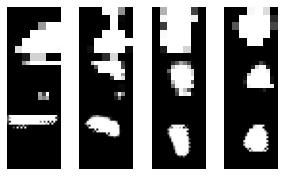

___________________________
tf.Tensor(6.7427826, shape=(), dtype=float32) - tf.Tensor(0.6225426, shape=(), dtype=float32)


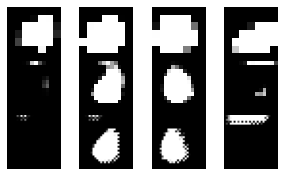

___________________________
tf.Tensor(5.8286753, shape=(), dtype=float32) - tf.Tensor(0.40368098, shape=(), dtype=float32)


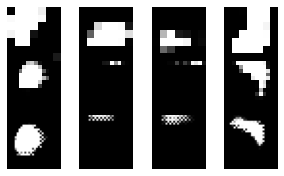

___________________________
tf.Tensor(3.6844976, shape=(), dtype=float32) - tf.Tensor(0.31042123, shape=(), dtype=float32)


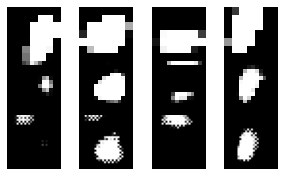

___________________________
tf.Tensor(4.349243, shape=(), dtype=float32) - tf.Tensor(0.18574335, shape=(), dtype=float32)


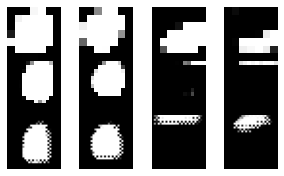

___________________________
tf.Tensor(5.0094967, shape=(), dtype=float32) - tf.Tensor(0.30218711, shape=(), dtype=float32)


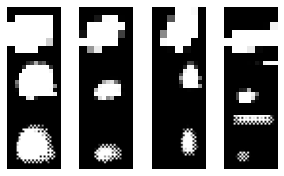

___________________________
tf.Tensor(5.4487906, shape=(), dtype=float32) - tf.Tensor(0.23113641, shape=(), dtype=float32)


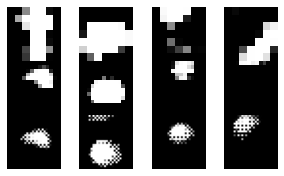

___________________________
tf.Tensor(5.413888, shape=(), dtype=float32) - tf.Tensor(0.08694078, shape=(), dtype=float32)


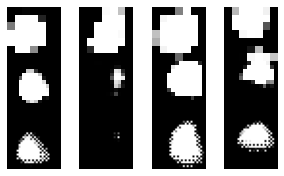

___________________________
tf.Tensor(5.391054, shape=(), dtype=float32) - tf.Tensor(0.17591342, shape=(), dtype=float32)


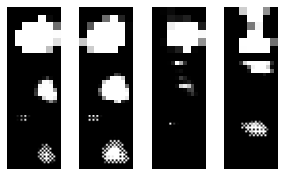

___________________________
tf.Tensor(5.570264, shape=(), dtype=float32) - tf.Tensor(0.054687105, shape=(), dtype=float32)


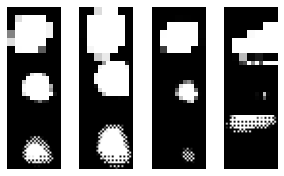

___________________________
tf.Tensor(5.8470526, shape=(), dtype=float32) - tf.Tensor(0.040122285, shape=(), dtype=float32)


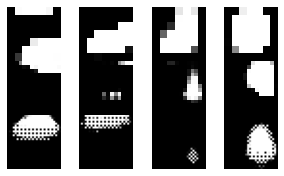

___________________________
tf.Tensor(6.3805285, shape=(), dtype=float32) - tf.Tensor(0.02473395, shape=(), dtype=float32)


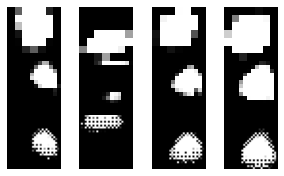

___________________________
tf.Tensor(5.418544, shape=(), dtype=float32) - tf.Tensor(0.05277347, shape=(), dtype=float32)


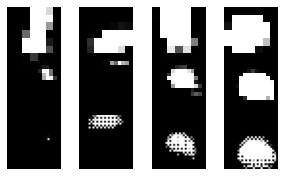

___________________________
tf.Tensor(5.9660883, shape=(), dtype=float32) - tf.Tensor(0.05054015, shape=(), dtype=float32)


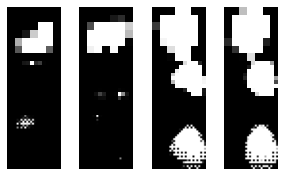

___________________________
tf.Tensor(6.3869987, shape=(), dtype=float32) - tf.Tensor(0.07915205, shape=(), dtype=float32)


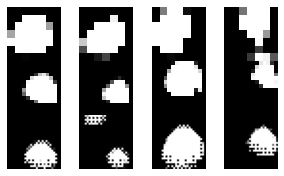

___________________________
tf.Tensor(5.261841, shape=(), dtype=float32) - tf.Tensor(0.14485753, shape=(), dtype=float32)


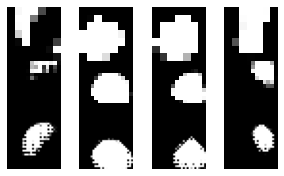

___________________________
tf.Tensor(7.021799, shape=(), dtype=float32) - tf.Tensor(0.052973635, shape=(), dtype=float32)


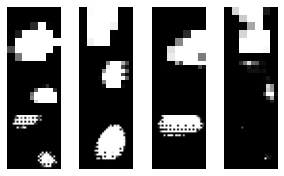

___________________________
tf.Tensor(8.494343, shape=(), dtype=float32) - tf.Tensor(0.16142912, shape=(), dtype=float32)


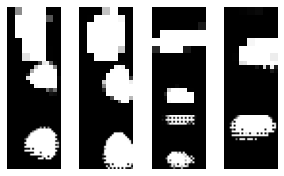

___________________________
tf.Tensor(7.1234455, shape=(), dtype=float32) - tf.Tensor(0.12759629, shape=(), dtype=float32)


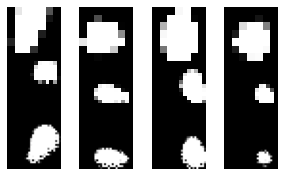

___________________________
tf.Tensor(6.2055607, shape=(), dtype=float32) - tf.Tensor(0.18272561, shape=(), dtype=float32)


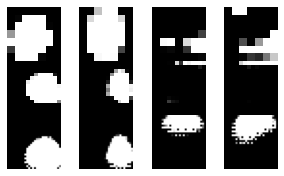

___________________________
tf.Tensor(4.68581, shape=(), dtype=float32) - tf.Tensor(0.19865444, shape=(), dtype=float32)


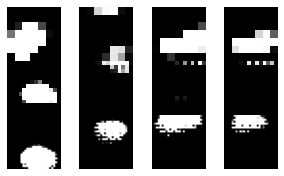

___________________________
tf.Tensor(3.9920177, shape=(), dtype=float32) - tf.Tensor(0.16626835, shape=(), dtype=float32)


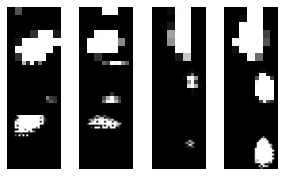

___________________________
tf.Tensor(4.3536224, shape=(), dtype=float32) - tf.Tensor(0.14055312, shape=(), dtype=float32)


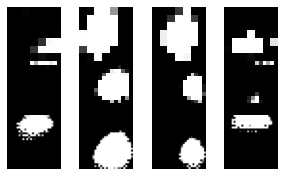

___________________________
tf.Tensor(5.1384435, shape=(), dtype=float32) - tf.Tensor(0.21323195, shape=(), dtype=float32)


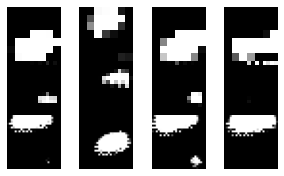

___________________________
tf.Tensor(5.1665936, shape=(), dtype=float32) - tf.Tensor(0.20509875, shape=(), dtype=float32)


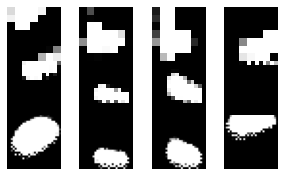

___________________________
tf.Tensor(5.9596395, shape=(), dtype=float32) - tf.Tensor(0.07372748, shape=(), dtype=float32)


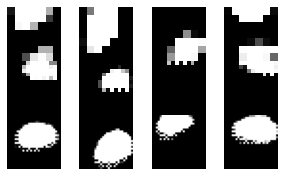

___________________________
tf.Tensor(7.3394756, shape=(), dtype=float32) - tf.Tensor(0.14151311, shape=(), dtype=float32)


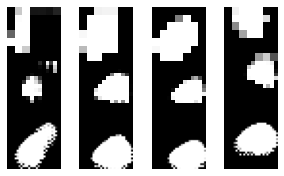

___________________________
tf.Tensor(7.841676, shape=(), dtype=float32) - tf.Tensor(0.112407885, shape=(), dtype=float32)


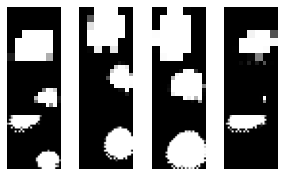

___________________________
tf.Tensor(8.137251, shape=(), dtype=float32) - tf.Tensor(0.06908896, shape=(), dtype=float32)


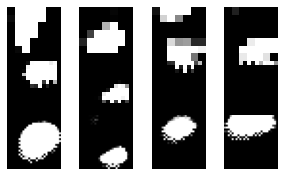

___________________________
tf.Tensor(8.68532, shape=(), dtype=float32) - tf.Tensor(0.25992417, shape=(), dtype=float32)


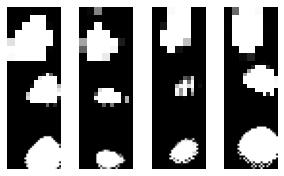

___________________________
tf.Tensor(8.236574, shape=(), dtype=float32) - tf.Tensor(0.053417325, shape=(), dtype=float32)


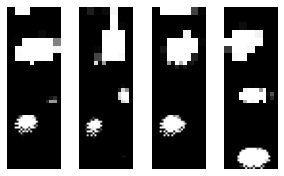

___________________________
tf.Tensor(6.942223, shape=(), dtype=float32) - tf.Tensor(0.15290113, shape=(), dtype=float32)


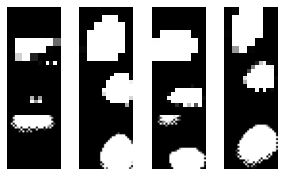

___________________________
tf.Tensor(7.483363, shape=(), dtype=float32) - tf.Tensor(0.12406354, shape=(), dtype=float32)


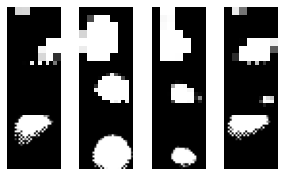

___________________________
tf.Tensor(8.973757, shape=(), dtype=float32) - tf.Tensor(0.038586862, shape=(), dtype=float32)


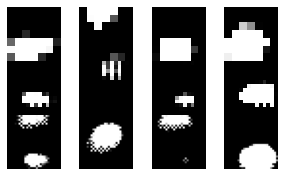

___________________________
tf.Tensor(8.457922, shape=(), dtype=float32) - tf.Tensor(0.19829334, shape=(), dtype=float32)


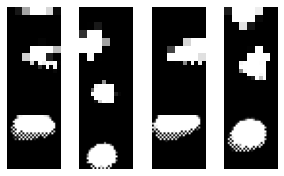

___________________________
tf.Tensor(6.8832455, shape=(), dtype=float32) - tf.Tensor(0.09805841, shape=(), dtype=float32)


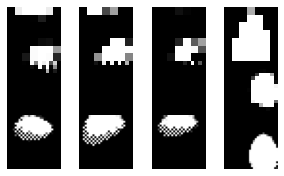

___________________________
tf.Tensor(5.016879, shape=(), dtype=float32) - tf.Tensor(0.33757553, shape=(), dtype=float32)


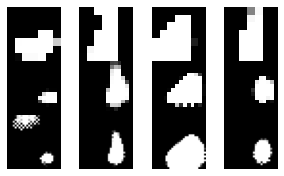

___________________________
tf.Tensor(5.98939, shape=(), dtype=float32) - tf.Tensor(0.1635128, shape=(), dtype=float32)


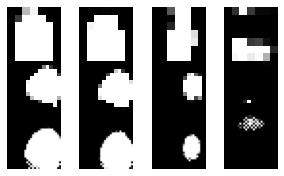

___________________________
tf.Tensor(7.985566, shape=(), dtype=float32) - tf.Tensor(0.17207557, shape=(), dtype=float32)


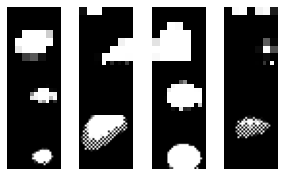

___________________________
tf.Tensor(8.737331, shape=(), dtype=float32) - tf.Tensor(0.6402525, shape=(), dtype=float32)


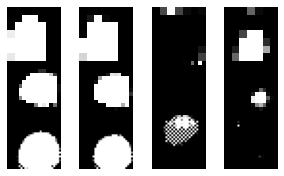

___________________________
tf.Tensor(6.9774218, shape=(), dtype=float32) - tf.Tensor(0.08236808, shape=(), dtype=float32)


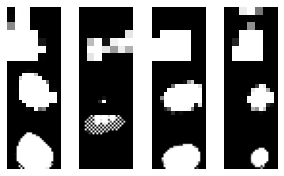

___________________________
tf.Tensor(6.4845085, shape=(), dtype=float32) - tf.Tensor(0.09968119, shape=(), dtype=float32)


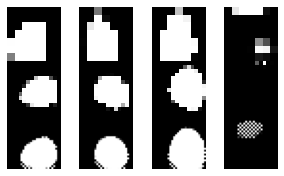

___________________________
tf.Tensor(6.9533195, shape=(), dtype=float32) - tf.Tensor(0.04826583, shape=(), dtype=float32)


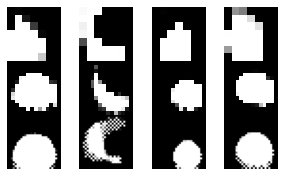

___________________________
tf.Tensor(6.778718, shape=(), dtype=float32) - tf.Tensor(0.13581625, shape=(), dtype=float32)


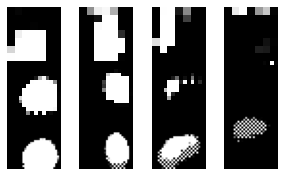

___________________________
tf.Tensor(6.5927343, shape=(), dtype=float32) - tf.Tensor(0.12852329, shape=(), dtype=float32)


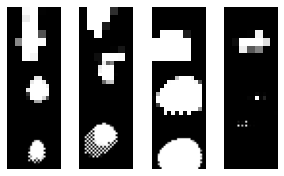

___________________________
tf.Tensor(8.07832, shape=(), dtype=float32) - tf.Tensor(0.15645382, shape=(), dtype=float32)


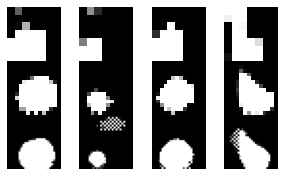

___________________________
tf.Tensor(10.366357, shape=(), dtype=float32) - tf.Tensor(0.06302607, shape=(), dtype=float32)


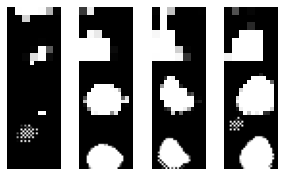

___________________________
tf.Tensor(11.644943, shape=(), dtype=float32) - tf.Tensor(0.19042571, shape=(), dtype=float32)


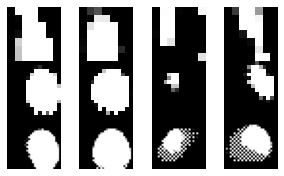

___________________________
tf.Tensor(12.54067, shape=(), dtype=float32) - tf.Tensor(0.08077738, shape=(), dtype=float32)


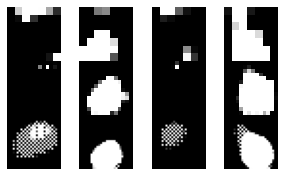

___________________________
tf.Tensor(12.210778, shape=(), dtype=float32) - tf.Tensor(0.17587177, shape=(), dtype=float32)


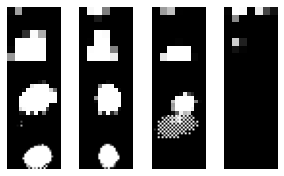

___________________________
tf.Tensor(11.128034, shape=(), dtype=float32) - tf.Tensor(0.06502485, shape=(), dtype=float32)


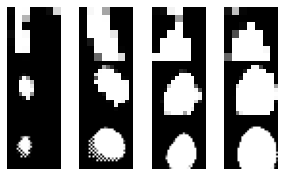

___________________________
tf.Tensor(10.522397, shape=(), dtype=float32) - tf.Tensor(0.22986189, shape=(), dtype=float32)


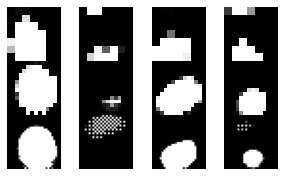

___________________________
tf.Tensor(8.6570015, shape=(), dtype=float32) - tf.Tensor(0.22799835, shape=(), dtype=float32)


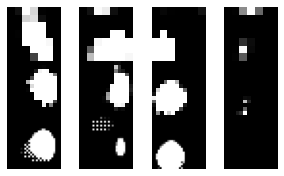

___________________________
tf.Tensor(6.673324, shape=(), dtype=float32) - tf.Tensor(0.15823591, shape=(), dtype=float32)


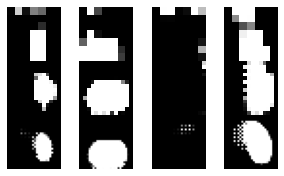

___________________________
tf.Tensor(5.057789, shape=(), dtype=float32) - tf.Tensor(0.2320247, shape=(), dtype=float32)


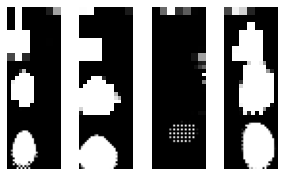

___________________________
tf.Tensor(6.061187, shape=(), dtype=float32) - tf.Tensor(0.14293523, shape=(), dtype=float32)


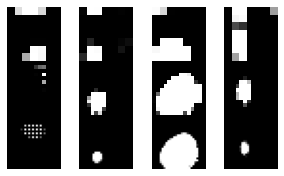

___________________________
tf.Tensor(6.914358, shape=(), dtype=float32) - tf.Tensor(0.17234221, shape=(), dtype=float32)


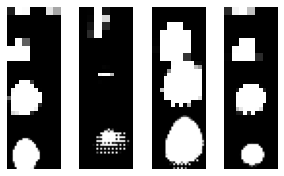

___________________________
tf.Tensor(7.4355783, shape=(), dtype=float32) - tf.Tensor(0.69928443, shape=(), dtype=float32)


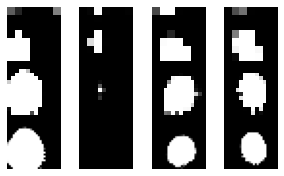

___________________________
tf.Tensor(5.527253, shape=(), dtype=float32) - tf.Tensor(0.35073662, shape=(), dtype=float32)


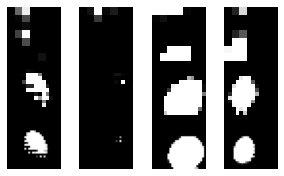

___________________________
tf.Tensor(4.976162, shape=(), dtype=float32) - tf.Tensor(0.3378219, shape=(), dtype=float32)


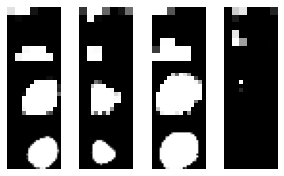

___________________________
tf.Tensor(3.6496747, shape=(), dtype=float32) - tf.Tensor(0.37804222, shape=(), dtype=float32)


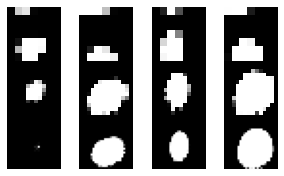

___________________________
tf.Tensor(3.25317, shape=(), dtype=float32) - tf.Tensor(0.36314833, shape=(), dtype=float32)


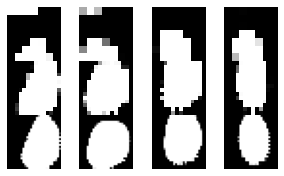

___________________________
tf.Tensor(4.7518854, shape=(), dtype=float32) - tf.Tensor(0.28323814, shape=(), dtype=float32)


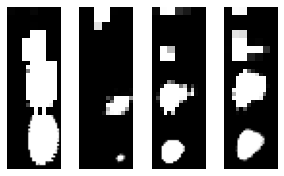

___________________________
tf.Tensor(4.876002, shape=(), dtype=float32) - tf.Tensor(0.24034268, shape=(), dtype=float32)


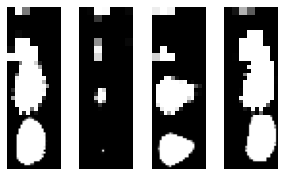

___________________________
tf.Tensor(6.162828, shape=(), dtype=float32) - tf.Tensor(0.32944942, shape=(), dtype=float32)


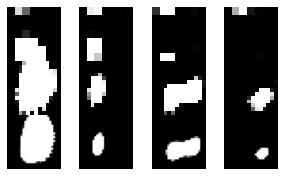

___________________________
tf.Tensor(5.3631287, shape=(), dtype=float32) - tf.Tensor(0.16811088, shape=(), dtype=float32)


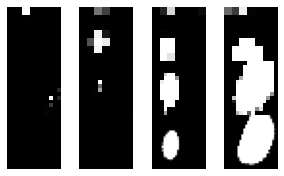

___________________________
tf.Tensor(5.324196, shape=(), dtype=float32) - tf.Tensor(0.21480729, shape=(), dtype=float32)


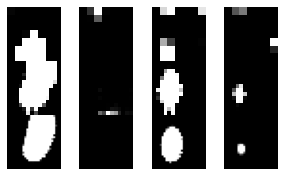

___________________________
tf.Tensor(5.507193, shape=(), dtype=float32) - tf.Tensor(0.12280324, shape=(), dtype=float32)


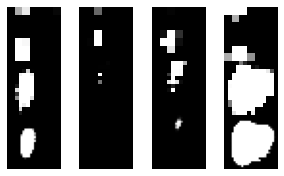

___________________________
tf.Tensor(4.7235537, shape=(), dtype=float32) - tf.Tensor(0.11270919, shape=(), dtype=float32)


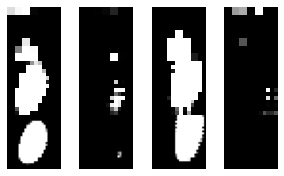

___________________________
tf.Tensor(5.752199, shape=(), dtype=float32) - tf.Tensor(0.102490455, shape=(), dtype=float32)


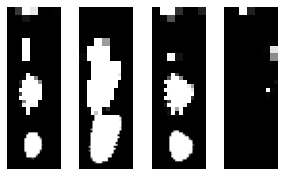

___________________________
tf.Tensor(6.1088886, shape=(), dtype=float32) - tf.Tensor(0.25101513, shape=(), dtype=float32)


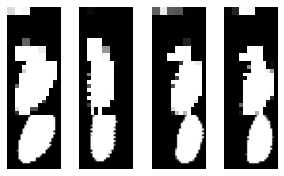

___________________________
tf.Tensor(7.229073, shape=(), dtype=float32) - tf.Tensor(0.039891526, shape=(), dtype=float32)


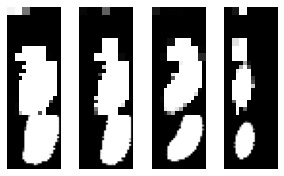

___________________________
tf.Tensor(6.9348187, shape=(), dtype=float32) - tf.Tensor(0.070043534, shape=(), dtype=float32)


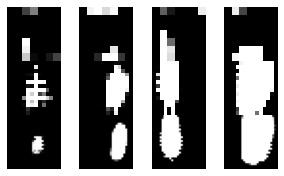

___________________________
tf.Tensor(7.3699427, shape=(), dtype=float32) - tf.Tensor(0.21020558, shape=(), dtype=float32)


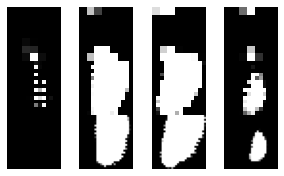

___________________________
tf.Tensor(5.255473, shape=(), dtype=float32) - tf.Tensor(0.15534362, shape=(), dtype=float32)


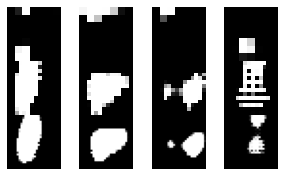

___________________________
tf.Tensor(5.1179323, shape=(), dtype=float32) - tf.Tensor(0.076251045, shape=(), dtype=float32)


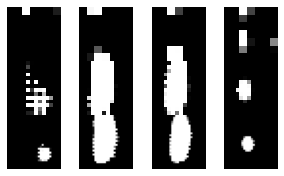

___________________________
tf.Tensor(6.8717475, shape=(), dtype=float32) - tf.Tensor(0.0331326, shape=(), dtype=float32)


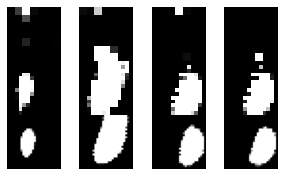

___________________________
tf.Tensor(7.733906, shape=(), dtype=float32) - tf.Tensor(0.08336239, shape=(), dtype=float32)


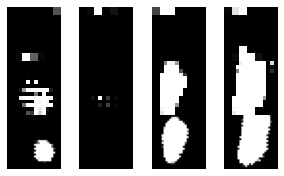

___________________________
tf.Tensor(7.496221, shape=(), dtype=float32) - tf.Tensor(0.24518001, shape=(), dtype=float32)


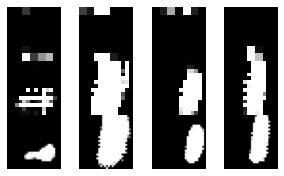

___________________________
tf.Tensor(9.072008, shape=(), dtype=float32) - tf.Tensor(0.08476514, shape=(), dtype=float32)


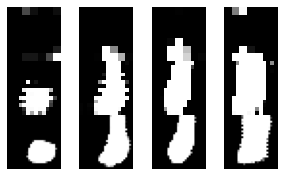

___________________________
tf.Tensor(8.836902, shape=(), dtype=float32) - tf.Tensor(0.09143396, shape=(), dtype=float32)


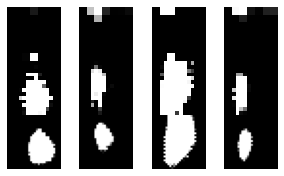

___________________________
tf.Tensor(7.2339535, shape=(), dtype=float32) - tf.Tensor(0.12704852, shape=(), dtype=float32)


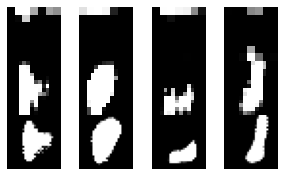

___________________________
tf.Tensor(5.6820774, shape=(), dtype=float32) - tf.Tensor(0.13597059, shape=(), dtype=float32)


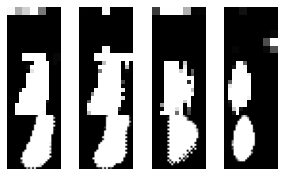

___________________________
tf.Tensor(7.0369, shape=(), dtype=float32) - tf.Tensor(0.114586845, shape=(), dtype=float32)


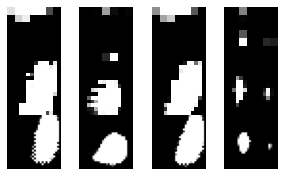

___________________________
tf.Tensor(9.343546, shape=(), dtype=float32) - tf.Tensor(0.11650482, shape=(), dtype=float32)


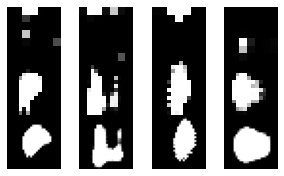

___________________________
tf.Tensor(11.338463, shape=(), dtype=float32) - tf.Tensor(0.18721661, shape=(), dtype=float32)


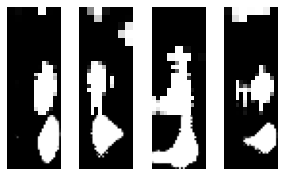

___________________________
tf.Tensor(8.012939, shape=(), dtype=float32) - tf.Tensor(0.04353036, shape=(), dtype=float32)


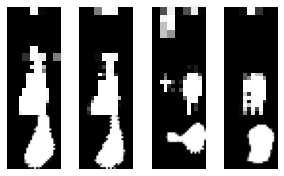

___________________________
tf.Tensor(5.7586956, shape=(), dtype=float32) - tf.Tensor(0.15373726, shape=(), dtype=float32)


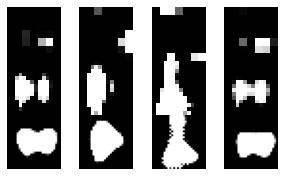

___________________________
tf.Tensor(6.9519963, shape=(), dtype=float32) - tf.Tensor(0.23118335, shape=(), dtype=float32)


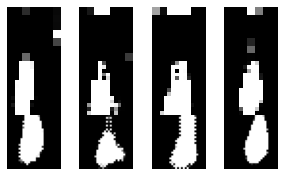

___________________________
tf.Tensor(10.792425, shape=(), dtype=float32) - tf.Tensor(0.122478634, shape=(), dtype=float32)


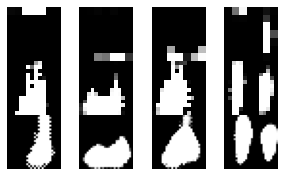

___________________________
tf.Tensor(13.289164, shape=(), dtype=float32) - tf.Tensor(0.39932328, shape=(), dtype=float32)


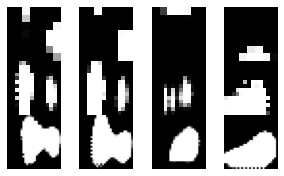

___________________________
tf.Tensor(11.893881, shape=(), dtype=float32) - tf.Tensor(0.14919212, shape=(), dtype=float32)


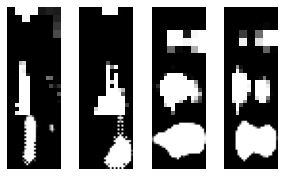

___________________________
tf.Tensor(8.146322, shape=(), dtype=float32) - tf.Tensor(0.035167336, shape=(), dtype=float32)


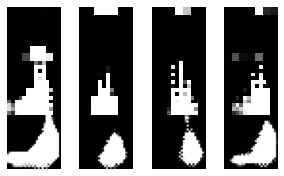

___________________________
tf.Tensor(5.897565, shape=(), dtype=float32) - tf.Tensor(0.13138159, shape=(), dtype=float32)


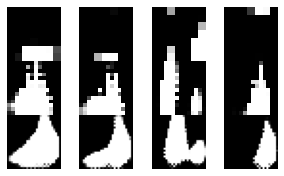

___________________________
tf.Tensor(5.837939, shape=(), dtype=float32) - tf.Tensor(0.15579142, shape=(), dtype=float32)


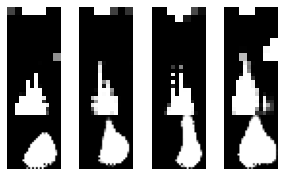

___________________________
tf.Tensor(6.896409, shape=(), dtype=float32) - tf.Tensor(0.1831683, shape=(), dtype=float32)


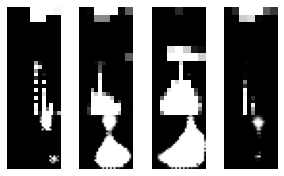

___________________________
tf.Tensor(8.338187, shape=(), dtype=float32) - tf.Tensor(0.14117128, shape=(), dtype=float32)


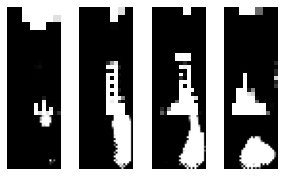

___________________________
tf.Tensor(9.412989, shape=(), dtype=float32) - tf.Tensor(0.13378307, shape=(), dtype=float32)


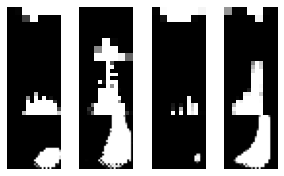

___________________________
tf.Tensor(9.312223, shape=(), dtype=float32) - tf.Tensor(0.28778252, shape=(), dtype=float32)


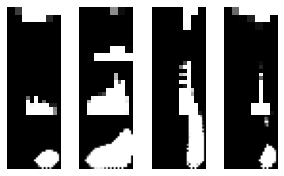

___________________________
tf.Tensor(7.944022, shape=(), dtype=float32) - tf.Tensor(0.1058357, shape=(), dtype=float32)


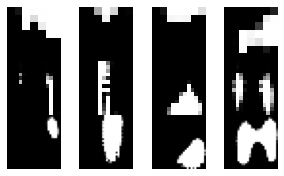

___________________________
tf.Tensor(6.979928, shape=(), dtype=float32) - tf.Tensor(0.064739175, shape=(), dtype=float32)


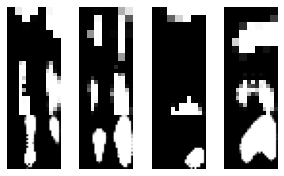

___________________________
tf.Tensor(6.483104, shape=(), dtype=float32) - tf.Tensor(0.06873915, shape=(), dtype=float32)


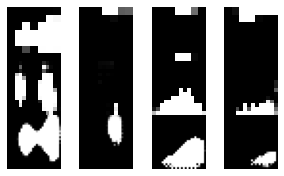

___________________________
tf.Tensor(6.8471603, shape=(), dtype=float32) - tf.Tensor(0.14831224, shape=(), dtype=float32)


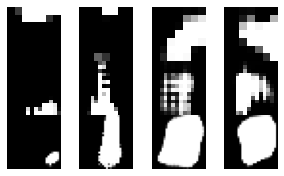

___________________________
tf.Tensor(7.790602, shape=(), dtype=float32) - tf.Tensor(0.15380158, shape=(), dtype=float32)


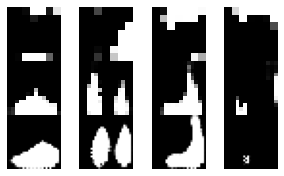

___________________________
tf.Tensor(7.742689, shape=(), dtype=float32) - tf.Tensor(0.08877425, shape=(), dtype=float32)


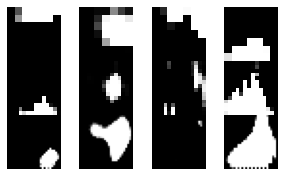

___________________________
tf.Tensor(6.750253, shape=(), dtype=float32) - tf.Tensor(0.05536823, shape=(), dtype=float32)


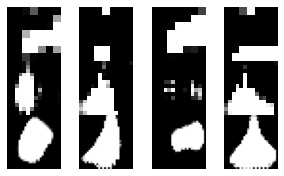

___________________________
tf.Tensor(7.197286, shape=(), dtype=float32) - tf.Tensor(0.11561305, shape=(), dtype=float32)


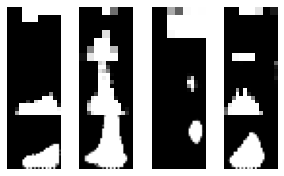

___________________________
tf.Tensor(5.8585124, shape=(), dtype=float32) - tf.Tensor(0.3043419, shape=(), dtype=float32)


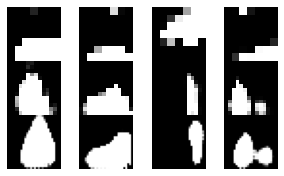

___________________________
tf.Tensor(6.993034, shape=(), dtype=float32) - tf.Tensor(0.19228725, shape=(), dtype=float32)


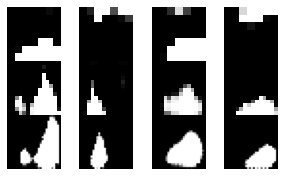

___________________________
tf.Tensor(7.939521, shape=(), dtype=float32) - tf.Tensor(0.43530527, shape=(), dtype=float32)


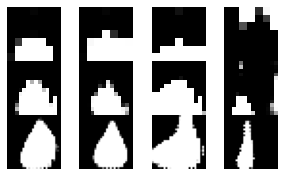

___________________________
tf.Tensor(8.22698, shape=(), dtype=float32) - tf.Tensor(0.32108194, shape=(), dtype=float32)


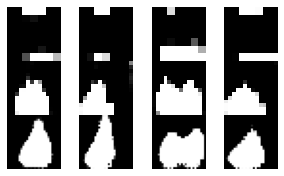

___________________________
tf.Tensor(8.336355, shape=(), dtype=float32) - tf.Tensor(0.059460513, shape=(), dtype=float32)


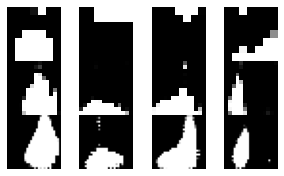

___________________________
tf.Tensor(8.014587, shape=(), dtype=float32) - tf.Tensor(0.2286995, shape=(), dtype=float32)


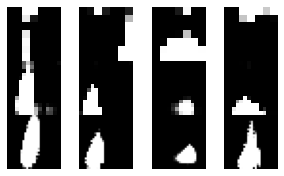

___________________________
tf.Tensor(7.582125, shape=(), dtype=float32) - tf.Tensor(0.2630808, shape=(), dtype=float32)


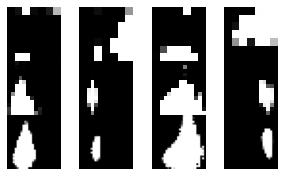

___________________________
tf.Tensor(7.3312917, shape=(), dtype=float32) - tf.Tensor(0.18040869, shape=(), dtype=float32)


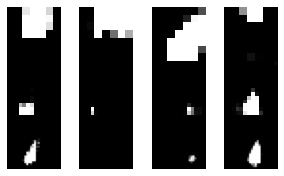

___________________________
tf.Tensor(6.8175898, shape=(), dtype=float32) - tf.Tensor(0.17037526, shape=(), dtype=float32)


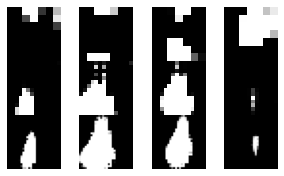

___________________________
tf.Tensor(7.311257, shape=(), dtype=float32) - tf.Tensor(0.10494176, shape=(), dtype=float32)


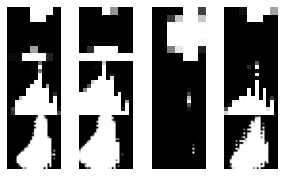

___________________________
tf.Tensor(7.941139, shape=(), dtype=float32) - tf.Tensor(0.16537128, shape=(), dtype=float32)


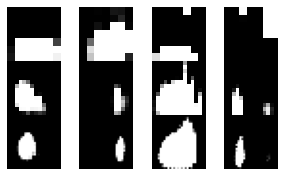

___________________________
tf.Tensor(7.542343, shape=(), dtype=float32) - tf.Tensor(0.06460887, shape=(), dtype=float32)


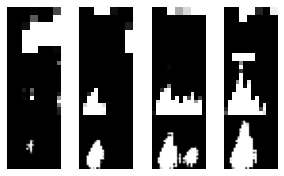

___________________________
tf.Tensor(7.6246147, shape=(), dtype=float32) - tf.Tensor(0.07087678, shape=(), dtype=float32)


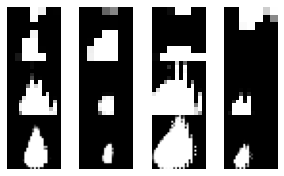

___________________________
tf.Tensor(6.965769, shape=(), dtype=float32) - tf.Tensor(0.0687914, shape=(), dtype=float32)


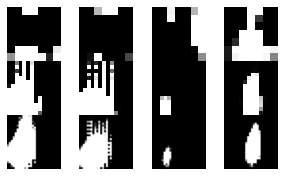

___________________________
tf.Tensor(6.9051194, shape=(), dtype=float32) - tf.Tensor(0.12926133, shape=(), dtype=float32)


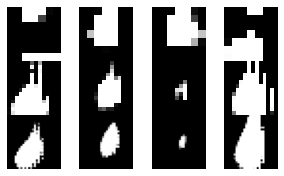

___________________________
tf.Tensor(8.142094, shape=(), dtype=float32) - tf.Tensor(0.086836636, shape=(), dtype=float32)


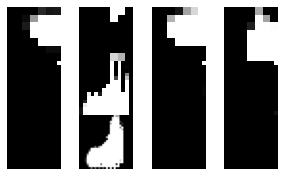

___________________________
tf.Tensor(9.01167, shape=(), dtype=float32) - tf.Tensor(0.16260341, shape=(), dtype=float32)


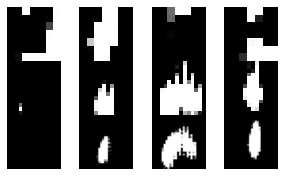

___________________________
tf.Tensor(6.920618, shape=(), dtype=float32) - tf.Tensor(0.13882706, shape=(), dtype=float32)


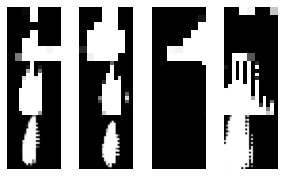

___________________________
tf.Tensor(9.254691, shape=(), dtype=float32) - tf.Tensor(0.026265245, shape=(), dtype=float32)


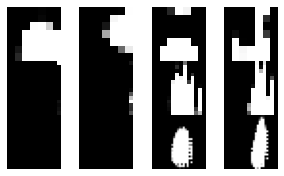

___________________________
tf.Tensor(9.082837, shape=(), dtype=float32) - tf.Tensor(0.19205204, shape=(), dtype=float32)


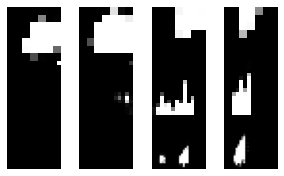

___________________________
tf.Tensor(7.7674193, shape=(), dtype=float32) - tf.Tensor(0.05851297, shape=(), dtype=float32)


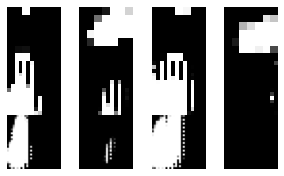

___________________________
tf.Tensor(8.267346, shape=(), dtype=float32) - tf.Tensor(0.18222335, shape=(), dtype=float32)


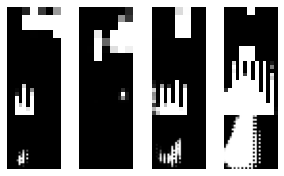

___________________________
tf.Tensor(8.25334, shape=(), dtype=float32) - tf.Tensor(0.18057878, shape=(), dtype=float32)


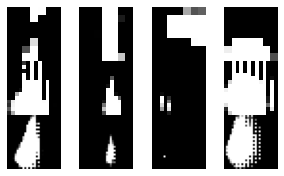

___________________________
tf.Tensor(9.011431, shape=(), dtype=float32) - tf.Tensor(0.07122804, shape=(), dtype=float32)


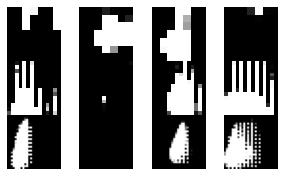

___________________________
tf.Tensor(8.376442, shape=(), dtype=float32) - tf.Tensor(0.016071498, shape=(), dtype=float32)


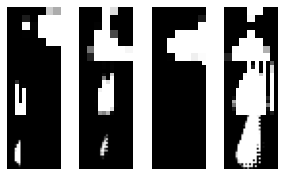

___________________________
tf.Tensor(9.854553, shape=(), dtype=float32) - tf.Tensor(0.07690771, shape=(), dtype=float32)


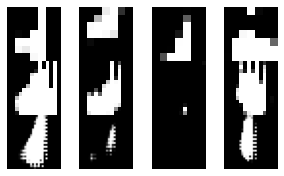

___________________________
tf.Tensor(10.997478, shape=(), dtype=float32) - tf.Tensor(0.020743279, shape=(), dtype=float32)


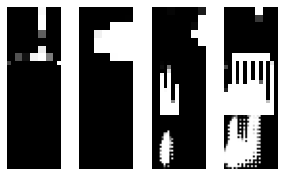

___________________________
tf.Tensor(10.425543, shape=(), dtype=float32) - tf.Tensor(0.025994208, shape=(), dtype=float32)


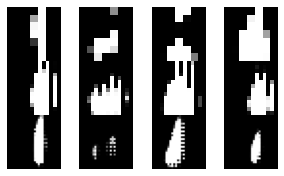

___________________________
tf.Tensor(11.168631, shape=(), dtype=float32) - tf.Tensor(0.041875463, shape=(), dtype=float32)


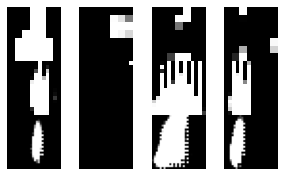

___________________________
tf.Tensor(10.700183, shape=(), dtype=float32) - tf.Tensor(0.04303549, shape=(), dtype=float32)


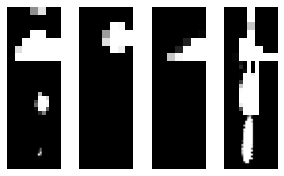

___________________________
tf.Tensor(8.20718, shape=(), dtype=float32) - tf.Tensor(0.02287198, shape=(), dtype=float32)


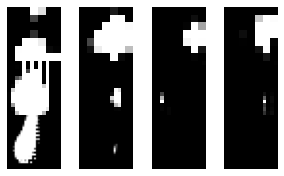

___________________________
tf.Tensor(7.8840766, shape=(), dtype=float32) - tf.Tensor(0.020533828, shape=(), dtype=float32)


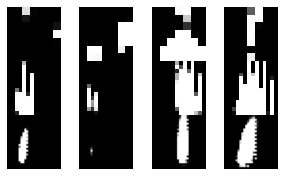

___________________________
tf.Tensor(8.564219, shape=(), dtype=float32) - tf.Tensor(0.06475866, shape=(), dtype=float32)


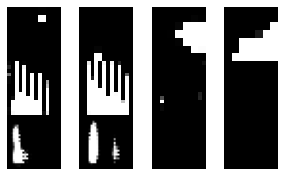

___________________________
tf.Tensor(10.969935, shape=(), dtype=float32) - tf.Tensor(0.05088244, shape=(), dtype=float32)


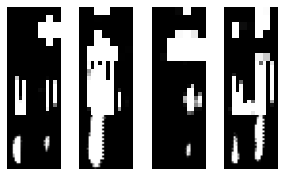

___________________________
tf.Tensor(10.73977, shape=(), dtype=float32) - tf.Tensor(0.008147746, shape=(), dtype=float32)


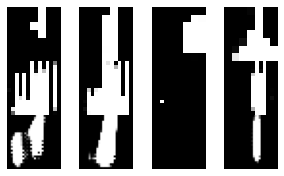

___________________________
tf.Tensor(11.311173, shape=(), dtype=float32) - tf.Tensor(0.008075815, shape=(), dtype=float32)


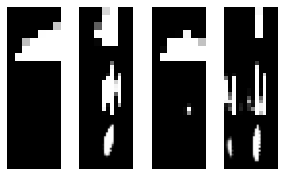

___________________________
tf.Tensor(11.160876, shape=(), dtype=float32) - tf.Tensor(0.008264927, shape=(), dtype=float32)


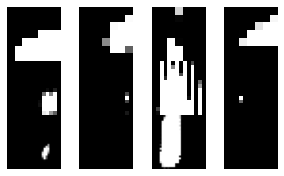

___________________________
tf.Tensor(10.631529, shape=(), dtype=float32) - tf.Tensor(0.043742552, shape=(), dtype=float32)


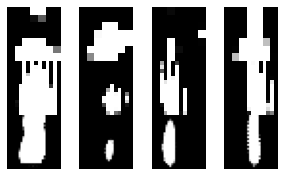

___________________________
tf.Tensor(9.183168, shape=(), dtype=float32) - tf.Tensor(0.014715759, shape=(), dtype=float32)


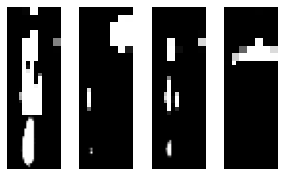

___________________________
tf.Tensor(8.426682, shape=(), dtype=float32) - tf.Tensor(0.21966189, shape=(), dtype=float32)


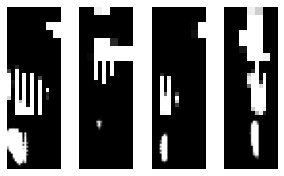

___________________________
tf.Tensor(13.251694, shape=(), dtype=float32) - tf.Tensor(0.107634366, shape=(), dtype=float32)


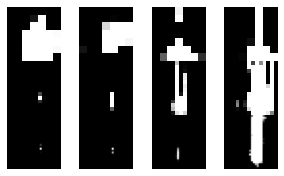

___________________________
tf.Tensor(15.163728, shape=(), dtype=float32) - tf.Tensor(0.13808994, shape=(), dtype=float32)


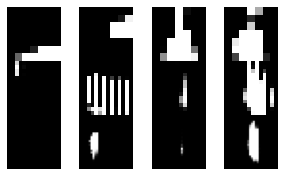

___________________________
tf.Tensor(9.1575985, shape=(), dtype=float32) - tf.Tensor(0.03696269, shape=(), dtype=float32)


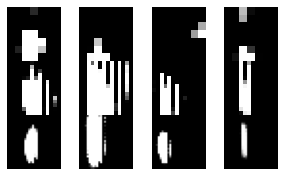

___________________________
tf.Tensor(4.069419, shape=(), dtype=float32) - tf.Tensor(0.19815102, shape=(), dtype=float32)


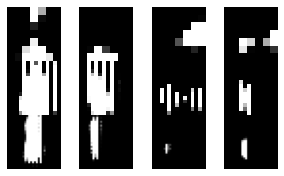

___________________________
tf.Tensor(9.245381, shape=(), dtype=float32) - tf.Tensor(0.080705255, shape=(), dtype=float32)


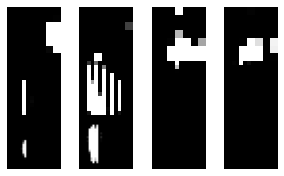

___________________________
tf.Tensor(13.493011, shape=(), dtype=float32) - tf.Tensor(0.06895177, shape=(), dtype=float32)


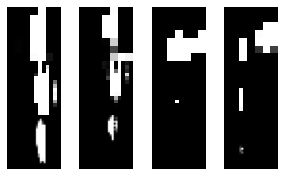

___________________________
tf.Tensor(15.3183, shape=(), dtype=float32) - tf.Tensor(0.090365104, shape=(), dtype=float32)


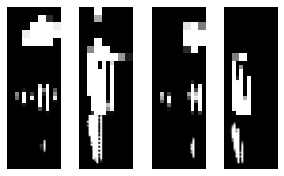

___________________________
tf.Tensor(13.539907, shape=(), dtype=float32) - tf.Tensor(0.044355225, shape=(), dtype=float32)


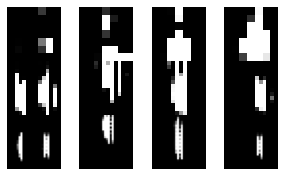

___________________________
tf.Tensor(10.073004, shape=(), dtype=float32) - tf.Tensor(0.0037387316, shape=(), dtype=float32)


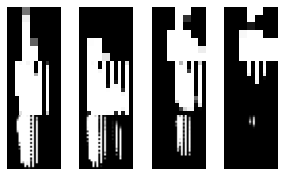

___________________________
tf.Tensor(7.162963, shape=(), dtype=float32) - tf.Tensor(0.0566385, shape=(), dtype=float32)


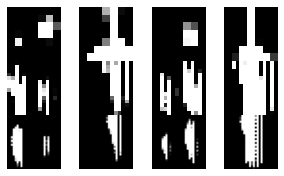

___________________________
tf.Tensor(9.282667, shape=(), dtype=float32) - tf.Tensor(0.01672292, shape=(), dtype=float32)


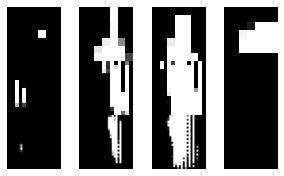

___________________________
tf.Tensor(12.711922, shape=(), dtype=float32) - tf.Tensor(0.0021701795, shape=(), dtype=float32)


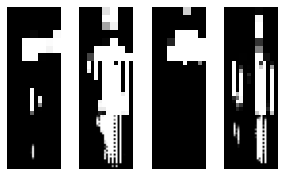

___________________________
tf.Tensor(15.971932, shape=(), dtype=float32) - tf.Tensor(0.049263615, shape=(), dtype=float32)


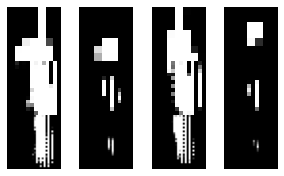

___________________________
tf.Tensor(17.264492, shape=(), dtype=float32) - tf.Tensor(0.042100813, shape=(), dtype=float32)


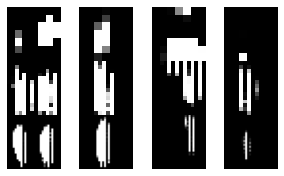

___________________________
tf.Tensor(12.774668, shape=(), dtype=float32) - tf.Tensor(0.00068919343, shape=(), dtype=float32)


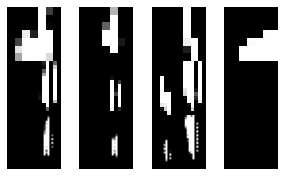

___________________________
tf.Tensor(10.305494, shape=(), dtype=float32) - tf.Tensor(0.044267446, shape=(), dtype=float32)


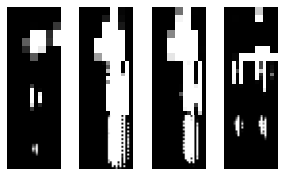

___________________________
tf.Tensor(8.232328, shape=(), dtype=float32) - tf.Tensor(0.01051457, shape=(), dtype=float32)


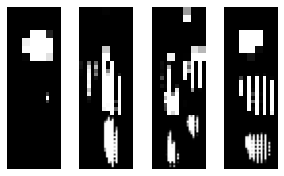

___________________________
tf.Tensor(7.5263433, shape=(), dtype=float32) - tf.Tensor(0.04568948, shape=(), dtype=float32)


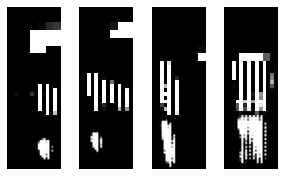

___________________________
tf.Tensor(6.3352, shape=(), dtype=float32) - tf.Tensor(0.034182303, shape=(), dtype=float32)


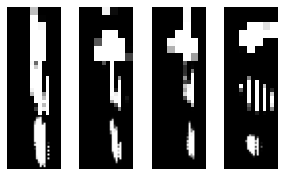

___________________________
tf.Tensor(7.7233324, shape=(), dtype=float32) - tf.Tensor(0.033591524, shape=(), dtype=float32)


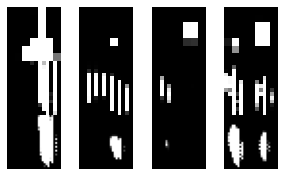

___________________________
tf.Tensor(10.535097, shape=(), dtype=float32) - tf.Tensor(0.01478116, shape=(), dtype=float32)


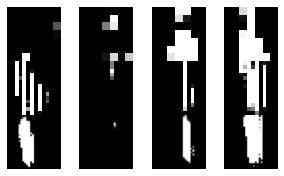

___________________________
tf.Tensor(12.141587, shape=(), dtype=float32) - tf.Tensor(0.025858253, shape=(), dtype=float32)


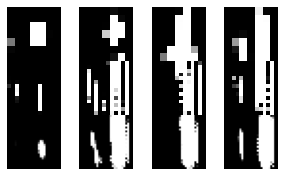

___________________________
tf.Tensor(15.119485, shape=(), dtype=float32) - tf.Tensor(0.1390535, shape=(), dtype=float32)


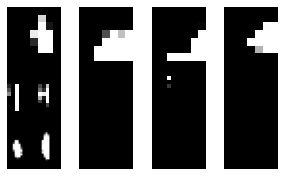

___________________________
tf.Tensor(12.597576, shape=(), dtype=float32) - tf.Tensor(0.29036877, shape=(), dtype=float32)


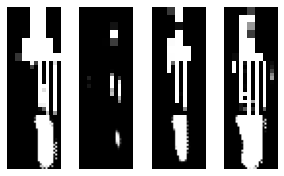

___________________________
tf.Tensor(7.102149, shape=(), dtype=float32) - tf.Tensor(0.09847443, shape=(), dtype=float32)


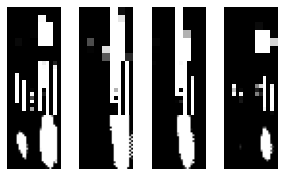

___________________________
tf.Tensor(6.7365093, shape=(), dtype=float32) - tf.Tensor(0.46502647, shape=(), dtype=float32)


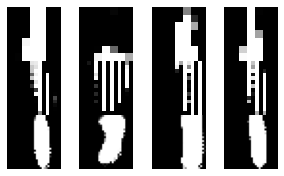

___________________________
tf.Tensor(10.972778, shape=(), dtype=float32) - tf.Tensor(0.071755275, shape=(), dtype=float32)


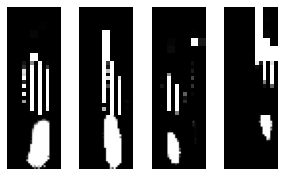

___________________________
tf.Tensor(15.679857, shape=(), dtype=float32) - tf.Tensor(0.6483057, shape=(), dtype=float32)


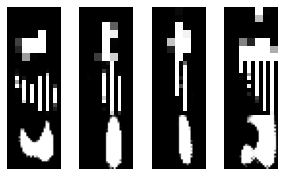

___________________________
tf.Tensor(14.784072, shape=(), dtype=float32) - tf.Tensor(0.7000524, shape=(), dtype=float32)


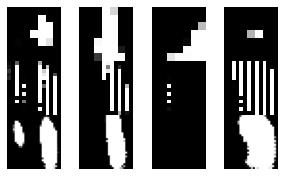

___________________________
tf.Tensor(7.681053, shape=(), dtype=float32) - tf.Tensor(0.03112378, shape=(), dtype=float32)


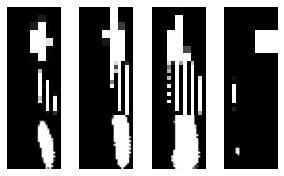

___________________________
tf.Tensor(4.56402, shape=(), dtype=float32) - tf.Tensor(0.29724473, shape=(), dtype=float32)


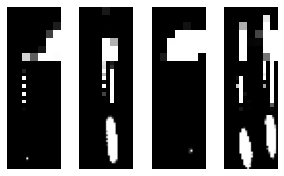

___________________________
tf.Tensor(5.395999, shape=(), dtype=float32) - tf.Tensor(0.44435668, shape=(), dtype=float32)


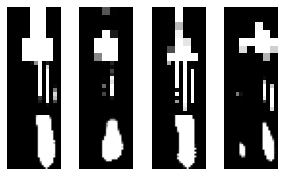

___________________________
tf.Tensor(7.249545, shape=(), dtype=float32) - tf.Tensor(0.10893005, shape=(), dtype=float32)


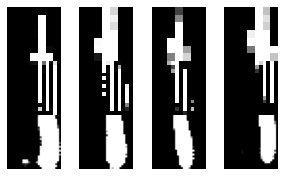

___________________________
tf.Tensor(10.163492, shape=(), dtype=float32) - tf.Tensor(0.1479721, shape=(), dtype=float32)


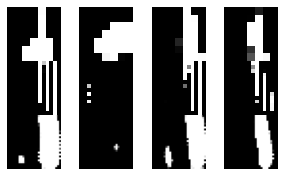

___________________________
tf.Tensor(12.298994, shape=(), dtype=float32) - tf.Tensor(0.04336295, shape=(), dtype=float32)


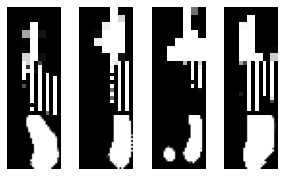

___________________________
tf.Tensor(12.756664, shape=(), dtype=float32) - tf.Tensor(0.2168541, shape=(), dtype=float32)


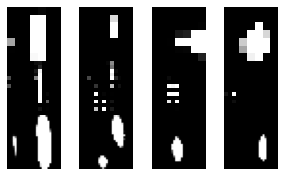

___________________________
tf.Tensor(11.407063, shape=(), dtype=float32) - tf.Tensor(0.18218668, shape=(), dtype=float32)


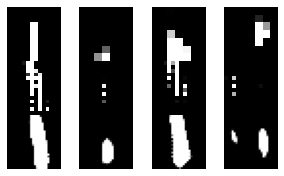

___________________________
tf.Tensor(10.671636, shape=(), dtype=float32) - tf.Tensor(0.16594315, shape=(), dtype=float32)


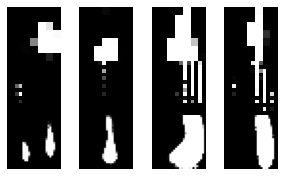

___________________________
tf.Tensor(9.203375, shape=(), dtype=float32) - tf.Tensor(0.06848491, shape=(), dtype=float32)


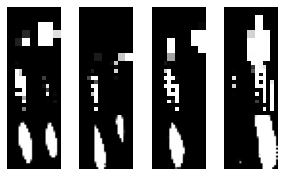

___________________________
tf.Tensor(7.14441, shape=(), dtype=float32) - tf.Tensor(0.13149735, shape=(), dtype=float32)


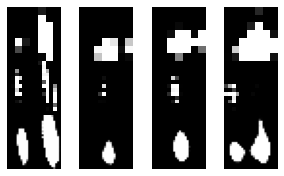

___________________________
tf.Tensor(6.6898146, shape=(), dtype=float32) - tf.Tensor(0.03325002, shape=(), dtype=float32)


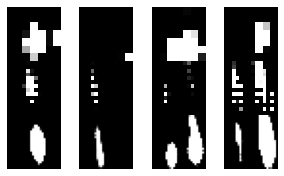

___________________________
tf.Tensor(5.63408, shape=(), dtype=float32) - tf.Tensor(0.06293609, shape=(), dtype=float32)


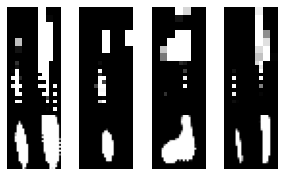

___________________________
tf.Tensor(4.8273497, shape=(), dtype=float32) - tf.Tensor(0.110123605, shape=(), dtype=float32)


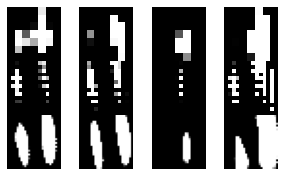

___________________________
tf.Tensor(4.9644794, shape=(), dtype=float32) - tf.Tensor(0.07856351, shape=(), dtype=float32)


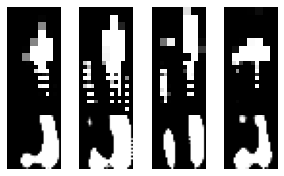

___________________________
tf.Tensor(5.717873, shape=(), dtype=float32) - tf.Tensor(0.102451906, shape=(), dtype=float32)


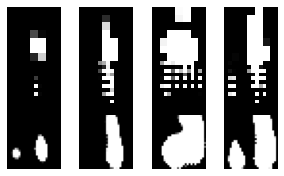

___________________________
tf.Tensor(6.617026, shape=(), dtype=float32) - tf.Tensor(0.035745397, shape=(), dtype=float32)


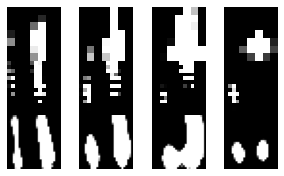

___________________________
tf.Tensor(7.1171217, shape=(), dtype=float32) - tf.Tensor(0.0353219, shape=(), dtype=float32)


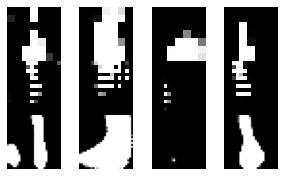

___________________________
tf.Tensor(7.91378, shape=(), dtype=float32) - tf.Tensor(0.26038513, shape=(), dtype=float32)


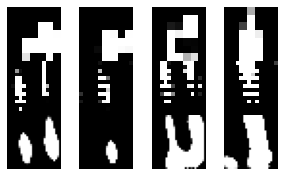

___________________________
tf.Tensor(7.4260254, shape=(), dtype=float32) - tf.Tensor(0.15297367, shape=(), dtype=float32)


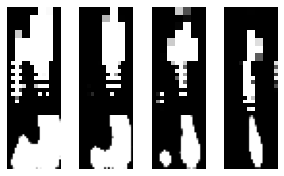

___________________________
tf.Tensor(6.9371223, shape=(), dtype=float32) - tf.Tensor(0.11121273, shape=(), dtype=float32)


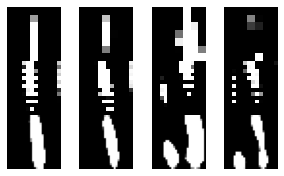

___________________________
tf.Tensor(5.971091, shape=(), dtype=float32) - tf.Tensor(0.1914823, shape=(), dtype=float32)


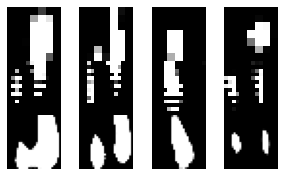

___________________________
tf.Tensor(5.8042006, shape=(), dtype=float32) - tf.Tensor(0.13988288, shape=(), dtype=float32)


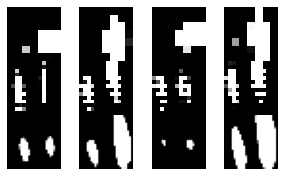

___________________________
tf.Tensor(5.8082495, shape=(), dtype=float32) - tf.Tensor(0.0667639, shape=(), dtype=float32)


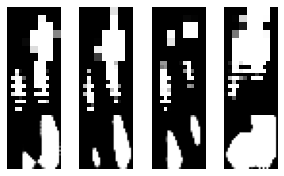

___________________________
tf.Tensor(5.792177, shape=(), dtype=float32) - tf.Tensor(0.095742956, shape=(), dtype=float32)


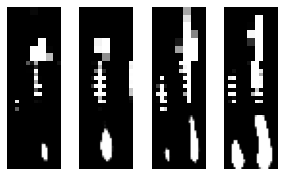

___________________________
tf.Tensor(6.8955917, shape=(), dtype=float32) - tf.Tensor(0.06500311, shape=(), dtype=float32)


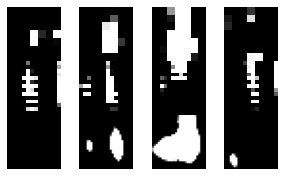

___________________________
tf.Tensor(6.8236113, shape=(), dtype=float32) - tf.Tensor(0.04340312, shape=(), dtype=float32)


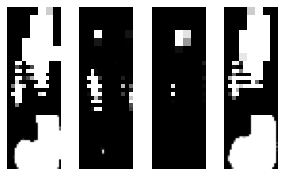

___________________________
tf.Tensor(8.260593, shape=(), dtype=float32) - tf.Tensor(0.07203562, shape=(), dtype=float32)


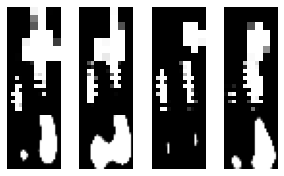

___________________________
tf.Tensor(9.201263, shape=(), dtype=float32) - tf.Tensor(0.1980513, shape=(), dtype=float32)


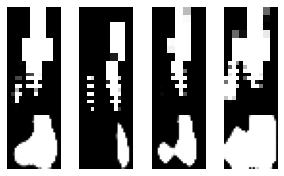

___________________________
tf.Tensor(9.094944, shape=(), dtype=float32) - tf.Tensor(0.08259239, shape=(), dtype=float32)


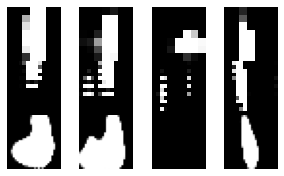

___________________________
tf.Tensor(8.136183, shape=(), dtype=float32) - tf.Tensor(0.06104627, shape=(), dtype=float32)


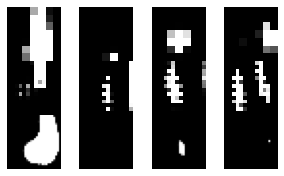

___________________________
tf.Tensor(9.697789, shape=(), dtype=float32) - tf.Tensor(0.06700812, shape=(), dtype=float32)


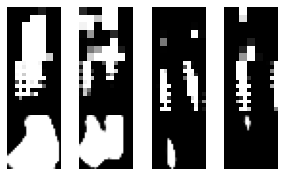

___________________________
tf.Tensor(9.065475, shape=(), dtype=float32) - tf.Tensor(0.16506393, shape=(), dtype=float32)


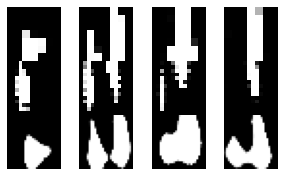

___________________________
tf.Tensor(9.336494, shape=(), dtype=float32) - tf.Tensor(0.088519536, shape=(), dtype=float32)


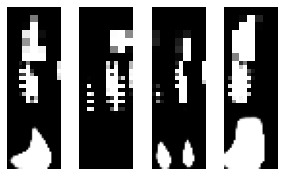

___________________________
tf.Tensor(9.083416, shape=(), dtype=float32) - tf.Tensor(0.12065485, shape=(), dtype=float32)


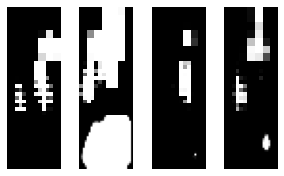

___________________________
tf.Tensor(9.249721, shape=(), dtype=float32) - tf.Tensor(0.12317884, shape=(), dtype=float32)


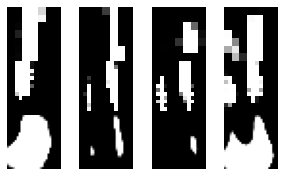

___________________________
tf.Tensor(8.750471, shape=(), dtype=float32) - tf.Tensor(0.25724822, shape=(), dtype=float32)


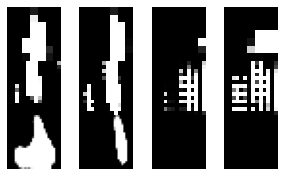

___________________________
tf.Tensor(8.971602, shape=(), dtype=float32) - tf.Tensor(0.1445656, shape=(), dtype=float32)


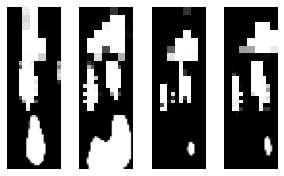

___________________________
tf.Tensor(9.589674, shape=(), dtype=float32) - tf.Tensor(0.04962159, shape=(), dtype=float32)


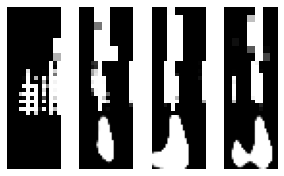

___________________________
tf.Tensor(8.789745, shape=(), dtype=float32) - tf.Tensor(0.014998082, shape=(), dtype=float32)


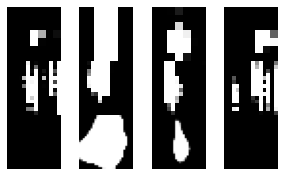

___________________________
tf.Tensor(9.577663, shape=(), dtype=float32) - tf.Tensor(0.19398892, shape=(), dtype=float32)


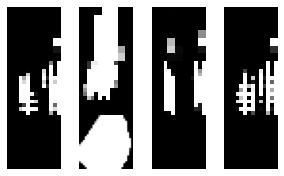

___________________________
tf.Tensor(10.639887, shape=(), dtype=float32) - tf.Tensor(0.1347096, shape=(), dtype=float32)


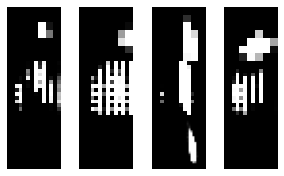

___________________________
tf.Tensor(13.245846, shape=(), dtype=float32) - tf.Tensor(0.18524213, shape=(), dtype=float32)


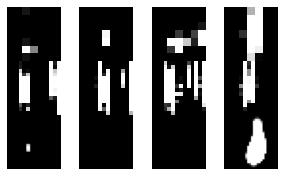

___________________________
tf.Tensor(11.266183, shape=(), dtype=float32) - tf.Tensor(0.1325128, shape=(), dtype=float32)


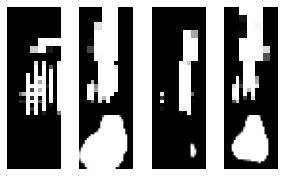

___________________________
tf.Tensor(12.804761, shape=(), dtype=float32) - tf.Tensor(0.17706853, shape=(), dtype=float32)


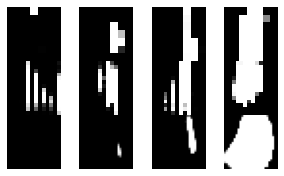

___________________________
tf.Tensor(9.533276, shape=(), dtype=float32) - tf.Tensor(0.06496607, shape=(), dtype=float32)


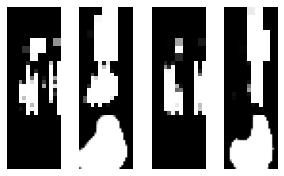

___________________________
tf.Tensor(5.8291416, shape=(), dtype=float32) - tf.Tensor(0.081816524, shape=(), dtype=float32)


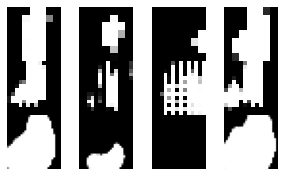

___________________________
tf.Tensor(3.503836, shape=(), dtype=float32) - tf.Tensor(0.79298985, shape=(), dtype=float32)


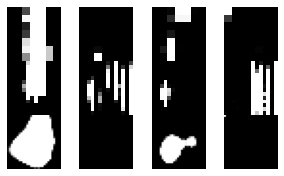

___________________________
tf.Tensor(9.824732, shape=(), dtype=float32) - tf.Tensor(0.37905043, shape=(), dtype=float32)


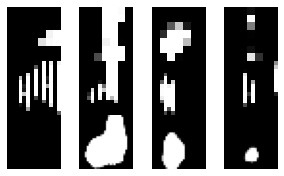

___________________________
tf.Tensor(12.958017, shape=(), dtype=float32) - tf.Tensor(0.48196462, shape=(), dtype=float32)


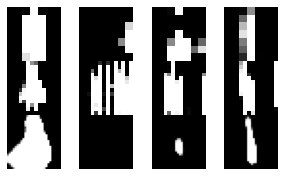

___________________________
tf.Tensor(9.912874, shape=(), dtype=float32) - tf.Tensor(0.039081316, shape=(), dtype=float32)


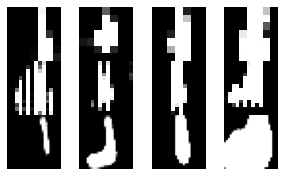

___________________________
tf.Tensor(7.633917, shape=(), dtype=float32) - tf.Tensor(0.048504256, shape=(), dtype=float32)


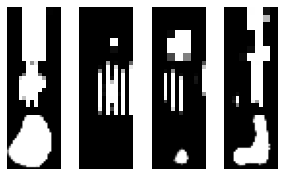

___________________________
tf.Tensor(6.485235, shape=(), dtype=float32) - tf.Tensor(0.54441845, shape=(), dtype=float32)


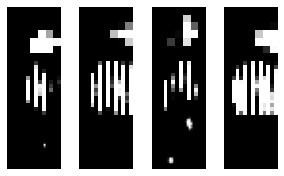

___________________________
tf.Tensor(8.237949, shape=(), dtype=float32) - tf.Tensor(0.037291612, shape=(), dtype=float32)


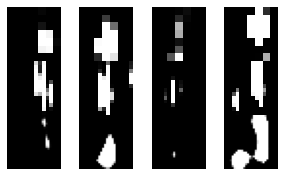

___________________________
tf.Tensor(10.897856, shape=(), dtype=float32) - tf.Tensor(0.23771606, shape=(), dtype=float32)


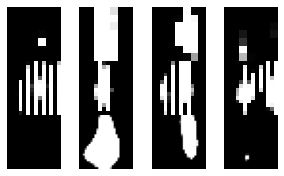

___________________________
tf.Tensor(10.389993, shape=(), dtype=float32) - tf.Tensor(0.30363774, shape=(), dtype=float32)


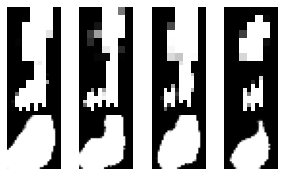

___________________________
tf.Tensor(9.088345, shape=(), dtype=float32) - tf.Tensor(0.16916747, shape=(), dtype=float32)


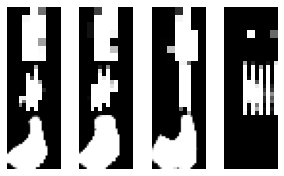

___________________________
tf.Tensor(6.074342, shape=(), dtype=float32) - tf.Tensor(0.10583769, shape=(), dtype=float32)


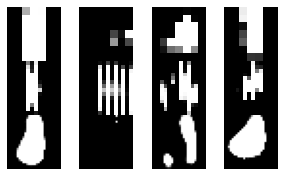

___________________________
tf.Tensor(3.986472, shape=(), dtype=float32) - tf.Tensor(0.08423636, shape=(), dtype=float32)


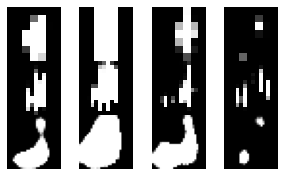

___________________________
tf.Tensor(2.865478, shape=(), dtype=float32) - tf.Tensor(0.27586755, shape=(), dtype=float32)


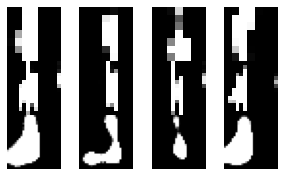

___________________________
tf.Tensor(2.7309222, shape=(), dtype=float32) - tf.Tensor(0.2698083, shape=(), dtype=float32)


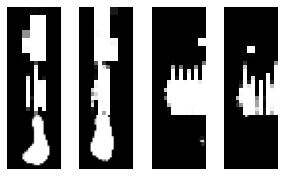

___________________________
tf.Tensor(3.6839767, shape=(), dtype=float32) - tf.Tensor(0.13562931, shape=(), dtype=float32)


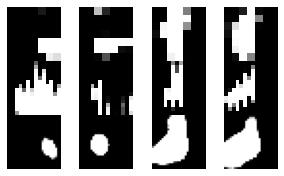

___________________________
tf.Tensor(4.6355643, shape=(), dtype=float32) - tf.Tensor(0.10826257, shape=(), dtype=float32)


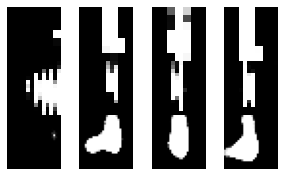

___________________________
tf.Tensor(6.1740417, shape=(), dtype=float32) - tf.Tensor(0.11523028, shape=(), dtype=float32)


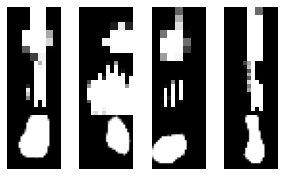

___________________________
tf.Tensor(7.944219, shape=(), dtype=float32) - tf.Tensor(0.20559415, shape=(), dtype=float32)


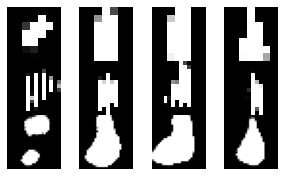

___________________________
tf.Tensor(8.689543, shape=(), dtype=float32) - tf.Tensor(0.27974337, shape=(), dtype=float32)


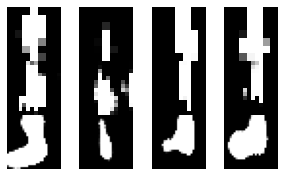

___________________________
tf.Tensor(7.8258686, shape=(), dtype=float32) - tf.Tensor(0.38033763, shape=(), dtype=float32)


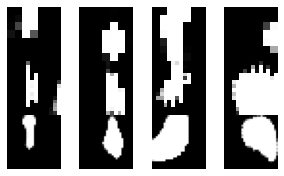

___________________________
tf.Tensor(5.737173, shape=(), dtype=float32) - tf.Tensor(0.10483731, shape=(), dtype=float32)


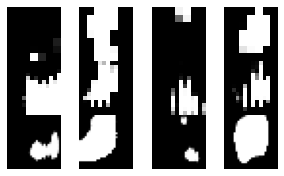

___________________________
tf.Tensor(4.0787134, shape=(), dtype=float32) - tf.Tensor(0.13135765, shape=(), dtype=float32)


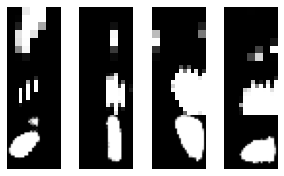

___________________________
tf.Tensor(3.6095338, shape=(), dtype=float32) - tf.Tensor(0.21718694, shape=(), dtype=float32)


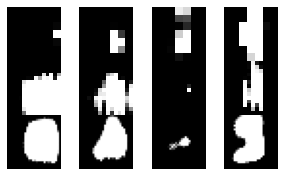

___________________________
tf.Tensor(4.1279936, shape=(), dtype=float32) - tf.Tensor(0.11758904, shape=(), dtype=float32)


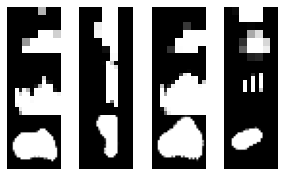

___________________________
tf.Tensor(5.419112, shape=(), dtype=float32) - tf.Tensor(0.032803915, shape=(), dtype=float32)


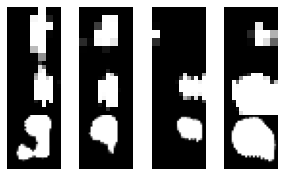

___________________________
tf.Tensor(6.51848, shape=(), dtype=float32) - tf.Tensor(0.09511013, shape=(), dtype=float32)


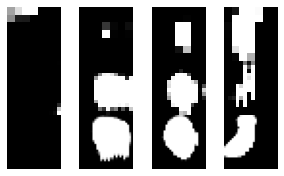

___________________________
tf.Tensor(7.4036355, shape=(), dtype=float32) - tf.Tensor(0.20628256, shape=(), dtype=float32)


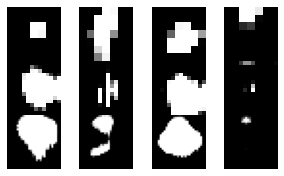

___________________________
tf.Tensor(7.6937885, shape=(), dtype=float32) - tf.Tensor(0.14928699, shape=(), dtype=float32)


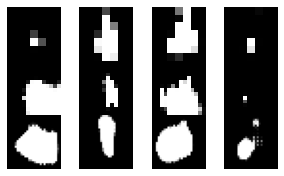

___________________________
tf.Tensor(6.718366, shape=(), dtype=float32) - tf.Tensor(0.14897722, shape=(), dtype=float32)


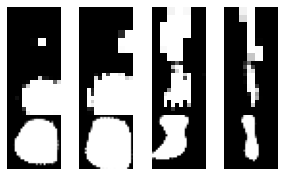

___________________________
tf.Tensor(5.6596785, shape=(), dtype=float32) - tf.Tensor(0.045146145, shape=(), dtype=float32)


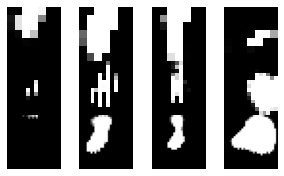

___________________________
tf.Tensor(4.052517, shape=(), dtype=float32) - tf.Tensor(0.07554586, shape=(), dtype=float32)


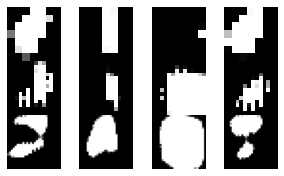

___________________________
tf.Tensor(4.018816, shape=(), dtype=float32) - tf.Tensor(0.16318297, shape=(), dtype=float32)


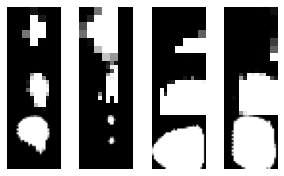

___________________________
tf.Tensor(4.6338096, shape=(), dtype=float32) - tf.Tensor(0.10110344, shape=(), dtype=float32)


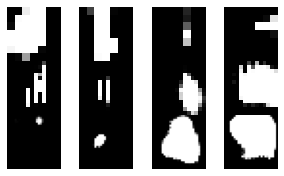

___________________________
tf.Tensor(5.6566057, shape=(), dtype=float32) - tf.Tensor(0.04071735, shape=(), dtype=float32)


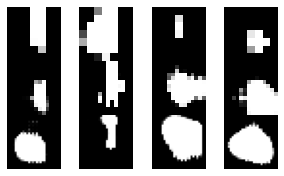

___________________________
tf.Tensor(6.4470997, shape=(), dtype=float32) - tf.Tensor(0.06919441, shape=(), dtype=float32)


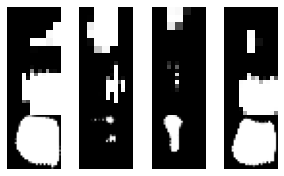

___________________________
tf.Tensor(7.8756075, shape=(), dtype=float32) - tf.Tensor(0.02931884, shape=(), dtype=float32)


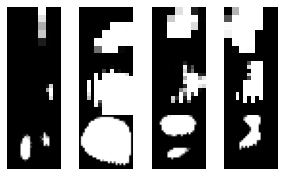

___________________________
tf.Tensor(8.4243, shape=(), dtype=float32) - tf.Tensor(0.02756621, shape=(), dtype=float32)


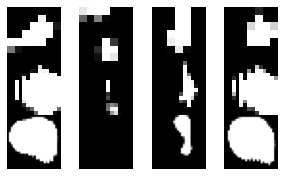

___________________________
tf.Tensor(8.607873, shape=(), dtype=float32) - tf.Tensor(0.035210676, shape=(), dtype=float32)


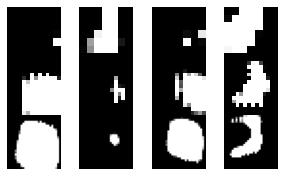

___________________________
tf.Tensor(9.127455, shape=(), dtype=float32) - tf.Tensor(0.06078786, shape=(), dtype=float32)


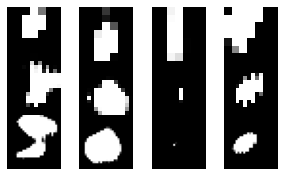

___________________________
tf.Tensor(9.030569, shape=(), dtype=float32) - tf.Tensor(0.0517386, shape=(), dtype=float32)


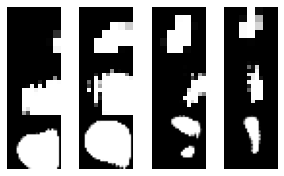

___________________________
tf.Tensor(7.7719994, shape=(), dtype=float32) - tf.Tensor(0.032615196, shape=(), dtype=float32)


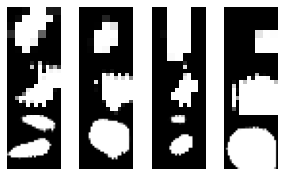

___________________________
tf.Tensor(7.9562955, shape=(), dtype=float32) - tf.Tensor(0.034594305, shape=(), dtype=float32)


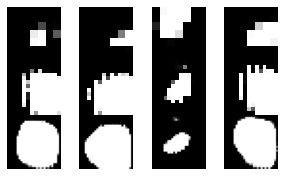

___________________________
tf.Tensor(6.591284, shape=(), dtype=float32) - tf.Tensor(0.11575176, shape=(), dtype=float32)


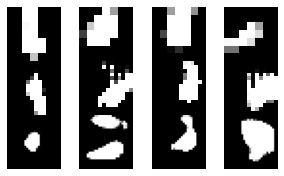

___________________________
tf.Tensor(6.0558314, shape=(), dtype=float32) - tf.Tensor(0.055241406, shape=(), dtype=float32)


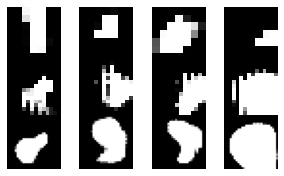

___________________________
tf.Tensor(5.40441, shape=(), dtype=float32) - tf.Tensor(0.098268084, shape=(), dtype=float32)


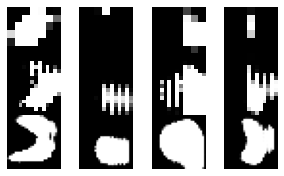

___________________________
tf.Tensor(6.225423, shape=(), dtype=float32) - tf.Tensor(0.051344723, shape=(), dtype=float32)


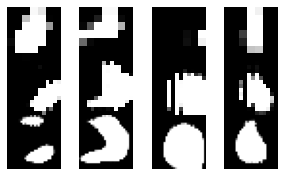

___________________________
tf.Tensor(8.291538, shape=(), dtype=float32) - tf.Tensor(0.01569694, shape=(), dtype=float32)


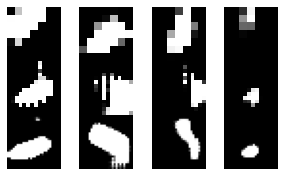

___________________________
tf.Tensor(9.260382, shape=(), dtype=float32) - tf.Tensor(0.058972348, shape=(), dtype=float32)


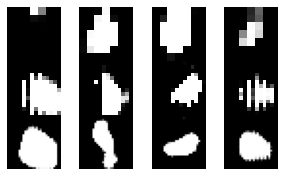

___________________________
tf.Tensor(9.655977, shape=(), dtype=float32) - tf.Tensor(0.09989117, shape=(), dtype=float32)


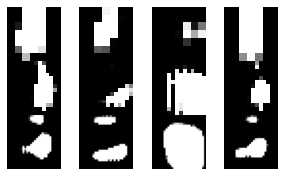

___________________________
tf.Tensor(8.84045, shape=(), dtype=float32) - tf.Tensor(0.09091948, shape=(), dtype=float32)


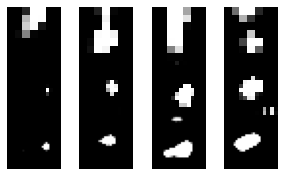

___________________________
tf.Tensor(7.29412, shape=(), dtype=float32) - tf.Tensor(0.04962124, shape=(), dtype=float32)


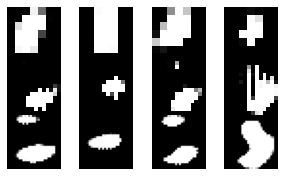

___________________________
tf.Tensor(6.2670135, shape=(), dtype=float32) - tf.Tensor(0.08435262, shape=(), dtype=float32)


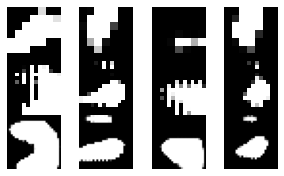

___________________________
tf.Tensor(5.46941, shape=(), dtype=float32) - tf.Tensor(0.16679257, shape=(), dtype=float32)


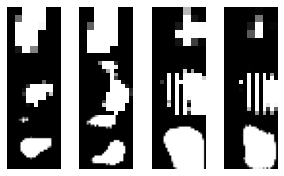

___________________________
tf.Tensor(7.4558096, shape=(), dtype=float32) - tf.Tensor(0.027494479, shape=(), dtype=float32)


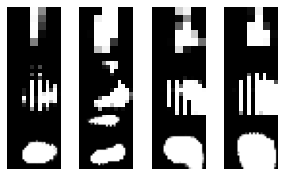

___________________________
tf.Tensor(8.793676, shape=(), dtype=float32) - tf.Tensor(0.13449483, shape=(), dtype=float32)


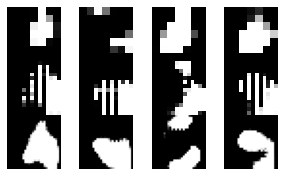

___________________________
tf.Tensor(9.851023, shape=(), dtype=float32) - tf.Tensor(0.049847536, shape=(), dtype=float32)


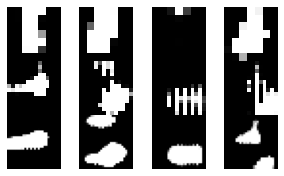

___________________________
tf.Tensor(10.902984, shape=(), dtype=float32) - tf.Tensor(0.009359676, shape=(), dtype=float32)


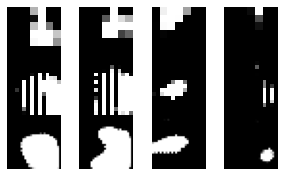

___________________________
tf.Tensor(11.07317, shape=(), dtype=float32) - tf.Tensor(0.0067199166, shape=(), dtype=float32)


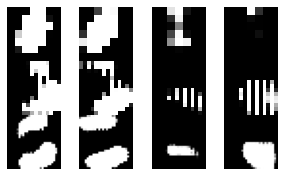

___________________________
tf.Tensor(11.982914, shape=(), dtype=float32) - tf.Tensor(0.068432435, shape=(), dtype=float32)


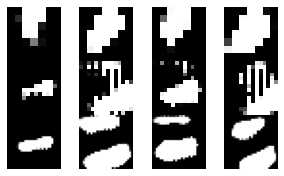

___________________________
tf.Tensor(9.680992, shape=(), dtype=float32) - tf.Tensor(0.07427373, shape=(), dtype=float32)


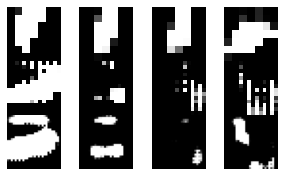

___________________________
tf.Tensor(10.475418, shape=(), dtype=float32) - tf.Tensor(0.012637665, shape=(), dtype=float32)


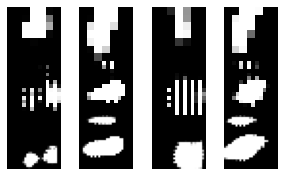

___________________________
tf.Tensor(10.088699, shape=(), dtype=float32) - tf.Tensor(0.1420457, shape=(), dtype=float32)


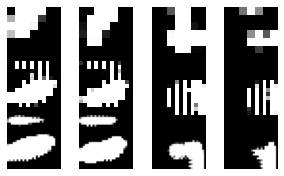

___________________________
tf.Tensor(9.1863165, shape=(), dtype=float32) - tf.Tensor(0.07893312, shape=(), dtype=float32)


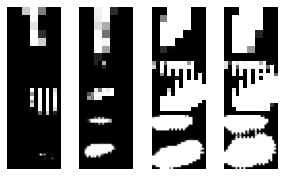

___________________________
tf.Tensor(8.631918, shape=(), dtype=float32) - tf.Tensor(0.13558425, shape=(), dtype=float32)


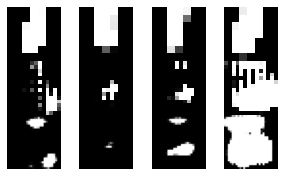

___________________________
tf.Tensor(8.958128, shape=(), dtype=float32) - tf.Tensor(0.06138735, shape=(), dtype=float32)


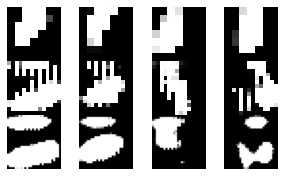

___________________________
tf.Tensor(8.557723, shape=(), dtype=float32) - tf.Tensor(0.03365794, shape=(), dtype=float32)


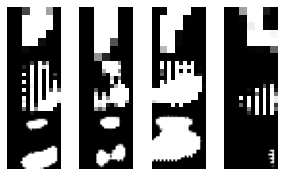

___________________________
tf.Tensor(8.368143, shape=(), dtype=float32) - tf.Tensor(0.01751846, shape=(), dtype=float32)


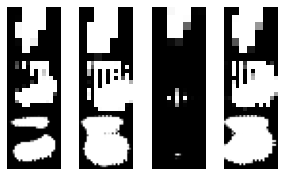

___________________________
tf.Tensor(7.914805, shape=(), dtype=float32) - tf.Tensor(0.08847683, shape=(), dtype=float32)


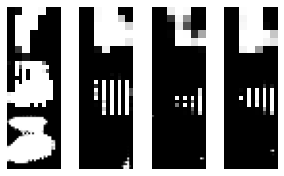

___________________________
tf.Tensor(10.64496, shape=(), dtype=float32) - tf.Tensor(0.26965147, shape=(), dtype=float32)


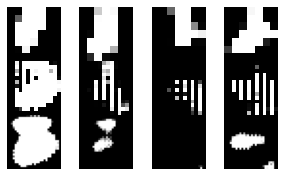

___________________________
tf.Tensor(11.021111, shape=(), dtype=float32) - tf.Tensor(0.03984566, shape=(), dtype=float32)


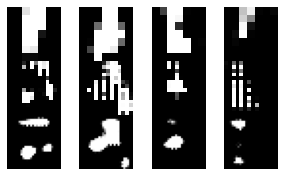

___________________________
tf.Tensor(10.224478, shape=(), dtype=float32) - tf.Tensor(0.013872955, shape=(), dtype=float32)


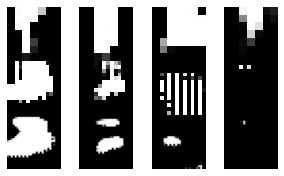

___________________________
tf.Tensor(10.463369, shape=(), dtype=float32) - tf.Tensor(0.021604022, shape=(), dtype=float32)


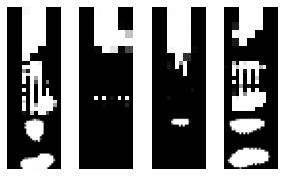

___________________________
tf.Tensor(9.435967, shape=(), dtype=float32) - tf.Tensor(0.024342755, shape=(), dtype=float32)


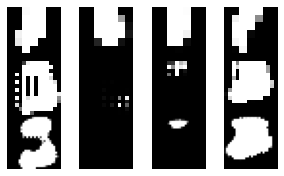

___________________________
tf.Tensor(9.403444, shape=(), dtype=float32) - tf.Tensor(0.061124936, shape=(), dtype=float32)


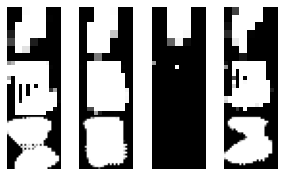

___________________________
tf.Tensor(9.054272, shape=(), dtype=float32) - tf.Tensor(0.0039387136, shape=(), dtype=float32)


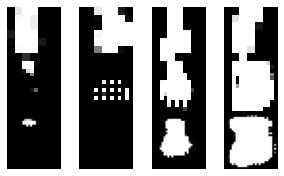

___________________________
tf.Tensor(7.565426, shape=(), dtype=float32) - tf.Tensor(0.009886368, shape=(), dtype=float32)


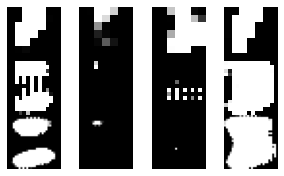

___________________________
tf.Tensor(7.284313, shape=(), dtype=float32) - tf.Tensor(0.027929408, shape=(), dtype=float32)


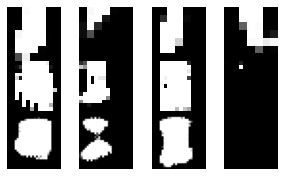

___________________________
tf.Tensor(7.713408, shape=(), dtype=float32) - tf.Tensor(0.02116978, shape=(), dtype=float32)


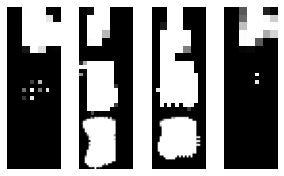

___________________________
tf.Tensor(8.190069, shape=(), dtype=float32) - tf.Tensor(0.037207317, shape=(), dtype=float32)


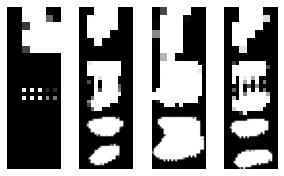

___________________________
tf.Tensor(9.383198, shape=(), dtype=float32) - tf.Tensor(0.092804104, shape=(), dtype=float32)


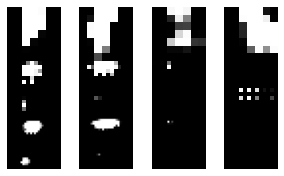

___________________________
tf.Tensor(8.477023, shape=(), dtype=float32) - tf.Tensor(0.004409467, shape=(), dtype=float32)


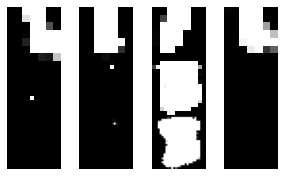

___________________________
tf.Tensor(7.743324, shape=(), dtype=float32) - tf.Tensor(0.07140726, shape=(), dtype=float32)


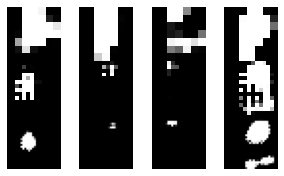

___________________________
tf.Tensor(7.375923, shape=(), dtype=float32) - tf.Tensor(0.037840597, shape=(), dtype=float32)


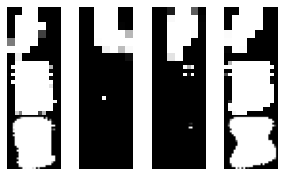

___________________________
tf.Tensor(7.4591227, shape=(), dtype=float32) - tf.Tensor(0.11651127, shape=(), dtype=float32)


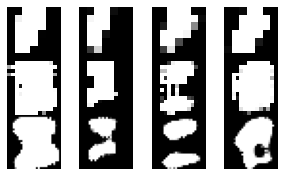

___________________________
tf.Tensor(9.112482, shape=(), dtype=float32) - tf.Tensor(0.15438315, shape=(), dtype=float32)


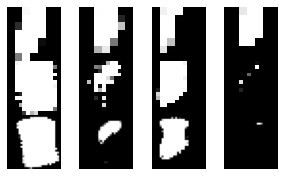

___________________________
tf.Tensor(9.581643, shape=(), dtype=float32) - tf.Tensor(0.03714353, shape=(), dtype=float32)


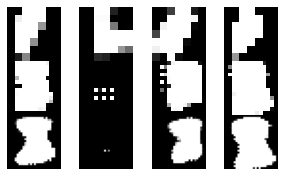

___________________________
tf.Tensor(9.812849, shape=(), dtype=float32) - tf.Tensor(0.010220632, shape=(), dtype=float32)


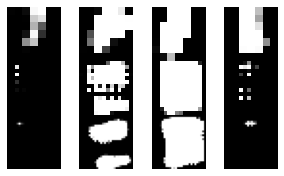

___________________________
tf.Tensor(9.69313, shape=(), dtype=float32) - tf.Tensor(0.12412524, shape=(), dtype=float32)


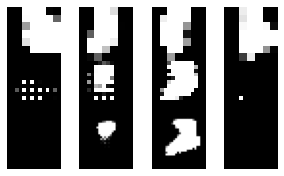

___________________________
tf.Tensor(8.504921, shape=(), dtype=float32) - tf.Tensor(0.23138544, shape=(), dtype=float32)


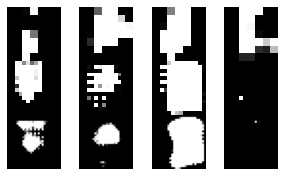

___________________________
tf.Tensor(10.506012, shape=(), dtype=float32) - tf.Tensor(0.0649275, shape=(), dtype=float32)


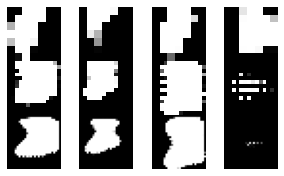

___________________________
tf.Tensor(9.665608, shape=(), dtype=float32) - tf.Tensor(0.16905671, shape=(), dtype=float32)


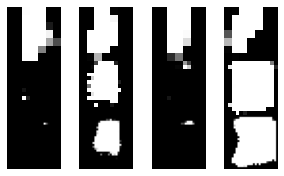

___________________________
tf.Tensor(10.632392, shape=(), dtype=float32) - tf.Tensor(0.008759384, shape=(), dtype=float32)


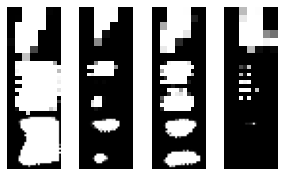

___________________________
tf.Tensor(10.6654215, shape=(), dtype=float32) - tf.Tensor(0.17070206, shape=(), dtype=float32)


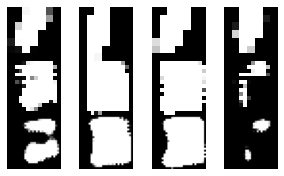

___________________________
tf.Tensor(11.043163, shape=(), dtype=float32) - tf.Tensor(0.11251486, shape=(), dtype=float32)


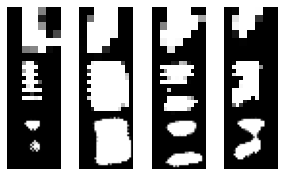

___________________________
tf.Tensor(10.774044, shape=(), dtype=float32) - tf.Tensor(0.06114063, shape=(), dtype=float32)


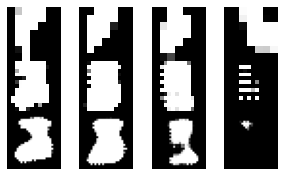

___________________________
tf.Tensor(9.233896, shape=(), dtype=float32) - tf.Tensor(0.105272785, shape=(), dtype=float32)


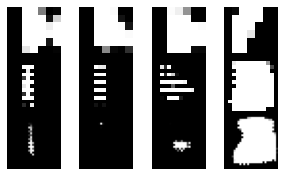

___________________________
tf.Tensor(8.295039, shape=(), dtype=float32) - tf.Tensor(0.26081666, shape=(), dtype=float32)


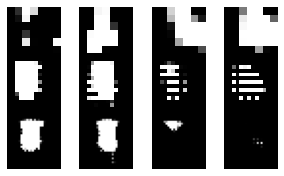

___________________________
tf.Tensor(8.0510235, shape=(), dtype=float32) - tf.Tensor(0.05729354, shape=(), dtype=float32)


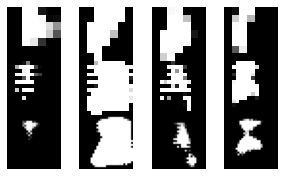

___________________________
tf.Tensor(7.6454673, shape=(), dtype=float32) - tf.Tensor(0.057941437, shape=(), dtype=float32)


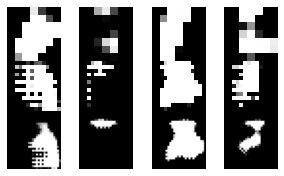

___________________________
tf.Tensor(7.043684, shape=(), dtype=float32) - tf.Tensor(0.43480468, shape=(), dtype=float32)


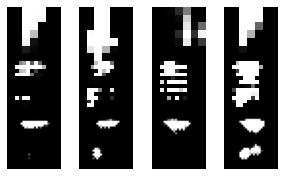

___________________________
tf.Tensor(8.280262, shape=(), dtype=float32) - tf.Tensor(0.19143206, shape=(), dtype=float32)


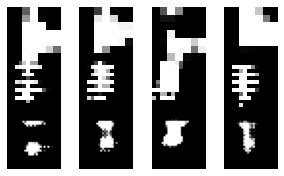

___________________________
tf.Tensor(9.522986, shape=(), dtype=float32) - tf.Tensor(0.20371208, shape=(), dtype=float32)


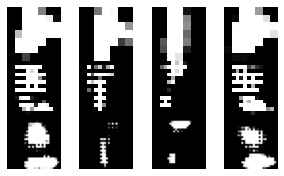

___________________________
tf.Tensor(9.015944, shape=(), dtype=float32) - tf.Tensor(0.006714562, shape=(), dtype=float32)


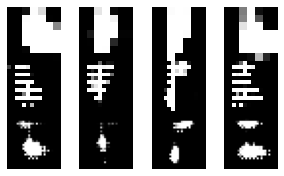

___________________________
tf.Tensor(8.504708, shape=(), dtype=float32) - tf.Tensor(0.12479844, shape=(), dtype=float32)


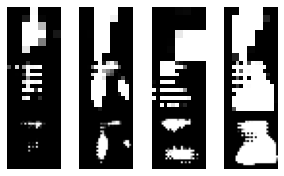

___________________________
tf.Tensor(6.18542, shape=(), dtype=float32) - tf.Tensor(0.15945, shape=(), dtype=float32)


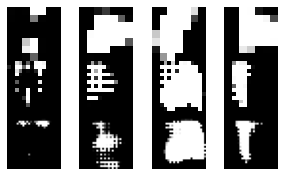

___________________________
tf.Tensor(5.370796, shape=(), dtype=float32) - tf.Tensor(0.04124592, shape=(), dtype=float32)


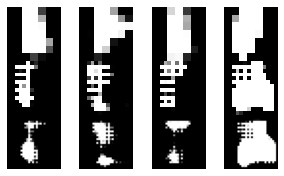

___________________________
tf.Tensor(4.0418406, shape=(), dtype=float32) - tf.Tensor(0.10398145, shape=(), dtype=float32)


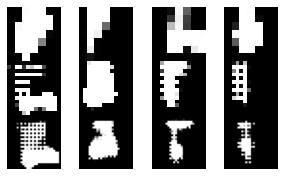

___________________________
tf.Tensor(4.606056, shape=(), dtype=float32) - tf.Tensor(0.062575944, shape=(), dtype=float32)


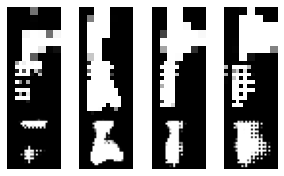

___________________________
tf.Tensor(4.861615, shape=(), dtype=float32) - tf.Tensor(0.07675899, shape=(), dtype=float32)


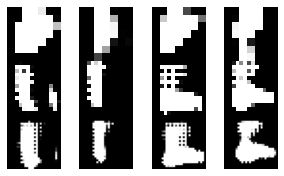

___________________________
tf.Tensor(5.35331, shape=(), dtype=float32) - tf.Tensor(0.025418293, shape=(), dtype=float32)


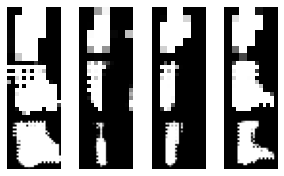

___________________________
tf.Tensor(6.263566, shape=(), dtype=float32) - tf.Tensor(0.043516066, shape=(), dtype=float32)


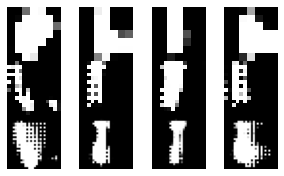

___________________________
tf.Tensor(6.6632833, shape=(), dtype=float32) - tf.Tensor(0.03097909, shape=(), dtype=float32)


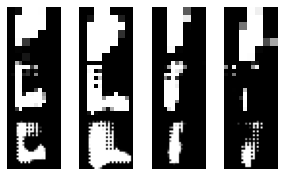

___________________________
tf.Tensor(6.811862, shape=(), dtype=float32) - tf.Tensor(0.06779124, shape=(), dtype=float32)


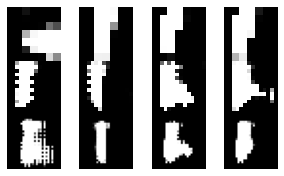

___________________________
tf.Tensor(7.4996033, shape=(), dtype=float32) - tf.Tensor(0.08972043, shape=(), dtype=float32)


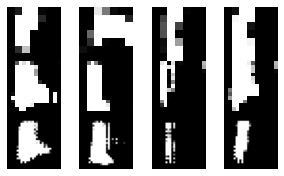

___________________________
tf.Tensor(6.9267397, shape=(), dtype=float32) - tf.Tensor(0.011888436, shape=(), dtype=float32)


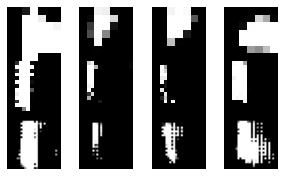

___________________________
tf.Tensor(7.0832605, shape=(), dtype=float32) - tf.Tensor(0.009042384, shape=(), dtype=float32)


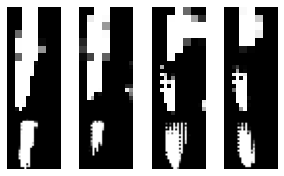

___________________________
tf.Tensor(6.789569, shape=(), dtype=float32) - tf.Tensor(0.030023169, shape=(), dtype=float32)


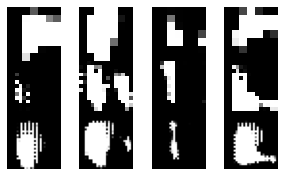

___________________________
tf.Tensor(6.5434217, shape=(), dtype=float32) - tf.Tensor(0.018679611, shape=(), dtype=float32)


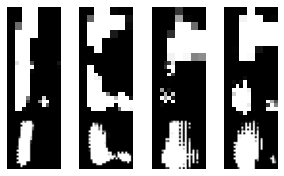

___________________________
tf.Tensor(6.9725666, shape=(), dtype=float32) - tf.Tensor(0.04557807, shape=(), dtype=float32)


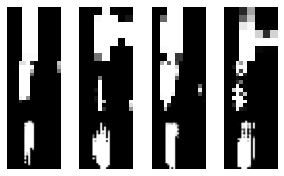

___________________________
tf.Tensor(7.1035585, shape=(), dtype=float32) - tf.Tensor(0.1072008, shape=(), dtype=float32)


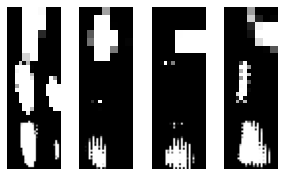

___________________________
tf.Tensor(8.254793, shape=(), dtype=float32) - tf.Tensor(0.12974879, shape=(), dtype=float32)


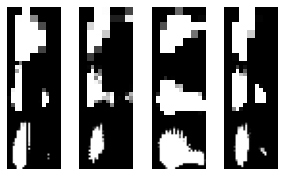

___________________________
tf.Tensor(8.465473, shape=(), dtype=float32) - tf.Tensor(0.023357715, shape=(), dtype=float32)


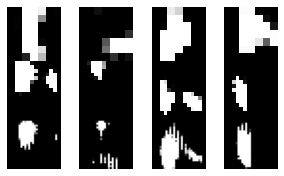

___________________________
tf.Tensor(7.160808, shape=(), dtype=float32) - tf.Tensor(0.24222176, shape=(), dtype=float32)


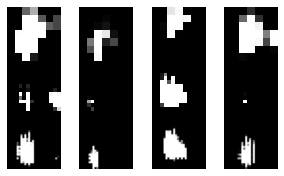

___________________________
tf.Tensor(10.404789, shape=(), dtype=float32) - tf.Tensor(0.29673785, shape=(), dtype=float32)


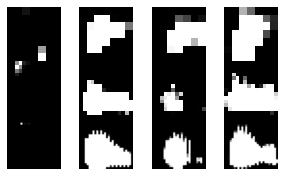

___________________________
tf.Tensor(10.061564, shape=(), dtype=float32) - tf.Tensor(0.060582653, shape=(), dtype=float32)


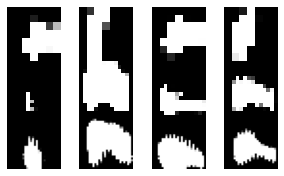

___________________________
tf.Tensor(8.916216, shape=(), dtype=float32) - tf.Tensor(0.1798239, shape=(), dtype=float32)


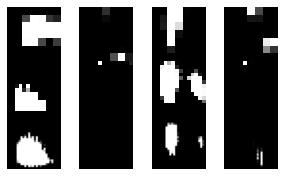

___________________________
tf.Tensor(5.1533933, shape=(), dtype=float32) - tf.Tensor(0.07529883, shape=(), dtype=float32)


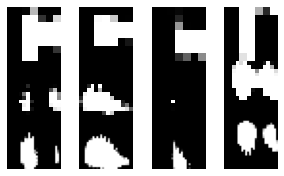

___________________________
tf.Tensor(3.4974465, shape=(), dtype=float32) - tf.Tensor(0.46634087, shape=(), dtype=float32)


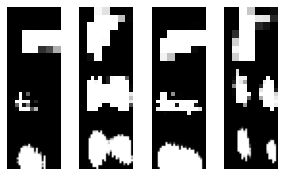

___________________________
tf.Tensor(7.747511, shape=(), dtype=float32) - tf.Tensor(0.27796227, shape=(), dtype=float32)


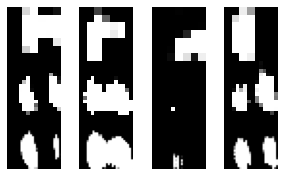

___________________________
tf.Tensor(10.340921, shape=(), dtype=float32) - tf.Tensor(0.56335056, shape=(), dtype=float32)


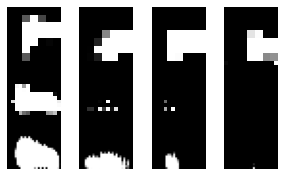

___________________________
tf.Tensor(8.876495, shape=(), dtype=float32) - tf.Tensor(0.45028055, shape=(), dtype=float32)


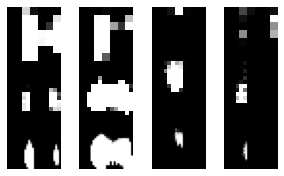

___________________________
tf.Tensor(5.6182346, shape=(), dtype=float32) - tf.Tensor(0.04560194, shape=(), dtype=float32)


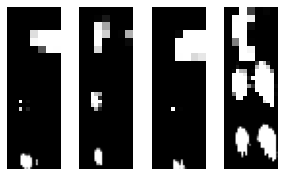

___________________________
tf.Tensor(4.120098, shape=(), dtype=float32) - tf.Tensor(0.09905682, shape=(), dtype=float32)


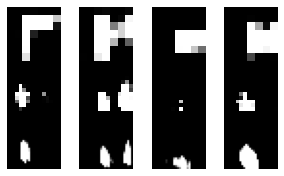

___________________________
tf.Tensor(4.101793, shape=(), dtype=float32) - tf.Tensor(0.4076102, shape=(), dtype=float32)


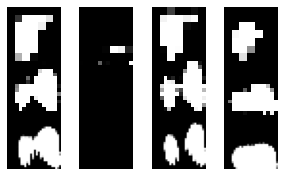

___________________________
tf.Tensor(5.243363, shape=(), dtype=float32) - tf.Tensor(0.06996913, shape=(), dtype=float32)


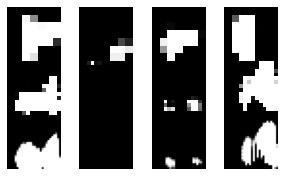

___________________________
tf.Tensor(6.514751, shape=(), dtype=float32) - tf.Tensor(0.057275042, shape=(), dtype=float32)


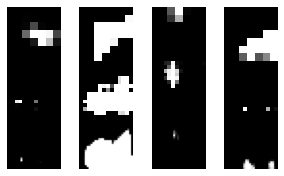

___________________________
tf.Tensor(8.369344, shape=(), dtype=float32) - tf.Tensor(0.082412384, shape=(), dtype=float32)


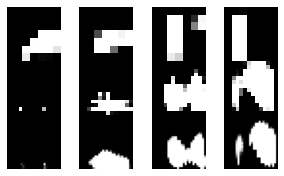

___________________________
tf.Tensor(10.022866, shape=(), dtype=float32) - tf.Tensor(0.17009827, shape=(), dtype=float32)


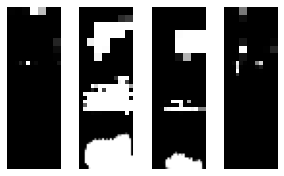

___________________________
tf.Tensor(9.087141, shape=(), dtype=float32) - tf.Tensor(0.10887416, shape=(), dtype=float32)


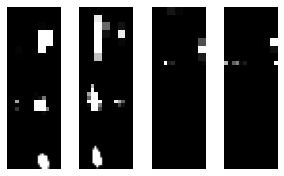

___________________________
tf.Tensor(8.454273, shape=(), dtype=float32) - tf.Tensor(0.1666232, shape=(), dtype=float32)


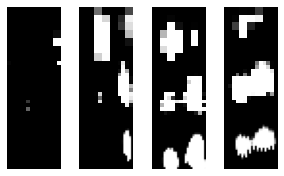

___________________________
tf.Tensor(7.3875484, shape=(), dtype=float32) - tf.Tensor(0.098441675, shape=(), dtype=float32)


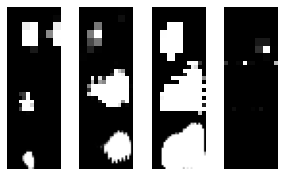

___________________________
tf.Tensor(5.775972, shape=(), dtype=float32) - tf.Tensor(0.05463923, shape=(), dtype=float32)


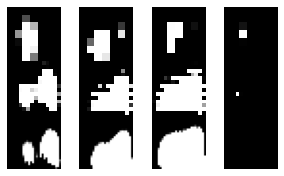

___________________________
tf.Tensor(4.78998, shape=(), dtype=float32) - tf.Tensor(0.021593187, shape=(), dtype=float32)


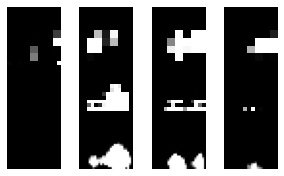

___________________________
tf.Tensor(4.1531954, shape=(), dtype=float32) - tf.Tensor(0.060295716, shape=(), dtype=float32)


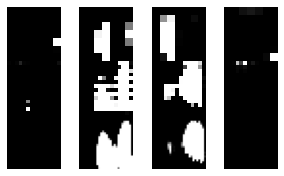

___________________________
tf.Tensor(3.4723406, shape=(), dtype=float32) - tf.Tensor(0.38227084, shape=(), dtype=float32)


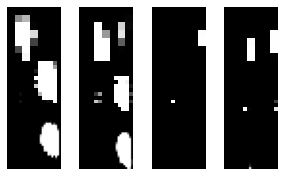

___________________________
tf.Tensor(3.9849715, shape=(), dtype=float32) - tf.Tensor(0.13299993, shape=(), dtype=float32)


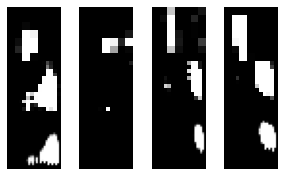

___________________________
tf.Tensor(5.1832747, shape=(), dtype=float32) - tf.Tensor(0.22498024, shape=(), dtype=float32)


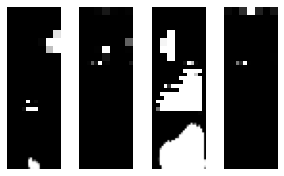

___________________________
tf.Tensor(5.967325, shape=(), dtype=float32) - tf.Tensor(0.09425013, shape=(), dtype=float32)


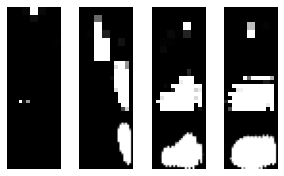

___________________________
tf.Tensor(7.33775, shape=(), dtype=float32) - tf.Tensor(0.1061964, shape=(), dtype=float32)


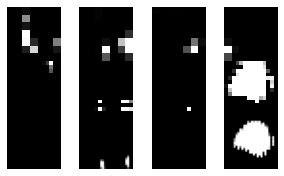

___________________________
tf.Tensor(7.974893, shape=(), dtype=float32) - tf.Tensor(0.040390156, shape=(), dtype=float32)


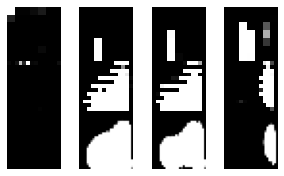

___________________________
tf.Tensor(8.8650875, shape=(), dtype=float32) - tf.Tensor(0.11724804, shape=(), dtype=float32)


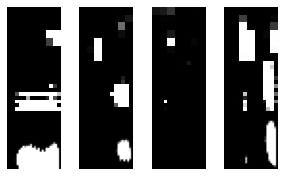

___________________________
tf.Tensor(9.097588, shape=(), dtype=float32) - tf.Tensor(0.1607621, shape=(), dtype=float32)


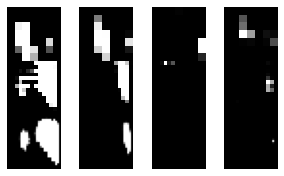

___________________________
tf.Tensor(9.608867, shape=(), dtype=float32) - tf.Tensor(0.008670857, shape=(), dtype=float32)


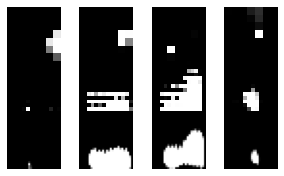

___________________________
tf.Tensor(9.004476, shape=(), dtype=float32) - tf.Tensor(0.36375558, shape=(), dtype=float32)


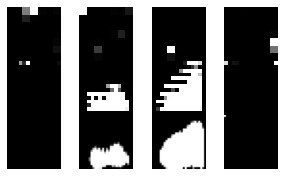

___________________________
tf.Tensor(8.109364, shape=(), dtype=float32) - tf.Tensor(0.1364953, shape=(), dtype=float32)


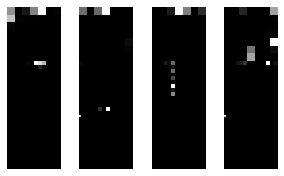

___________________________
tf.Tensor(6.9807143, shape=(), dtype=float32) - tf.Tensor(0.055204216, shape=(), dtype=float32)


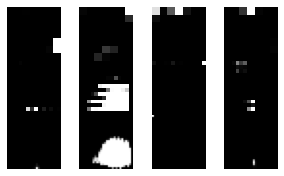

___________________________
tf.Tensor(5.748163, shape=(), dtype=float32) - tf.Tensor(0.103853285, shape=(), dtype=float32)


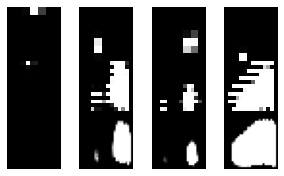

___________________________
tf.Tensor(4.701723, shape=(), dtype=float32) - tf.Tensor(0.10704161, shape=(), dtype=float32)


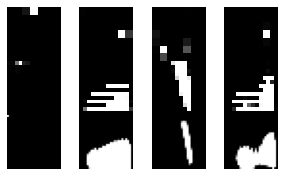

___________________________
tf.Tensor(4.3172946, shape=(), dtype=float32) - tf.Tensor(0.11664255, shape=(), dtype=float32)


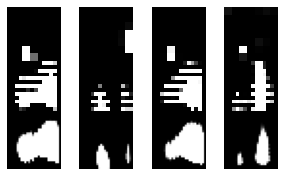

___________________________
tf.Tensor(5.620978, shape=(), dtype=float32) - tf.Tensor(0.05596915, shape=(), dtype=float32)


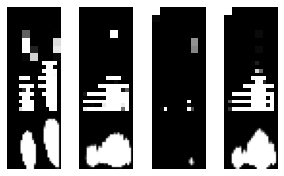

___________________________
tf.Tensor(5.2979965, shape=(), dtype=float32) - tf.Tensor(0.04834891, shape=(), dtype=float32)


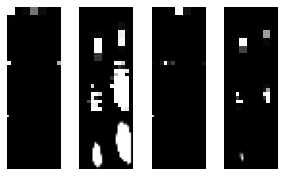

___________________________
tf.Tensor(5.736603, shape=(), dtype=float32) - tf.Tensor(0.039113536, shape=(), dtype=float32)


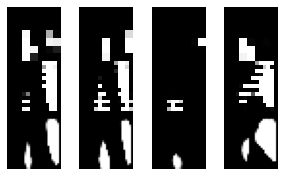

___________________________
tf.Tensor(7.227678, shape=(), dtype=float32) - tf.Tensor(0.0934839, shape=(), dtype=float32)


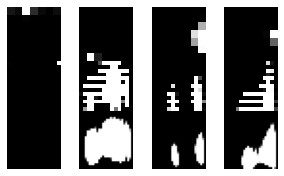

___________________________
tf.Tensor(6.4691224, shape=(), dtype=float32) - tf.Tensor(0.18104863, shape=(), dtype=float32)


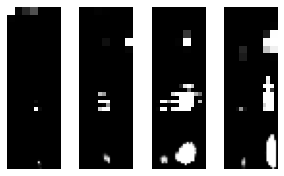

___________________________
tf.Tensor(7.181457, shape=(), dtype=float32) - tf.Tensor(0.010858889, shape=(), dtype=float32)


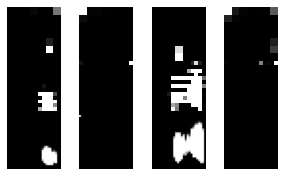

___________________________
tf.Tensor(6.1259537, shape=(), dtype=float32) - tf.Tensor(0.27687678, shape=(), dtype=float32)


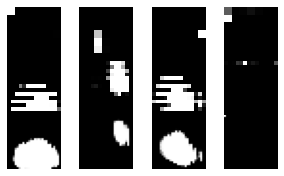

___________________________
tf.Tensor(6.300106, shape=(), dtype=float32) - tf.Tensor(0.14183527, shape=(), dtype=float32)


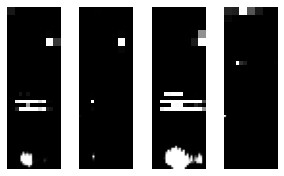

___________________________
tf.Tensor(6.367779, shape=(), dtype=float32) - tf.Tensor(0.018829677, shape=(), dtype=float32)


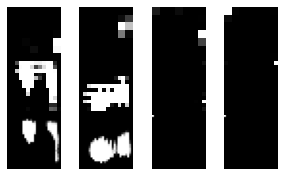

___________________________
tf.Tensor(6.476056, shape=(), dtype=float32) - tf.Tensor(0.036108613, shape=(), dtype=float32)


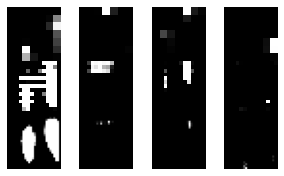

___________________________
tf.Tensor(6.723406, shape=(), dtype=float32) - tf.Tensor(0.02042059, shape=(), dtype=float32)


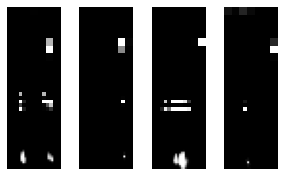

___________________________
tf.Tensor(6.549081, shape=(), dtype=float32) - tf.Tensor(0.08733068, shape=(), dtype=float32)


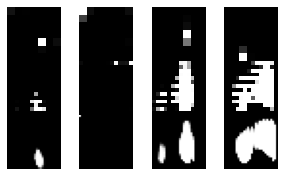

___________________________
tf.Tensor(6.4106064, shape=(), dtype=float32) - tf.Tensor(0.040572967, shape=(), dtype=float32)


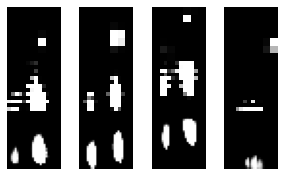

___________________________
tf.Tensor(6.8779726, shape=(), dtype=float32) - tf.Tensor(0.12283643, shape=(), dtype=float32)


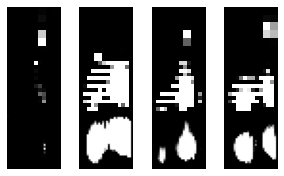

___________________________
tf.Tensor(6.441762, shape=(), dtype=float32) - tf.Tensor(0.12693772, shape=(), dtype=float32)


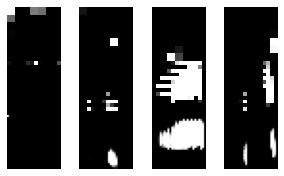

___________________________
tf.Tensor(5.7972546, shape=(), dtype=float32) - tf.Tensor(0.026350364, shape=(), dtype=float32)


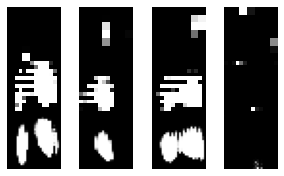

___________________________
tf.Tensor(5.916547, shape=(), dtype=float32) - tf.Tensor(0.035620693, shape=(), dtype=float32)


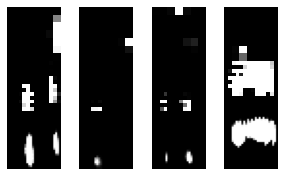

___________________________
tf.Tensor(5.4098883, shape=(), dtype=float32) - tf.Tensor(0.06769373, shape=(), dtype=float32)


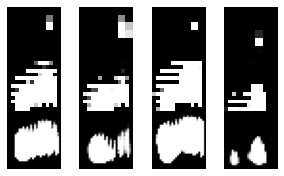

___________________________
tf.Tensor(5.7521696, shape=(), dtype=float32) - tf.Tensor(0.029575286, shape=(), dtype=float32)


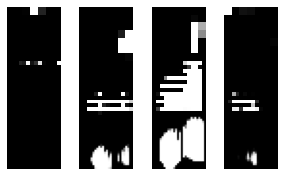

___________________________
tf.Tensor(6.4315577, shape=(), dtype=float32) - tf.Tensor(0.030887514, shape=(), dtype=float32)


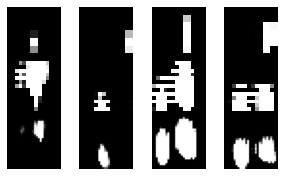

___________________________
tf.Tensor(6.205991, shape=(), dtype=float32) - tf.Tensor(0.049117148, shape=(), dtype=float32)


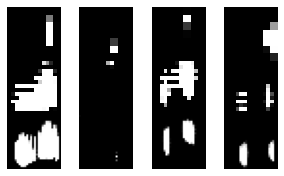

___________________________
tf.Tensor(7.0282826, shape=(), dtype=float32) - tf.Tensor(0.0966924, shape=(), dtype=float32)


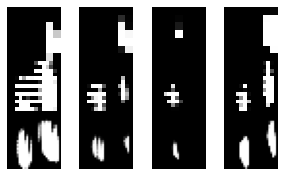

___________________________
tf.Tensor(6.9365005, shape=(), dtype=float32) - tf.Tensor(0.034127694, shape=(), dtype=float32)


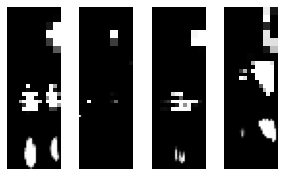

___________________________
tf.Tensor(7.0214853, shape=(), dtype=float32) - tf.Tensor(0.022754904, shape=(), dtype=float32)


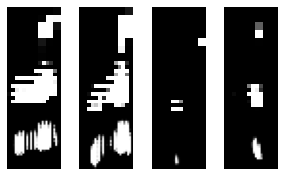

___________________________
tf.Tensor(7.363137, shape=(), dtype=float32) - tf.Tensor(0.0148077775, shape=(), dtype=float32)


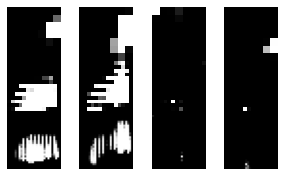

___________________________
tf.Tensor(7.792861, shape=(), dtype=float32) - tf.Tensor(0.005061775, shape=(), dtype=float32)


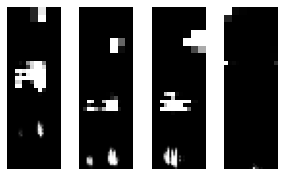

___________________________
tf.Tensor(7.903424, shape=(), dtype=float32) - tf.Tensor(0.17212643, shape=(), dtype=float32)


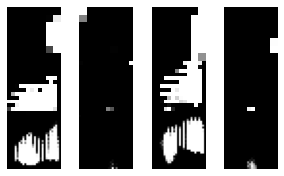

___________________________
tf.Tensor(6.9703975, shape=(), dtype=float32) - tf.Tensor(0.093792714, shape=(), dtype=float32)


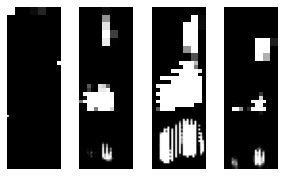

___________________________
tf.Tensor(5.779231, shape=(), dtype=float32) - tf.Tensor(0.033991642, shape=(), dtype=float32)


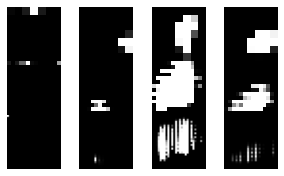

___________________________
tf.Tensor(6.3097816, shape=(), dtype=float32) - tf.Tensor(0.019865418, shape=(), dtype=float32)


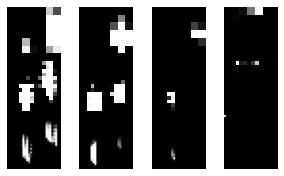

___________________________
tf.Tensor(6.3168883, shape=(), dtype=float32) - tf.Tensor(0.016934667, shape=(), dtype=float32)


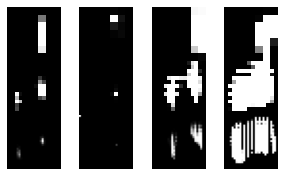

___________________________
tf.Tensor(7.037444, shape=(), dtype=float32) - tf.Tensor(0.0062081525, shape=(), dtype=float32)


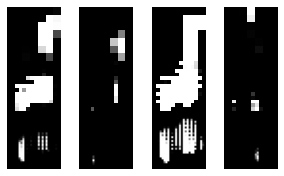

___________________________
tf.Tensor(6.966665, shape=(), dtype=float32) - tf.Tensor(0.020933552, shape=(), dtype=float32)


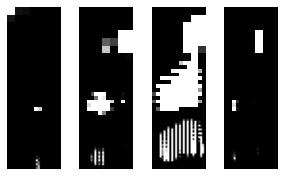

___________________________
tf.Tensor(8.009497, shape=(), dtype=float32) - tf.Tensor(0.060037706, shape=(), dtype=float32)


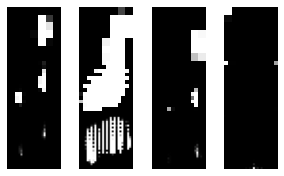

___________________________
tf.Tensor(7.221981, shape=(), dtype=float32) - tf.Tensor(0.0059744255, shape=(), dtype=float32)


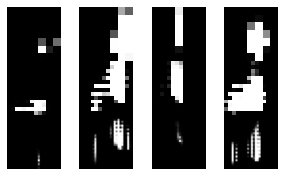

___________________________
tf.Tensor(7.181981, shape=(), dtype=float32) - tf.Tensor(0.036813837, shape=(), dtype=float32)


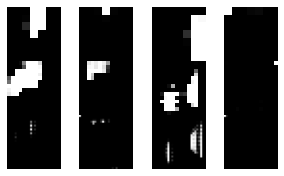

___________________________
tf.Tensor(6.774867, shape=(), dtype=float32) - tf.Tensor(0.0101723, shape=(), dtype=float32)


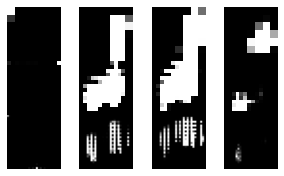

___________________________
tf.Tensor(6.0026293, shape=(), dtype=float32) - tf.Tensor(0.060334556, shape=(), dtype=float32)


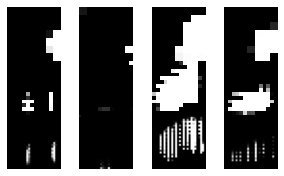

___________________________
tf.Tensor(6.004919, shape=(), dtype=float32) - tf.Tensor(0.014616564, shape=(), dtype=float32)


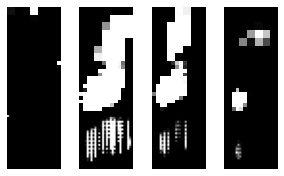

___________________________
tf.Tensor(6.2635326, shape=(), dtype=float32) - tf.Tensor(0.04722754, shape=(), dtype=float32)


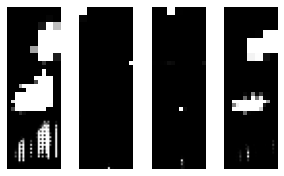

___________________________
tf.Tensor(6.972439, shape=(), dtype=float32) - tf.Tensor(0.016902003, shape=(), dtype=float32)


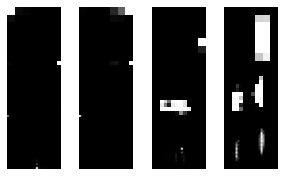

___________________________
tf.Tensor(6.9288073, shape=(), dtype=float32) - tf.Tensor(0.091878206, shape=(), dtype=float32)


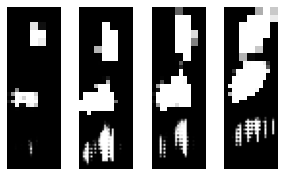

___________________________
tf.Tensor(9.091959, shape=(), dtype=float32) - tf.Tensor(0.024970587, shape=(), dtype=float32)


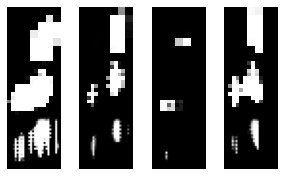

___________________________
tf.Tensor(8.798986, shape=(), dtype=float32) - tf.Tensor(0.033143748, shape=(), dtype=float32)


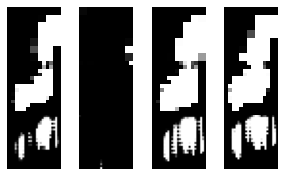

___________________________
tf.Tensor(9.041464, shape=(), dtype=float32) - tf.Tensor(0.0630986, shape=(), dtype=float32)


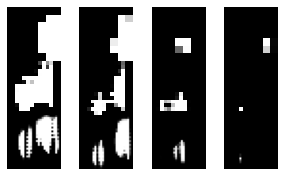

___________________________
tf.Tensor(10.14209, shape=(), dtype=float32) - tf.Tensor(0.0117409825, shape=(), dtype=float32)


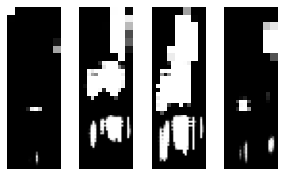

___________________________
tf.Tensor(11.196438, shape=(), dtype=float32) - tf.Tensor(0.0045614806, shape=(), dtype=float32)


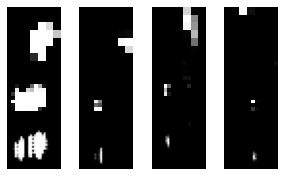

___________________________
tf.Tensor(10.975978, shape=(), dtype=float32) - tf.Tensor(0.022685848, shape=(), dtype=float32)


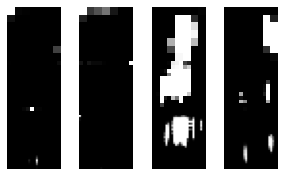

___________________________
tf.Tensor(12.239866, shape=(), dtype=float32) - tf.Tensor(0.08077778, shape=(), dtype=float32)


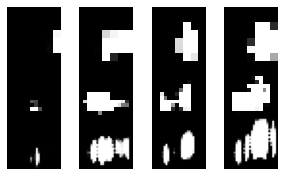

___________________________
tf.Tensor(10.696066, shape=(), dtype=float32) - tf.Tensor(0.053228207, shape=(), dtype=float32)


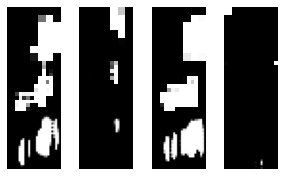

___________________________
tf.Tensor(10.100948, shape=(), dtype=float32) - tf.Tensor(0.25113183, shape=(), dtype=float32)


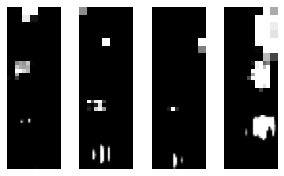

___________________________
tf.Tensor(9.243673, shape=(), dtype=float32) - tf.Tensor(0.26871568, shape=(), dtype=float32)


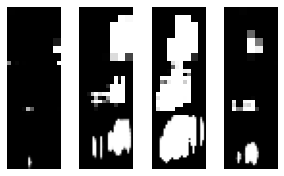

___________________________
tf.Tensor(10.062589, shape=(), dtype=float32) - tf.Tensor(0.068841234, shape=(), dtype=float32)


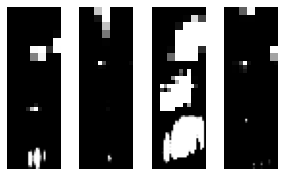

___________________________
tf.Tensor(9.939533, shape=(), dtype=float32) - tf.Tensor(0.19566071, shape=(), dtype=float32)


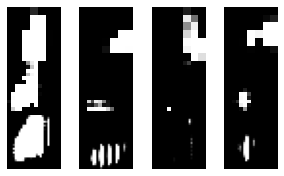

___________________________
tf.Tensor(8.131499, shape=(), dtype=float32) - tf.Tensor(0.1782022, shape=(), dtype=float32)


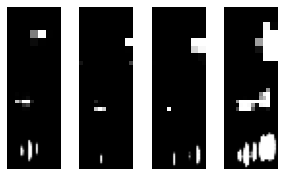

___________________________
tf.Tensor(6.882126, shape=(), dtype=float32) - tf.Tensor(0.25494778, shape=(), dtype=float32)


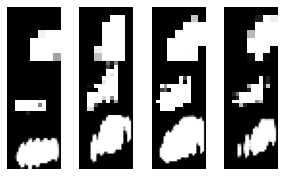

___________________________
tf.Tensor(5.0295405, shape=(), dtype=float32) - tf.Tensor(0.04449354, shape=(), dtype=float32)


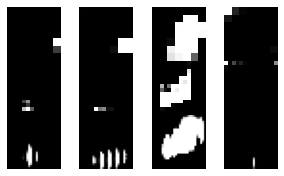

___________________________
tf.Tensor(4.0492945, shape=(), dtype=float32) - tf.Tensor(0.20738664, shape=(), dtype=float32)


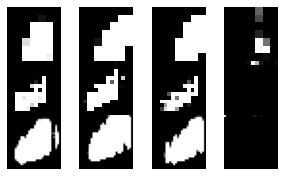

___________________________
tf.Tensor(4.583972, shape=(), dtype=float32) - tf.Tensor(0.072149776, shape=(), dtype=float32)


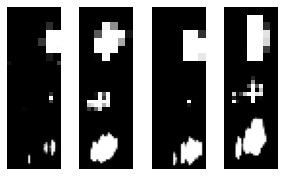

___________________________
tf.Tensor(5.159335, shape=(), dtype=float32) - tf.Tensor(0.017426819, shape=(), dtype=float32)


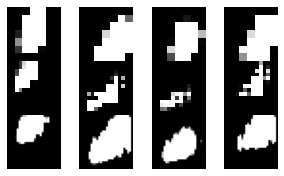

___________________________
tf.Tensor(7.1604204, shape=(), dtype=float32) - tf.Tensor(0.066412516, shape=(), dtype=float32)


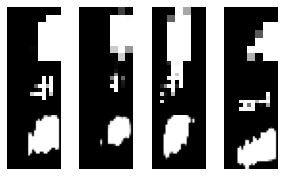

___________________________
tf.Tensor(7.7128544, shape=(), dtype=float32) - tf.Tensor(0.014672424, shape=(), dtype=float32)


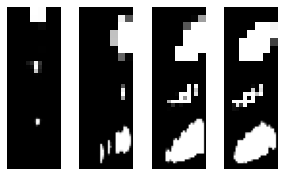

___________________________
tf.Tensor(8.236003, shape=(), dtype=float32) - tf.Tensor(0.035962135, shape=(), dtype=float32)


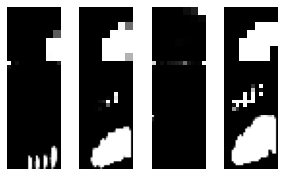

___________________________
tf.Tensor(8.668078, shape=(), dtype=float32) - tf.Tensor(0.032605138, shape=(), dtype=float32)


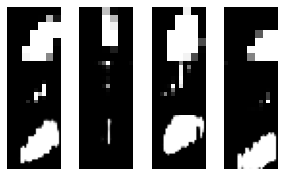

___________________________
tf.Tensor(9.865283, shape=(), dtype=float32) - tf.Tensor(0.05855378, shape=(), dtype=float32)


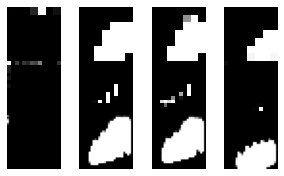

___________________________
tf.Tensor(9.465313, shape=(), dtype=float32) - tf.Tensor(0.010260664, shape=(), dtype=float32)


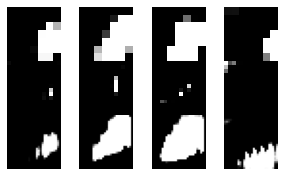

___________________________
tf.Tensor(9.1899805, shape=(), dtype=float32) - tf.Tensor(0.0041750073, shape=(), dtype=float32)


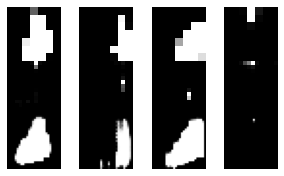

___________________________
tf.Tensor(9.22336, shape=(), dtype=float32) - tf.Tensor(0.021633781, shape=(), dtype=float32)


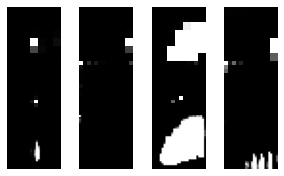

___________________________
tf.Tensor(9.325062, shape=(), dtype=float32) - tf.Tensor(0.010626833, shape=(), dtype=float32)


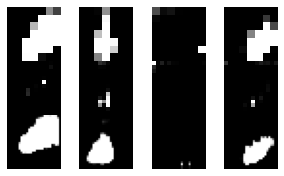

___________________________
tf.Tensor(8.806298, shape=(), dtype=float32) - tf.Tensor(0.019745303, shape=(), dtype=float32)


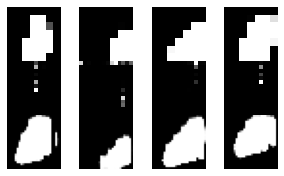

___________________________
tf.Tensor(8.659586, shape=(), dtype=float32) - tf.Tensor(0.013326021, shape=(), dtype=float32)


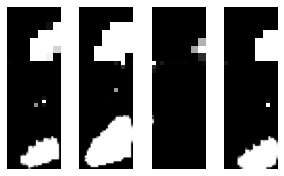

___________________________
tf.Tensor(8.004955, shape=(), dtype=float32) - tf.Tensor(0.009494123, shape=(), dtype=float32)


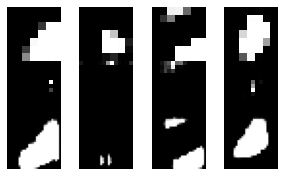

___________________________
tf.Tensor(8.270513, shape=(), dtype=float32) - tf.Tensor(0.008967562, shape=(), dtype=float32)


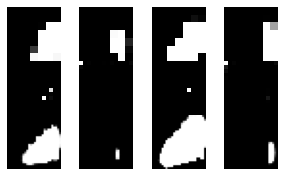

___________________________
tf.Tensor(8.234881, shape=(), dtype=float32) - tf.Tensor(0.002356802, shape=(), dtype=float32)


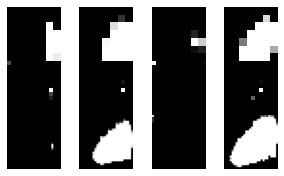

___________________________
tf.Tensor(8.253446, shape=(), dtype=float32) - tf.Tensor(0.0053423895, shape=(), dtype=float32)


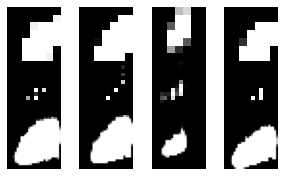

___________________________
tf.Tensor(8.154005, shape=(), dtype=float32) - tf.Tensor(0.025683846, shape=(), dtype=float32)


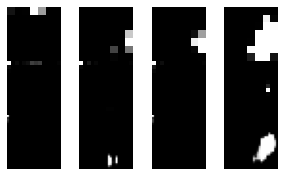

___________________________
tf.Tensor(8.035002, shape=(), dtype=float32) - tf.Tensor(0.006903548, shape=(), dtype=float32)


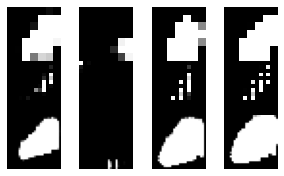

___________________________
tf.Tensor(7.438519, shape=(), dtype=float32) - tf.Tensor(0.008676896, shape=(), dtype=float32)


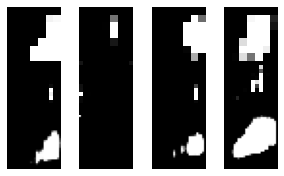

___________________________
tf.Tensor(7.386153, shape=(), dtype=float32) - tf.Tensor(0.013746331, shape=(), dtype=float32)


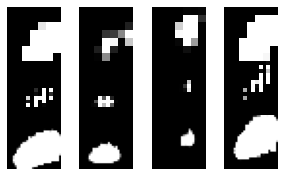

___________________________
tf.Tensor(6.3942294, shape=(), dtype=float32) - tf.Tensor(0.03791503, shape=(), dtype=float32)


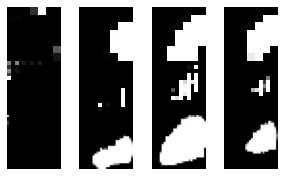

___________________________
tf.Tensor(7.0207686, shape=(), dtype=float32) - tf.Tensor(0.059495494, shape=(), dtype=float32)


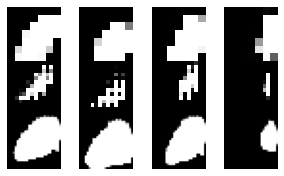

___________________________
tf.Tensor(6.584422, shape=(), dtype=float32) - tf.Tensor(0.009868133, shape=(), dtype=float32)


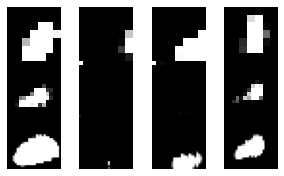

___________________________
tf.Tensor(5.717987, shape=(), dtype=float32) - tf.Tensor(0.014719508, shape=(), dtype=float32)


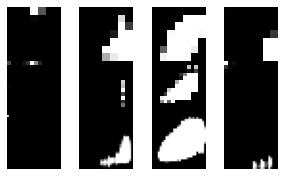

___________________________
tf.Tensor(6.2478576, shape=(), dtype=float32) - tf.Tensor(0.015031807, shape=(), dtype=float32)


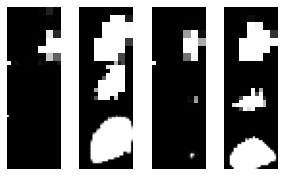

___________________________
tf.Tensor(6.3411345, shape=(), dtype=float32) - tf.Tensor(0.0169068, shape=(), dtype=float32)


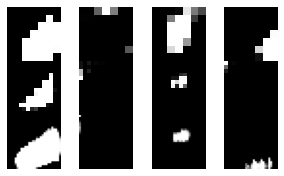

___________________________
tf.Tensor(8.063367, shape=(), dtype=float32) - tf.Tensor(0.0110351425, shape=(), dtype=float32)


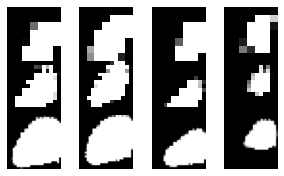

___________________________
tf.Tensor(8.658442, shape=(), dtype=float32) - tf.Tensor(0.017614804, shape=(), dtype=float32)


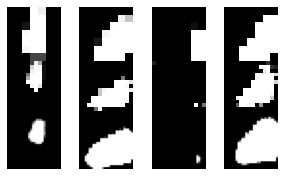

___________________________
tf.Tensor(9.295471, shape=(), dtype=float32) - tf.Tensor(0.026249396, shape=(), dtype=float32)


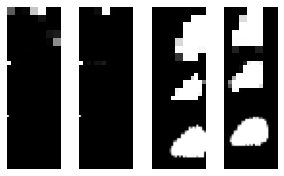

___________________________
tf.Tensor(9.141872, shape=(), dtype=float32) - tf.Tensor(0.0039366297, shape=(), dtype=float32)


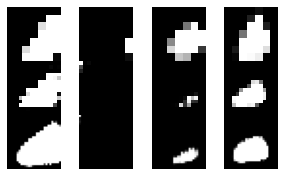

___________________________
tf.Tensor(9.592316, shape=(), dtype=float32) - tf.Tensor(0.01109302, shape=(), dtype=float32)


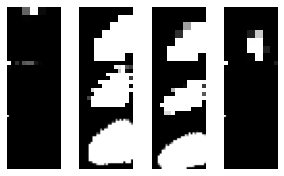

___________________________
tf.Tensor(9.380767, shape=(), dtype=float32) - tf.Tensor(0.004494652, shape=(), dtype=float32)


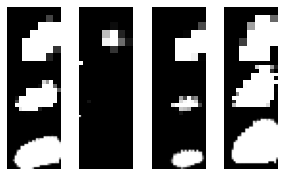

___________________________
tf.Tensor(9.901841, shape=(), dtype=float32) - tf.Tensor(0.08333903, shape=(), dtype=float32)


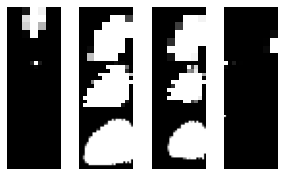

___________________________
tf.Tensor(9.543074, shape=(), dtype=float32) - tf.Tensor(0.0032154606, shape=(), dtype=float32)


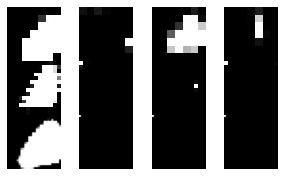

___________________________
tf.Tensor(9.595888, shape=(), dtype=float32) - tf.Tensor(0.010460148, shape=(), dtype=float32)


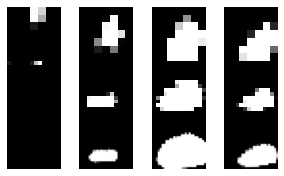

___________________________
tf.Tensor(8.77282, shape=(), dtype=float32) - tf.Tensor(0.005225528, shape=(), dtype=float32)


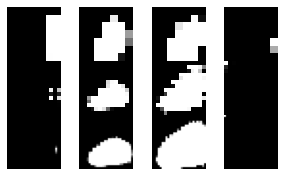

___________________________
tf.Tensor(9.479863, shape=(), dtype=float32) - tf.Tensor(0.0432317, shape=(), dtype=float32)


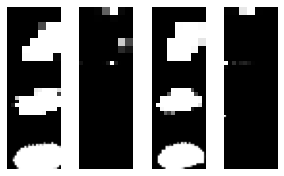

___________________________
tf.Tensor(9.003673, shape=(), dtype=float32) - tf.Tensor(0.018544575, shape=(), dtype=float32)


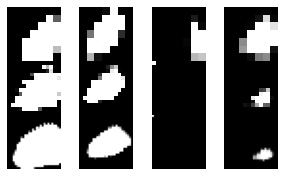

___________________________
tf.Tensor(8.122199, shape=(), dtype=float32) - tf.Tensor(0.21338412, shape=(), dtype=float32)


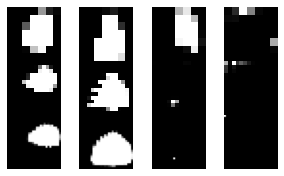

___________________________
tf.Tensor(9.782807, shape=(), dtype=float32) - tf.Tensor(0.039852586, shape=(), dtype=float32)


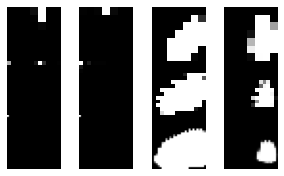

___________________________
tf.Tensor(10.442148, shape=(), dtype=float32) - tf.Tensor(0.1540126, shape=(), dtype=float32)


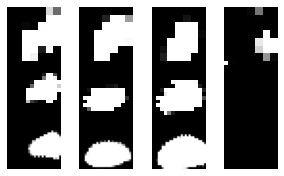

___________________________
tf.Tensor(10.741671, shape=(), dtype=float32) - tf.Tensor(0.038583007, shape=(), dtype=float32)


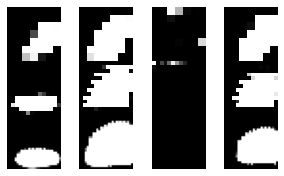

___________________________
tf.Tensor(10.7768, shape=(), dtype=float32) - tf.Tensor(0.101413965, shape=(), dtype=float32)


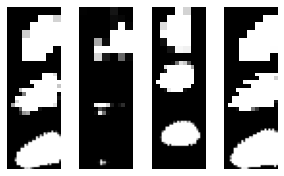

___________________________
tf.Tensor(9.961708, shape=(), dtype=float32) - tf.Tensor(0.09180534, shape=(), dtype=float32)


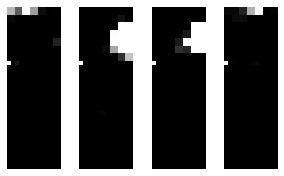

___________________________
tf.Tensor(9.657056, shape=(), dtype=float32) - tf.Tensor(0.09608165, shape=(), dtype=float32)


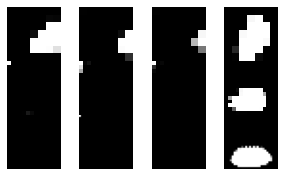

___________________________
tf.Tensor(8.258941, shape=(), dtype=float32) - tf.Tensor(0.03157957, shape=(), dtype=float32)


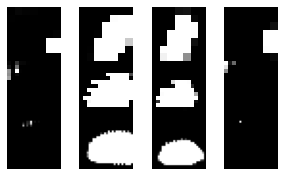

___________________________
tf.Tensor(8.365194, shape=(), dtype=float32) - tf.Tensor(0.10781857, shape=(), dtype=float32)


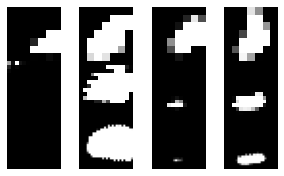

___________________________
tf.Tensor(7.8475533, shape=(), dtype=float32) - tf.Tensor(0.013794884, shape=(), dtype=float32)


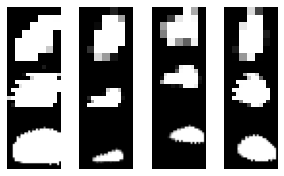

___________________________
tf.Tensor(6.931695, shape=(), dtype=float32) - tf.Tensor(0.031539455, shape=(), dtype=float32)


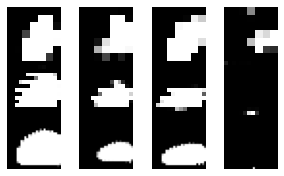

___________________________
tf.Tensor(7.212954, shape=(), dtype=float32) - tf.Tensor(0.06527574, shape=(), dtype=float32)


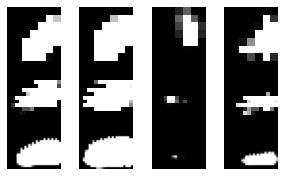

___________________________
tf.Tensor(7.3454113, shape=(), dtype=float32) - tf.Tensor(0.0692211, shape=(), dtype=float32)


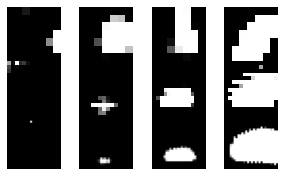

___________________________
tf.Tensor(8.62862, shape=(), dtype=float32) - tf.Tensor(0.035626225, shape=(), dtype=float32)


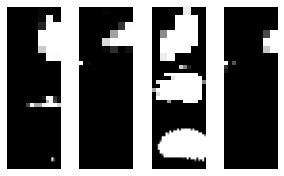

___________________________
tf.Tensor(9.714016, shape=(), dtype=float32) - tf.Tensor(0.017883718, shape=(), dtype=float32)


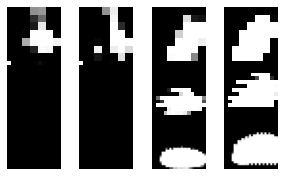

___________________________
tf.Tensor(9.098274, shape=(), dtype=float32) - tf.Tensor(0.029859366, shape=(), dtype=float32)


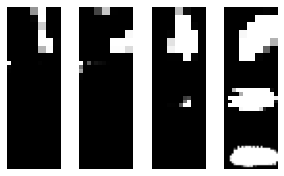

___________________________
tf.Tensor(8.803909, shape=(), dtype=float32) - tf.Tensor(0.002110742, shape=(), dtype=float32)


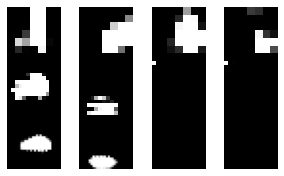

___________________________
tf.Tensor(8.023113, shape=(), dtype=float32) - tf.Tensor(0.016019717, shape=(), dtype=float32)


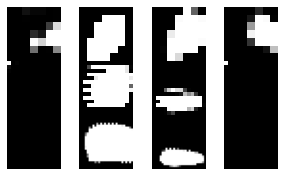

___________________________
tf.Tensor(8.456648, shape=(), dtype=float32) - tf.Tensor(0.0052669174, shape=(), dtype=float32)


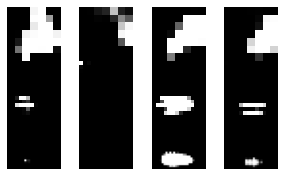

___________________________
tf.Tensor(8.5083475, shape=(), dtype=float32) - tf.Tensor(0.100635275, shape=(), dtype=float32)


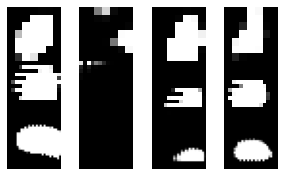

___________________________
tf.Tensor(7.746609, shape=(), dtype=float32) - tf.Tensor(0.018928342, shape=(), dtype=float32)


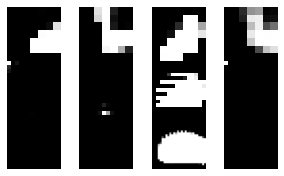

___________________________
tf.Tensor(7.366797, shape=(), dtype=float32) - tf.Tensor(0.014463126, shape=(), dtype=float32)


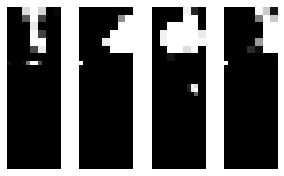

___________________________
tf.Tensor(7.3732495, shape=(), dtype=float32) - tf.Tensor(0.10601479, shape=(), dtype=float32)


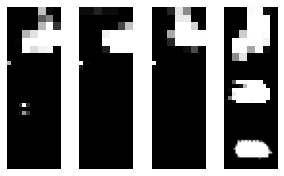

___________________________
tf.Tensor(10.501709, shape=(), dtype=float32) - tf.Tensor(0.09397995, shape=(), dtype=float32)


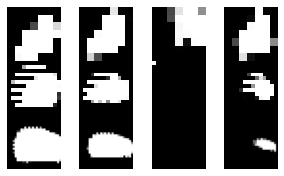

___________________________
tf.Tensor(12.222811, shape=(), dtype=float32) - tf.Tensor(0.014446081, shape=(), dtype=float32)


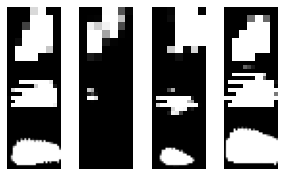

___________________________
tf.Tensor(12.687643, shape=(), dtype=float32) - tf.Tensor(0.118888065, shape=(), dtype=float32)


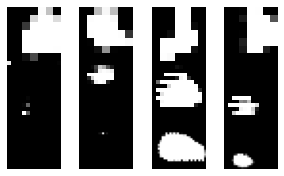

___________________________
tf.Tensor(12.126426, shape=(), dtype=float32) - tf.Tensor(0.011076461, shape=(), dtype=float32)


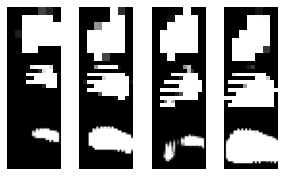

___________________________
tf.Tensor(11.493338, shape=(), dtype=float32) - tf.Tensor(0.0015690092, shape=(), dtype=float32)


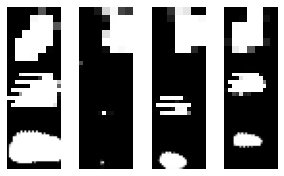

___________________________
tf.Tensor(10.77301, shape=(), dtype=float32) - tf.Tensor(0.031356663, shape=(), dtype=float32)


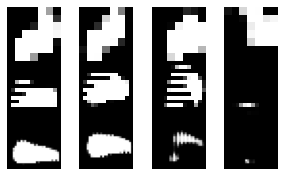

___________________________
tf.Tensor(9.458421, shape=(), dtype=float32) - tf.Tensor(0.0035091212, shape=(), dtype=float32)


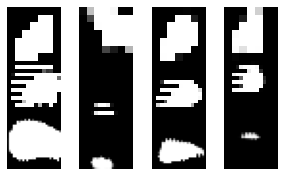

___________________________
tf.Tensor(8.836913, shape=(), dtype=float32) - tf.Tensor(0.009753726, shape=(), dtype=float32)


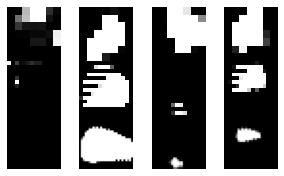

___________________________
tf.Tensor(7.296464, shape=(), dtype=float32) - tf.Tensor(0.0076776277, shape=(), dtype=float32)


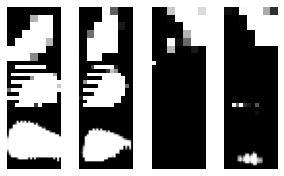

___________________________
tf.Tensor(7.3140097, shape=(), dtype=float32) - tf.Tensor(0.015593202, shape=(), dtype=float32)


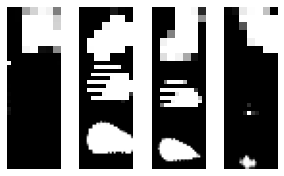

___________________________
tf.Tensor(7.641751, shape=(), dtype=float32) - tf.Tensor(0.011216887, shape=(), dtype=float32)


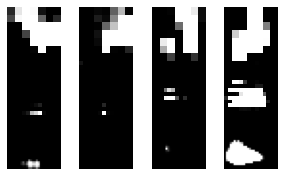

___________________________
tf.Tensor(7.9685054, shape=(), dtype=float32) - tf.Tensor(0.0074597765, shape=(), dtype=float32)


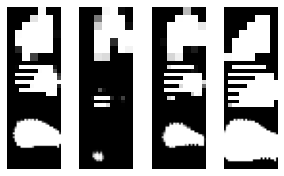

___________________________
tf.Tensor(7.88955, shape=(), dtype=float32) - tf.Tensor(0.0055844886, shape=(), dtype=float32)


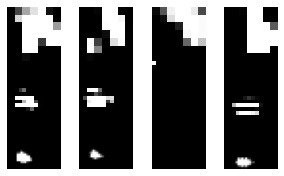

___________________________
tf.Tensor(8.973711, shape=(), dtype=float32) - tf.Tensor(0.09020626, shape=(), dtype=float32)


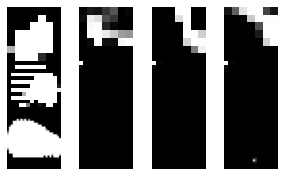

___________________________
tf.Tensor(8.797916, shape=(), dtype=float32) - tf.Tensor(0.0012157995, shape=(), dtype=float32)


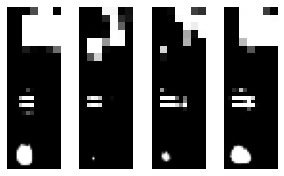

___________________________
tf.Tensor(7.9982004, shape=(), dtype=float32) - tf.Tensor(0.013570401, shape=(), dtype=float32)


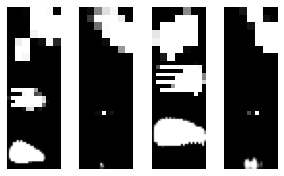

___________________________
tf.Tensor(9.622585, shape=(), dtype=float32) - tf.Tensor(0.0063770562, shape=(), dtype=float32)


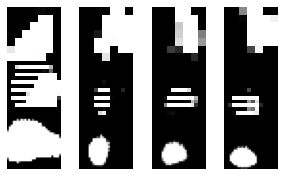

___________________________
tf.Tensor(8.413031, shape=(), dtype=float32) - tf.Tensor(0.027313698, shape=(), dtype=float32)


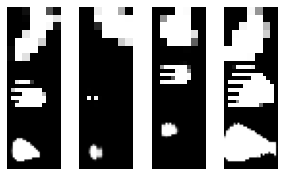

___________________________
tf.Tensor(10.376935, shape=(), dtype=float32) - tf.Tensor(0.0050291796, shape=(), dtype=float32)


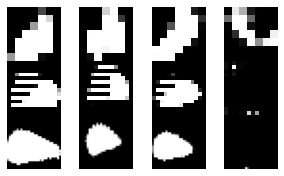

___________________________
tf.Tensor(10.344495, shape=(), dtype=float32) - tf.Tensor(0.00063836365, shape=(), dtype=float32)


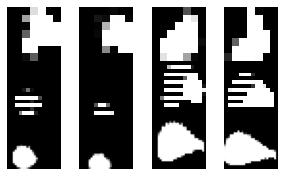

___________________________
tf.Tensor(10.833081, shape=(), dtype=float32) - tf.Tensor(0.057849955, shape=(), dtype=float32)


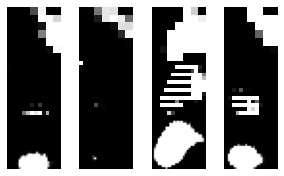

___________________________
tf.Tensor(10.267129, shape=(), dtype=float32) - tf.Tensor(0.0006133401, shape=(), dtype=float32)


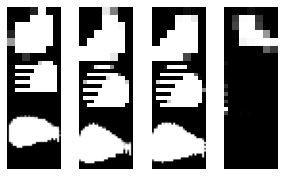

___________________________
tf.Tensor(9.957623, shape=(), dtype=float32) - tf.Tensor(0.003873069, shape=(), dtype=float32)


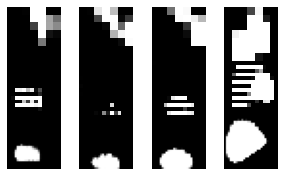

___________________________
tf.Tensor(10.029446, shape=(), dtype=float32) - tf.Tensor(0.004723717, shape=(), dtype=float32)


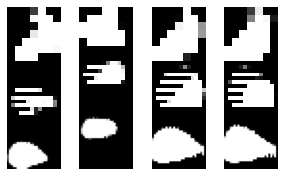

___________________________
tf.Tensor(9.106428, shape=(), dtype=float32) - tf.Tensor(0.004607111, shape=(), dtype=float32)


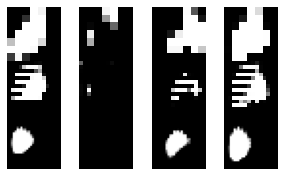

___________________________
tf.Tensor(8.324078, shape=(), dtype=float32) - tf.Tensor(0.0030844982, shape=(), dtype=float32)


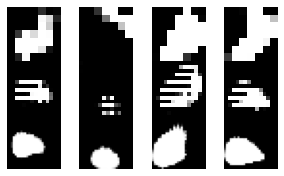

___________________________
tf.Tensor(8.329592, shape=(), dtype=float32) - tf.Tensor(0.010565149, shape=(), dtype=float32)


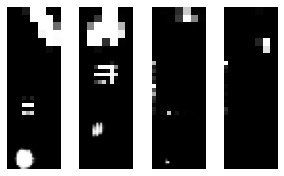

___________________________
tf.Tensor(7.328677, shape=(), dtype=float32) - tf.Tensor(0.00635084, shape=(), dtype=float32)


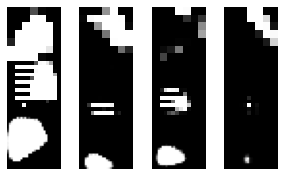

___________________________
tf.Tensor(7.379695, shape=(), dtype=float32) - tf.Tensor(0.03666549, shape=(), dtype=float32)


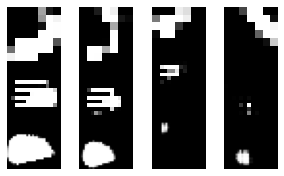

___________________________
tf.Tensor(8.1264, shape=(), dtype=float32) - tf.Tensor(0.054940194, shape=(), dtype=float32)


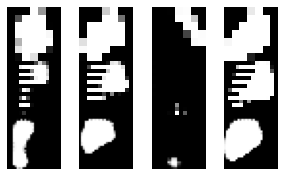

___________________________
tf.Tensor(8.02585, shape=(), dtype=float32) - tf.Tensor(0.022558214, shape=(), dtype=float32)


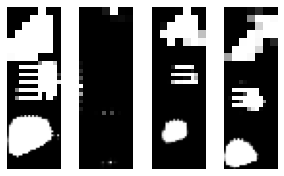

___________________________
tf.Tensor(9.16698, shape=(), dtype=float32) - tf.Tensor(0.0031809632, shape=(), dtype=float32)


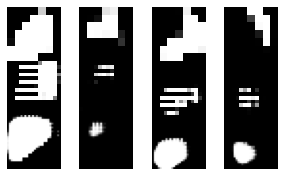

___________________________
tf.Tensor(9.737429, shape=(), dtype=float32) - tf.Tensor(0.030702908, shape=(), dtype=float32)


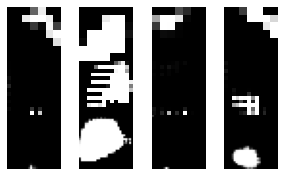

___________________________
tf.Tensor(11.022047, shape=(), dtype=float32) - tf.Tensor(0.0013865882, shape=(), dtype=float32)


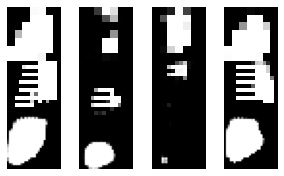

___________________________
tf.Tensor(12.215688, shape=(), dtype=float32) - tf.Tensor(0.0008487525, shape=(), dtype=float32)


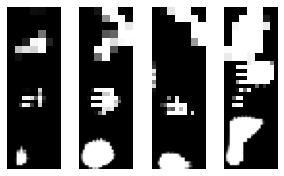

___________________________
tf.Tensor(12.6646805, shape=(), dtype=float32) - tf.Tensor(0.026388248, shape=(), dtype=float32)


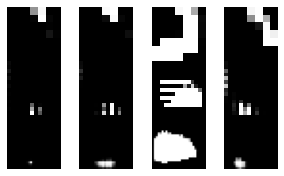

___________________________
tf.Tensor(12.9965, shape=(), dtype=float32) - tf.Tensor(0.00039077172, shape=(), dtype=float32)


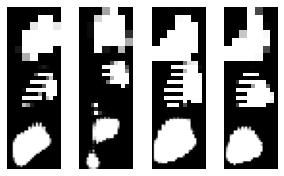

___________________________
tf.Tensor(13.167946, shape=(), dtype=float32) - tf.Tensor(0.00033152782, shape=(), dtype=float32)


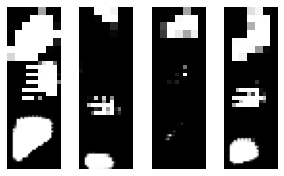

___________________________
tf.Tensor(12.330612, shape=(), dtype=float32) - tf.Tensor(0.07283312, shape=(), dtype=float32)


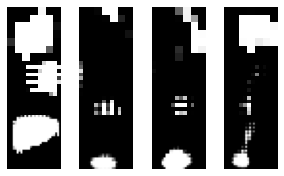

___________________________
tf.Tensor(11.482307, shape=(), dtype=float32) - tf.Tensor(0.01049094, shape=(), dtype=float32)


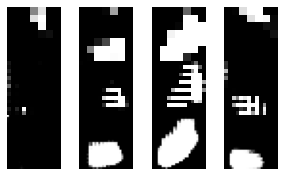

___________________________
tf.Tensor(11.084414, shape=(), dtype=float32) - tf.Tensor(0.0033165421, shape=(), dtype=float32)


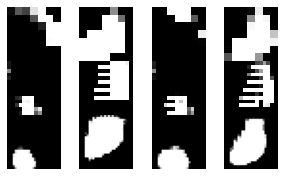

___________________________
tf.Tensor(10.080159, shape=(), dtype=float32) - tf.Tensor(0.22111027, shape=(), dtype=float32)


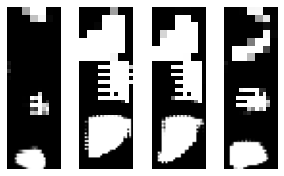

___________________________
tf.Tensor(8.867916, shape=(), dtype=float32) - tf.Tensor(0.036711976, shape=(), dtype=float32)


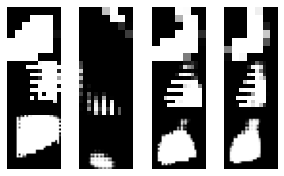

___________________________
tf.Tensor(6.4450607, shape=(), dtype=float32) - tf.Tensor(0.058168486, shape=(), dtype=float32)


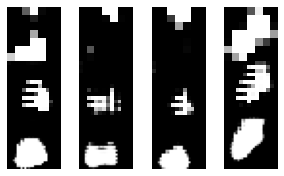

___________________________
tf.Tensor(6.00196, shape=(), dtype=float32) - tf.Tensor(0.16016015, shape=(), dtype=float32)


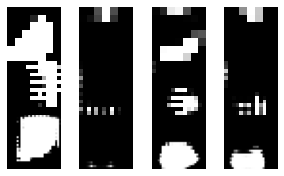

___________________________
tf.Tensor(9.638643, shape=(), dtype=float32) - tf.Tensor(0.04661332, shape=(), dtype=float32)


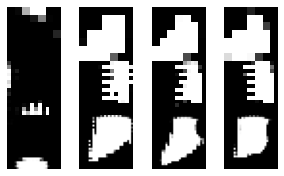

___________________________
tf.Tensor(10.790722, shape=(), dtype=float32) - tf.Tensor(0.06905985, shape=(), dtype=float32)


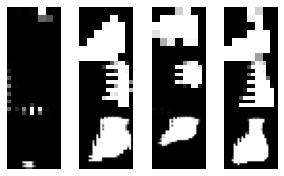

___________________________
tf.Tensor(11.5520935, shape=(), dtype=float32) - tf.Tensor(0.030711152, shape=(), dtype=float32)


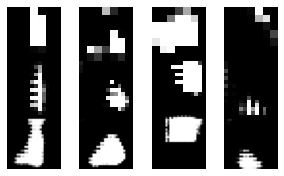

___________________________
tf.Tensor(12.078817, shape=(), dtype=float32) - tf.Tensor(0.022051273, shape=(), dtype=float32)


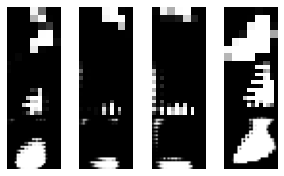

___________________________
tf.Tensor(11.090527, shape=(), dtype=float32) - tf.Tensor(0.0019293679, shape=(), dtype=float32)


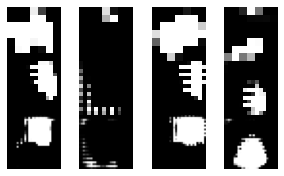

___________________________
tf.Tensor(9.996131, shape=(), dtype=float32) - tf.Tensor(0.25416952, shape=(), dtype=float32)


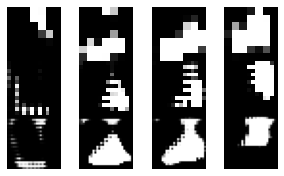

___________________________
tf.Tensor(9.126395, shape=(), dtype=float32) - tf.Tensor(0.08836353, shape=(), dtype=float32)


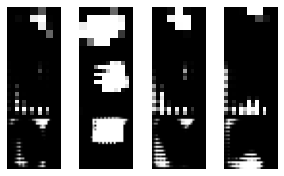

___________________________
tf.Tensor(6.962026, shape=(), dtype=float32) - tf.Tensor(0.10729029, shape=(), dtype=float32)


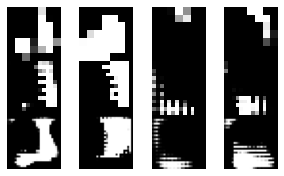

___________________________
tf.Tensor(5.791777, shape=(), dtype=float32) - tf.Tensor(0.3564906, shape=(), dtype=float32)


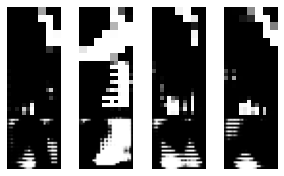

___________________________
tf.Tensor(9.291039, shape=(), dtype=float32) - tf.Tensor(0.010284987, shape=(), dtype=float32)


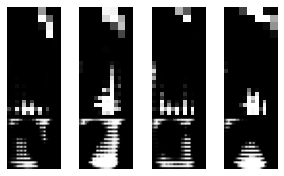

___________________________
tf.Tensor(11.222982, shape=(), dtype=float32) - tf.Tensor(0.10817914, shape=(), dtype=float32)


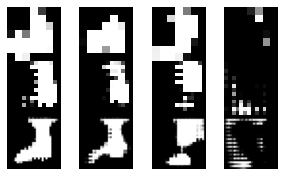

___________________________
tf.Tensor(11.563195, shape=(), dtype=float32) - tf.Tensor(0.5409048, shape=(), dtype=float32)


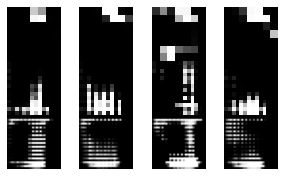

___________________________
tf.Tensor(12.589527, shape=(), dtype=float32) - tf.Tensor(0.23652026, shape=(), dtype=float32)


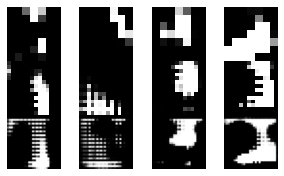

___________________________
tf.Tensor(10.773779, shape=(), dtype=float32) - tf.Tensor(0.17305955, shape=(), dtype=float32)


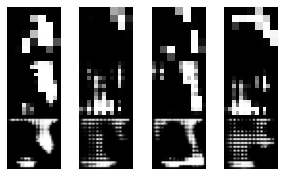

___________________________
tf.Tensor(8.545332, shape=(), dtype=float32) - tf.Tensor(0.16967885, shape=(), dtype=float32)


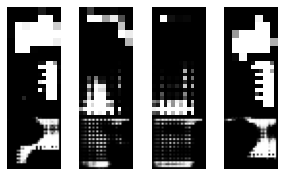

___________________________
tf.Tensor(5.6585383, shape=(), dtype=float32) - tf.Tensor(0.263745, shape=(), dtype=float32)


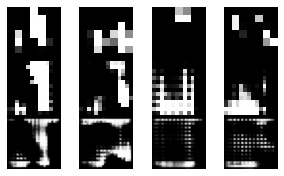

___________________________
tf.Tensor(7.955639, shape=(), dtype=float32) - tf.Tensor(0.18653631, shape=(), dtype=float32)


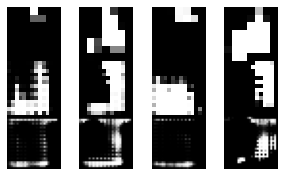

___________________________
tf.Tensor(8.646086, shape=(), dtype=float32) - tf.Tensor(0.13080725, shape=(), dtype=float32)


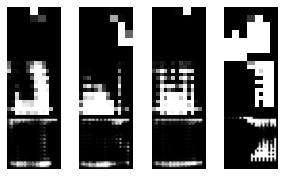

___________________________
tf.Tensor(7.832192, shape=(), dtype=float32) - tf.Tensor(0.06945108, shape=(), dtype=float32)


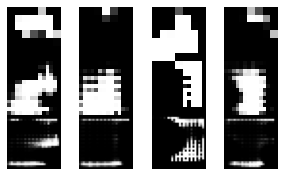

___________________________
tf.Tensor(6.44715, shape=(), dtype=float32) - tf.Tensor(0.1151772, shape=(), dtype=float32)


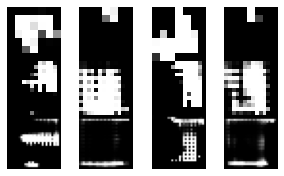

___________________________
tf.Tensor(5.5156417, shape=(), dtype=float32) - tf.Tensor(0.08466123, shape=(), dtype=float32)


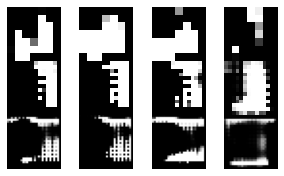

___________________________
tf.Tensor(4.023057, shape=(), dtype=float32) - tf.Tensor(0.13388042, shape=(), dtype=float32)


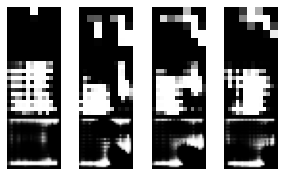

___________________________
tf.Tensor(3.3729758, shape=(), dtype=float32) - tf.Tensor(0.69724655, shape=(), dtype=float32)


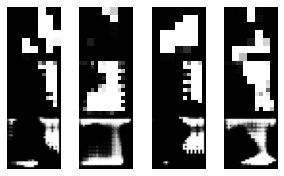

___________________________
tf.Tensor(4.0525017, shape=(), dtype=float32) - tf.Tensor(1.687181, shape=(), dtype=float32)


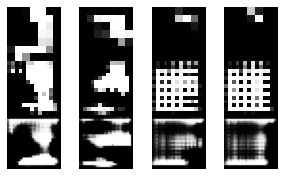

___________________________
tf.Tensor(7.452274, shape=(), dtype=float32) - tf.Tensor(1.0216827, shape=(), dtype=float32)


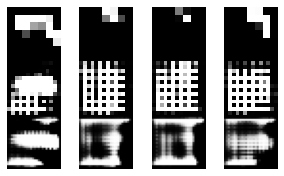

___________________________
tf.Tensor(8.176362, shape=(), dtype=float32) - tf.Tensor(1.5725173, shape=(), dtype=float32)


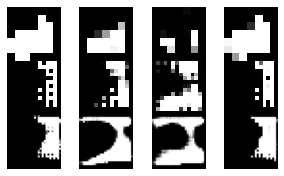

___________________________
tf.Tensor(6.526962, shape=(), dtype=float32) - tf.Tensor(0.9086046, shape=(), dtype=float32)


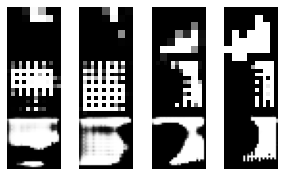

___________________________
tf.Tensor(5.44024, shape=(), dtype=float32) - tf.Tensor(0.21148793, shape=(), dtype=float32)


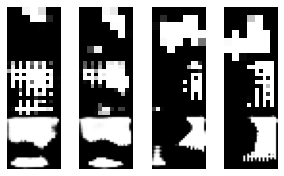

___________________________
tf.Tensor(3.8254356, shape=(), dtype=float32) - tf.Tensor(0.20013738, shape=(), dtype=float32)


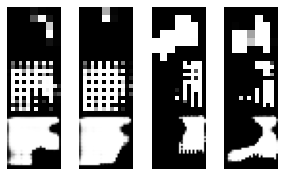

___________________________
tf.Tensor(3.3775709, shape=(), dtype=float32) - tf.Tensor(0.29211295, shape=(), dtype=float32)


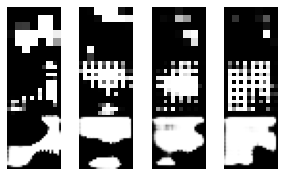

___________________________
tf.Tensor(3.129754, shape=(), dtype=float32) - tf.Tensor(0.26126358, shape=(), dtype=float32)


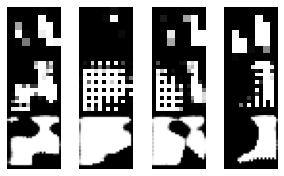

___________________________
tf.Tensor(3.8027468, shape=(), dtype=float32) - tf.Tensor(0.29581895, shape=(), dtype=float32)


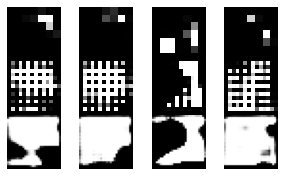

___________________________
tf.Tensor(3.818647, shape=(), dtype=float32) - tf.Tensor(0.38664642, shape=(), dtype=float32)


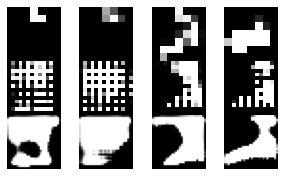

___________________________
tf.Tensor(4.4155297, shape=(), dtype=float32) - tf.Tensor(0.12627368, shape=(), dtype=float32)


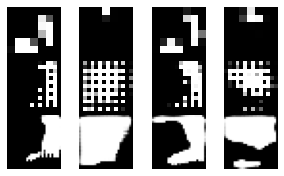

___________________________
tf.Tensor(4.291044, shape=(), dtype=float32) - tf.Tensor(0.20099849, shape=(), dtype=float32)


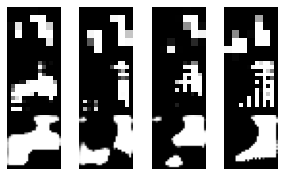

___________________________
tf.Tensor(5.043902, shape=(), dtype=float32) - tf.Tensor(0.122444995, shape=(), dtype=float32)


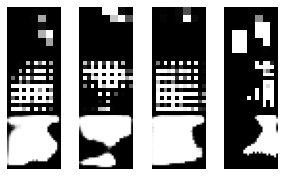

___________________________
tf.Tensor(4.896674, shape=(), dtype=float32) - tf.Tensor(0.35556287, shape=(), dtype=float32)


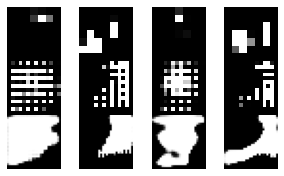

___________________________
tf.Tensor(4.591546, shape=(), dtype=float32) - tf.Tensor(0.2997933, shape=(), dtype=float32)


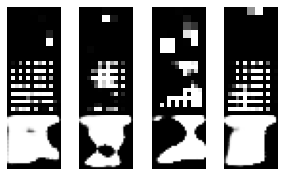

___________________________
tf.Tensor(3.5947514, shape=(), dtype=float32) - tf.Tensor(0.3806959, shape=(), dtype=float32)


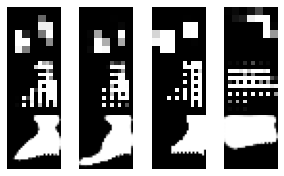

___________________________
tf.Tensor(3.318822, shape=(), dtype=float32) - tf.Tensor(0.4085005, shape=(), dtype=float32)


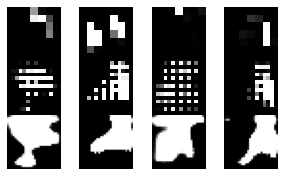

___________________________
tf.Tensor(3.485559, shape=(), dtype=float32) - tf.Tensor(0.34943703, shape=(), dtype=float32)


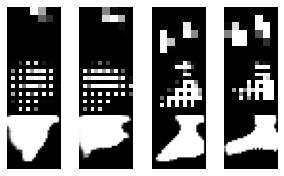

___________________________
tf.Tensor(3.2477443, shape=(), dtype=float32) - tf.Tensor(0.35595548, shape=(), dtype=float32)


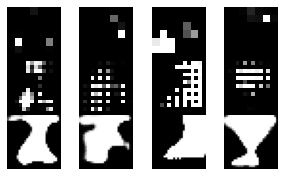

___________________________
tf.Tensor(4.280817, shape=(), dtype=float32) - tf.Tensor(0.15955848, shape=(), dtype=float32)


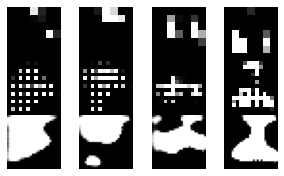

___________________________
tf.Tensor(5.3940105, shape=(), dtype=float32) - tf.Tensor(0.1652567, shape=(), dtype=float32)


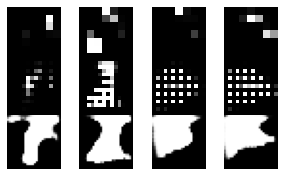

___________________________
tf.Tensor(5.729171, shape=(), dtype=float32) - tf.Tensor(0.23763792, shape=(), dtype=float32)


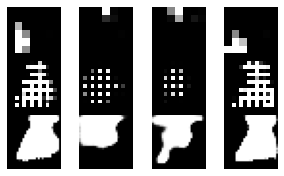

___________________________
tf.Tensor(6.026764, shape=(), dtype=float32) - tf.Tensor(0.17003001, shape=(), dtype=float32)


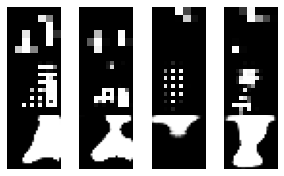

___________________________
tf.Tensor(5.475156, shape=(), dtype=float32) - tf.Tensor(0.12769635, shape=(), dtype=float32)


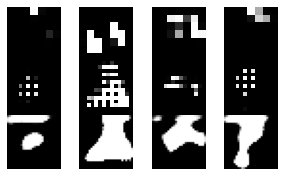

___________________________
tf.Tensor(5.5699196, shape=(), dtype=float32) - tf.Tensor(0.11850868, shape=(), dtype=float32)


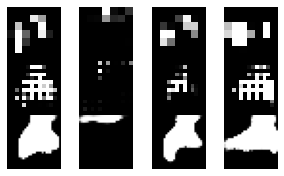

___________________________
tf.Tensor(5.2443166, shape=(), dtype=float32) - tf.Tensor(0.21628821, shape=(), dtype=float32)


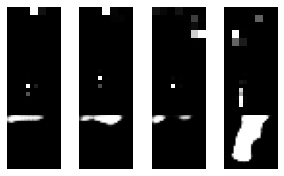

___________________________
tf.Tensor(4.7794633, shape=(), dtype=float32) - tf.Tensor(0.37171978, shape=(), dtype=float32)


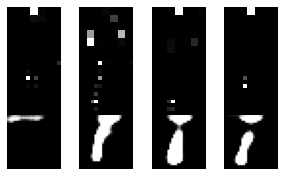

___________________________
tf.Tensor(4.3614445, shape=(), dtype=float32) - tf.Tensor(0.2442073, shape=(), dtype=float32)


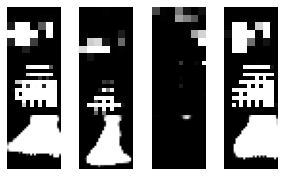

___________________________
tf.Tensor(5.436967, shape=(), dtype=float32) - tf.Tensor(0.26740557, shape=(), dtype=float32)


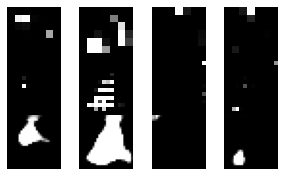

___________________________
tf.Tensor(7.8040442, shape=(), dtype=float32) - tf.Tensor(0.3564464, shape=(), dtype=float32)


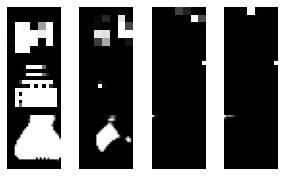

___________________________
tf.Tensor(7.5615497, shape=(), dtype=float32) - tf.Tensor(0.23774056, shape=(), dtype=float32)


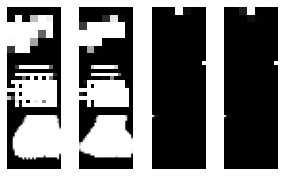

___________________________
tf.Tensor(8.625402, shape=(), dtype=float32) - tf.Tensor(0.18403332, shape=(), dtype=float32)


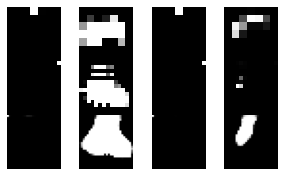

___________________________
tf.Tensor(7.903556, shape=(), dtype=float32) - tf.Tensor(0.25091833, shape=(), dtype=float32)


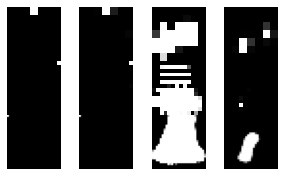

___________________________
tf.Tensor(7.000932, shape=(), dtype=float32) - tf.Tensor(0.14483677, shape=(), dtype=float32)


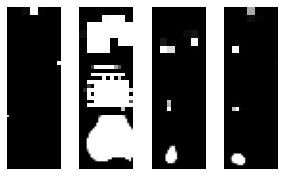

___________________________
tf.Tensor(6.4132304, shape=(), dtype=float32) - tf.Tensor(0.23418249, shape=(), dtype=float32)


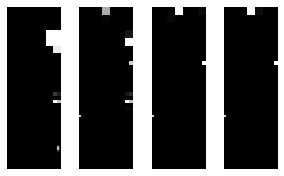

___________________________
tf.Tensor(4.7030697, shape=(), dtype=float32) - tf.Tensor(0.42185247, shape=(), dtype=float32)


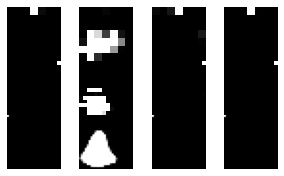

___________________________
tf.Tensor(6.6889477, shape=(), dtype=float32) - tf.Tensor(0.17102757, shape=(), dtype=float32)


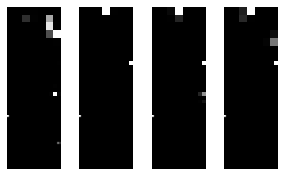

___________________________
tf.Tensor(10.6607895, shape=(), dtype=float32) - tf.Tensor(0.45233226, shape=(), dtype=float32)


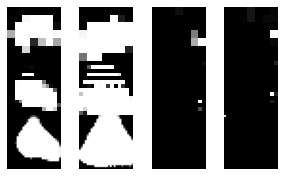

___________________________
tf.Tensor(8.647702, shape=(), dtype=float32) - tf.Tensor(0.064191565, shape=(), dtype=float32)


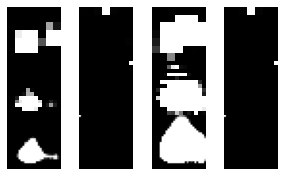

___________________________
tf.Tensor(7.4587116, shape=(), dtype=float32) - tf.Tensor(0.118892886, shape=(), dtype=float32)


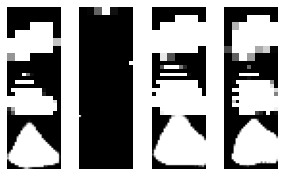

___________________________
tf.Tensor(5.5372896, shape=(), dtype=float32) - tf.Tensor(0.16003074, shape=(), dtype=float32)


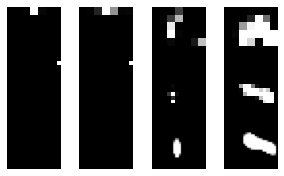

___________________________
tf.Tensor(7.3750854, shape=(), dtype=float32) - tf.Tensor(0.13018754, shape=(), dtype=float32)


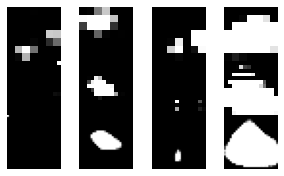

___________________________
tf.Tensor(8.902405, shape=(), dtype=float32) - tf.Tensor(0.031604946, shape=(), dtype=float32)


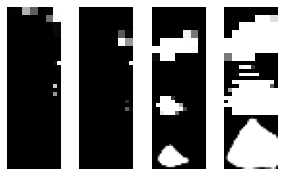

___________________________
tf.Tensor(10.104684, shape=(), dtype=float32) - tf.Tensor(0.24963981, shape=(), dtype=float32)


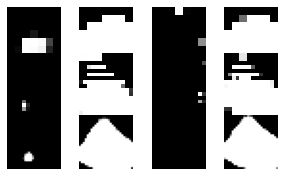

___________________________
tf.Tensor(8.878596, shape=(), dtype=float32) - tf.Tensor(0.2897288, shape=(), dtype=float32)


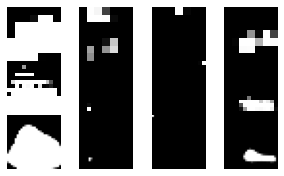

___________________________
tf.Tensor(7.2197957, shape=(), dtype=float32) - tf.Tensor(0.099920064, shape=(), dtype=float32)


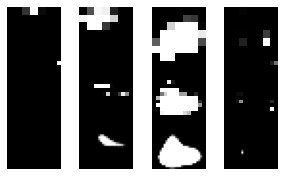

___________________________
tf.Tensor(5.9853883, shape=(), dtype=float32) - tf.Tensor(0.42772824, shape=(), dtype=float32)


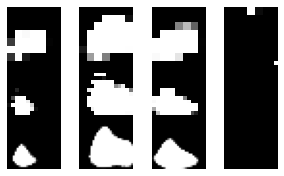

___________________________
tf.Tensor(8.4981575, shape=(), dtype=float32) - tf.Tensor(0.16911322, shape=(), dtype=float32)


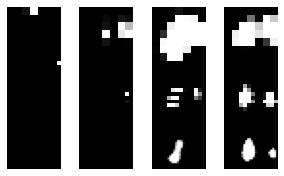

___________________________
tf.Tensor(11.155355, shape=(), dtype=float32) - tf.Tensor(0.13478103, shape=(), dtype=float32)


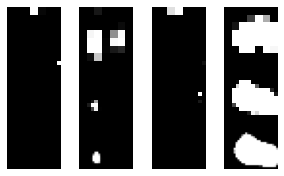

___________________________
tf.Tensor(10.7960415, shape=(), dtype=float32) - tf.Tensor(0.033644617, shape=(), dtype=float32)


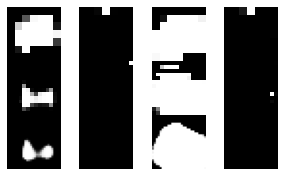

___________________________
tf.Tensor(10.759691, shape=(), dtype=float32) - tf.Tensor(0.23047823, shape=(), dtype=float32)


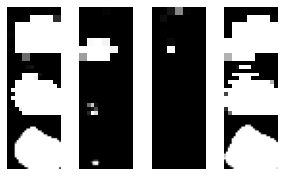

___________________________
tf.Tensor(10.9012785, shape=(), dtype=float32) - tf.Tensor(0.3230483, shape=(), dtype=float32)


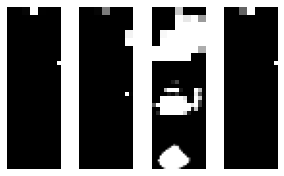

___________________________
tf.Tensor(10.897579, shape=(), dtype=float32) - tf.Tensor(0.17993495, shape=(), dtype=float32)


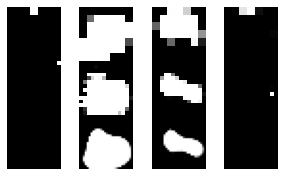

___________________________
tf.Tensor(10.474836, shape=(), dtype=float32) - tf.Tensor(0.067169115, shape=(), dtype=float32)


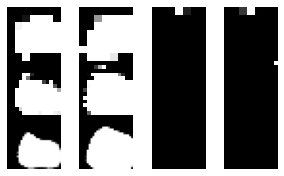

___________________________
tf.Tensor(9.740349, shape=(), dtype=float32) - tf.Tensor(0.098465204, shape=(), dtype=float32)


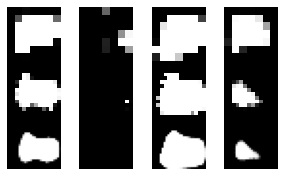

___________________________
tf.Tensor(9.218903, shape=(), dtype=float32) - tf.Tensor(0.17973462, shape=(), dtype=float32)


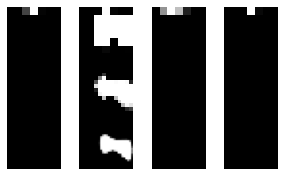

___________________________
tf.Tensor(7.9903226, shape=(), dtype=float32) - tf.Tensor(0.33228764, shape=(), dtype=float32)


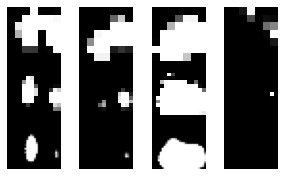

___________________________
tf.Tensor(8.506353, shape=(), dtype=float32) - tf.Tensor(0.04826936, shape=(), dtype=float32)


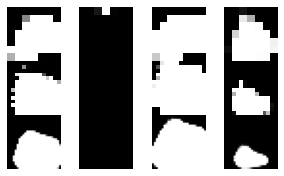

___________________________
tf.Tensor(7.769322, shape=(), dtype=float32) - tf.Tensor(0.19421397, shape=(), dtype=float32)


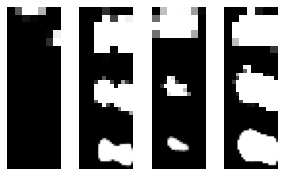

___________________________
tf.Tensor(9.478125, shape=(), dtype=float32) - tf.Tensor(0.26998082, shape=(), dtype=float32)


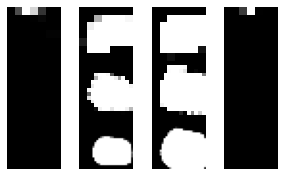

___________________________
tf.Tensor(9.415033, shape=(), dtype=float32) - tf.Tensor(0.040584855, shape=(), dtype=float32)


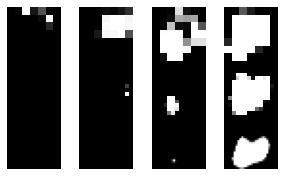

___________________________
tf.Tensor(9.903236, shape=(), dtype=float32) - tf.Tensor(0.18475324, shape=(), dtype=float32)


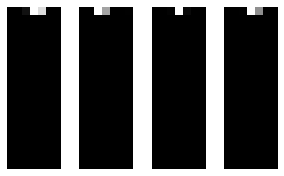

___________________________
tf.Tensor(9.367466, shape=(), dtype=float32) - tf.Tensor(0.21452877, shape=(), dtype=float32)


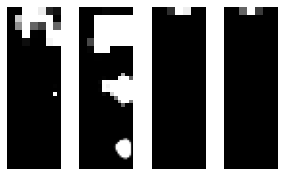

___________________________
tf.Tensor(8.936657, shape=(), dtype=float32) - tf.Tensor(0.049165513, shape=(), dtype=float32)


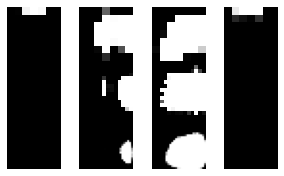

___________________________
tf.Tensor(8.079213, shape=(), dtype=float32) - tf.Tensor(0.11888501, shape=(), dtype=float32)


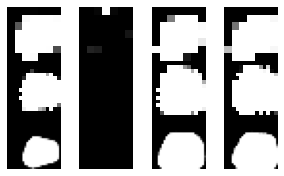

___________________________
tf.Tensor(7.5928974, shape=(), dtype=float32) - tf.Tensor(0.024104767, shape=(), dtype=float32)


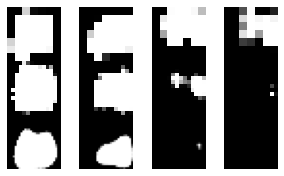

___________________________
tf.Tensor(8.40949, shape=(), dtype=float32) - tf.Tensor(0.05935111, shape=(), dtype=float32)


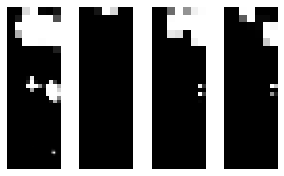

___________________________
tf.Tensor(7.654677, shape=(), dtype=float32) - tf.Tensor(0.023940371, shape=(), dtype=float32)


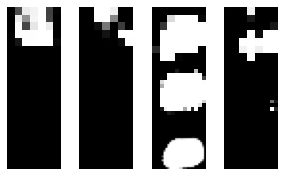

___________________________
tf.Tensor(8.001343, shape=(), dtype=float32) - tf.Tensor(0.038176805, shape=(), dtype=float32)


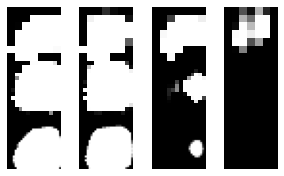

___________________________
tf.Tensor(7.8558226, shape=(), dtype=float32) - tf.Tensor(0.07743815, shape=(), dtype=float32)


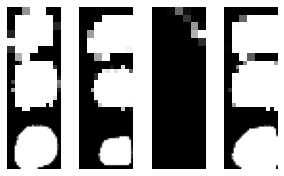

___________________________
tf.Tensor(7.7460704, shape=(), dtype=float32) - tf.Tensor(0.09500704, shape=(), dtype=float32)


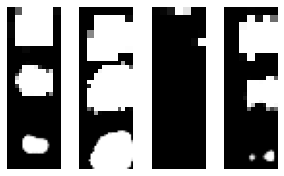

___________________________
tf.Tensor(5.9049087, shape=(), dtype=float32) - tf.Tensor(0.040006533, shape=(), dtype=float32)


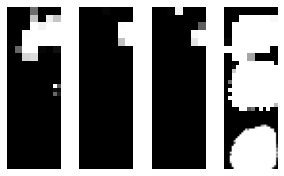

___________________________
tf.Tensor(6.419897, shape=(), dtype=float32) - tf.Tensor(0.085273445, shape=(), dtype=float32)


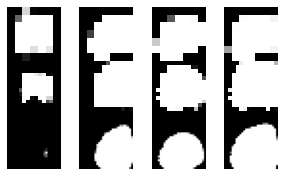

___________________________
tf.Tensor(7.027157, shape=(), dtype=float32) - tf.Tensor(0.013974376, shape=(), dtype=float32)


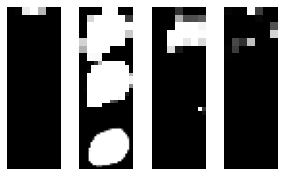

___________________________
tf.Tensor(6.5209146, shape=(), dtype=float32) - tf.Tensor(0.019954974, shape=(), dtype=float32)


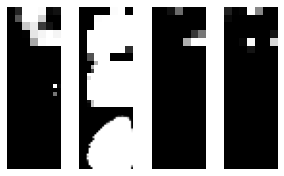

___________________________
tf.Tensor(6.5588813, shape=(), dtype=float32) - tf.Tensor(0.037056714, shape=(), dtype=float32)


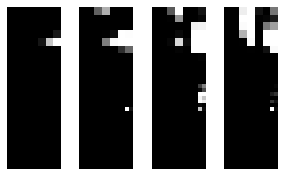

___________________________
tf.Tensor(7.304145, shape=(), dtype=float32) - tf.Tensor(0.054378316, shape=(), dtype=float32)


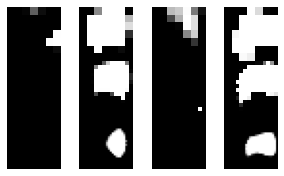

___________________________
tf.Tensor(7.283028, shape=(), dtype=float32) - tf.Tensor(0.065100886, shape=(), dtype=float32)


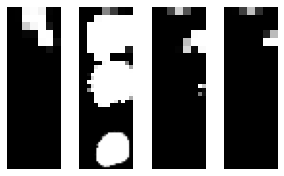

___________________________
tf.Tensor(9.229636, shape=(), dtype=float32) - tf.Tensor(0.008228978, shape=(), dtype=float32)


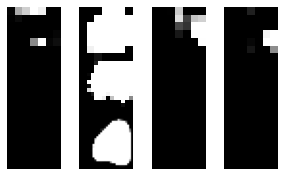

___________________________
tf.Tensor(10.369014, shape=(), dtype=float32) - tf.Tensor(0.03284666, shape=(), dtype=float32)


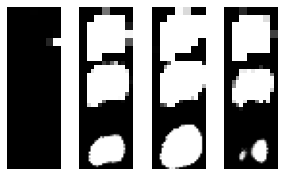

___________________________
tf.Tensor(11.081894, shape=(), dtype=float32) - tf.Tensor(0.07937755, shape=(), dtype=float32)


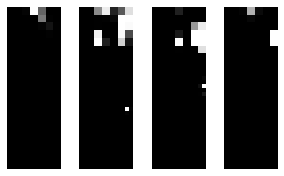

___________________________
tf.Tensor(12.192587, shape=(), dtype=float32) - tf.Tensor(0.1439375, shape=(), dtype=float32)


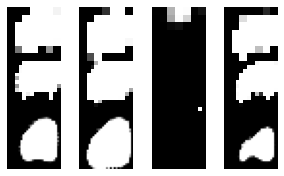

___________________________
tf.Tensor(12.509665, shape=(), dtype=float32) - tf.Tensor(0.12615743, shape=(), dtype=float32)


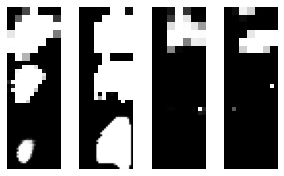

___________________________
tf.Tensor(10.880096, shape=(), dtype=float32) - tf.Tensor(0.0026306733, shape=(), dtype=float32)


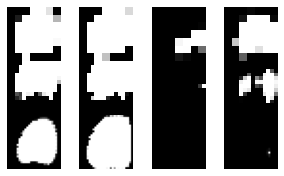

___________________________
tf.Tensor(9.567097, shape=(), dtype=float32) - tf.Tensor(0.12216472, shape=(), dtype=float32)


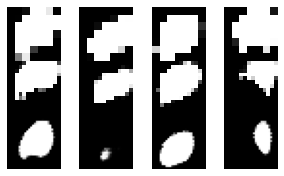

___________________________
tf.Tensor(10.283917, shape=(), dtype=float32) - tf.Tensor(0.0047908467, shape=(), dtype=float32)


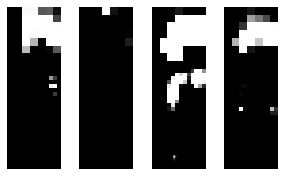

___________________________
tf.Tensor(9.955813, shape=(), dtype=float32) - tf.Tensor(0.058475412, shape=(), dtype=float32)


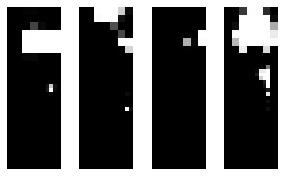

___________________________
tf.Tensor(10.182579, shape=(), dtype=float32) - tf.Tensor(0.007222663, shape=(), dtype=float32)


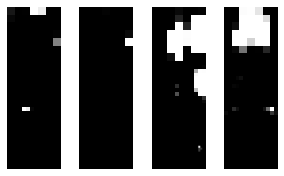

___________________________
tf.Tensor(9.353458, shape=(), dtype=float32) - tf.Tensor(0.1748067, shape=(), dtype=float32)


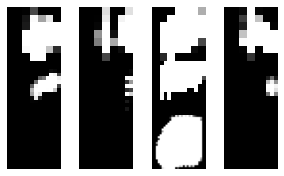

___________________________
tf.Tensor(11.767231, shape=(), dtype=float32) - tf.Tensor(0.009180377, shape=(), dtype=float32)


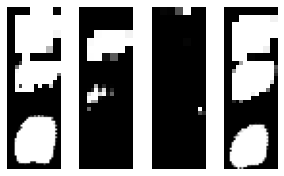

___________________________
tf.Tensor(12.616496, shape=(), dtype=float32) - tf.Tensor(0.028915428, shape=(), dtype=float32)


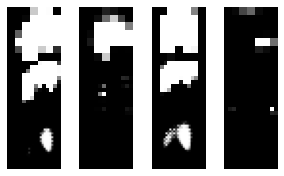

___________________________
tf.Tensor(13.8877, shape=(), dtype=float32) - tf.Tensor(0.3517425, shape=(), dtype=float32)


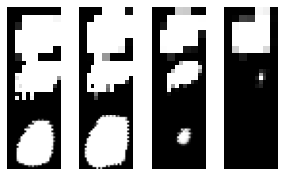

___________________________
tf.Tensor(13.14846, shape=(), dtype=float32) - tf.Tensor(0.06628504, shape=(), dtype=float32)


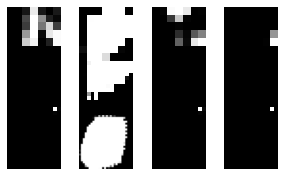

___________________________
tf.Tensor(13.404077, shape=(), dtype=float32) - tf.Tensor(0.020903407, shape=(), dtype=float32)


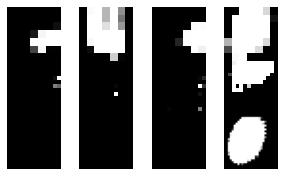

___________________________
tf.Tensor(13.204015, shape=(), dtype=float32) - tf.Tensor(0.0067451727, shape=(), dtype=float32)


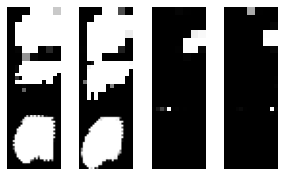

___________________________
tf.Tensor(12.225445, shape=(), dtype=float32) - tf.Tensor(0.04153649, shape=(), dtype=float32)


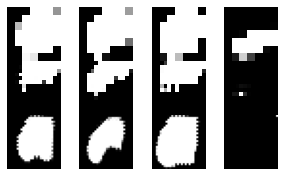

___________________________
tf.Tensor(12.717648, shape=(), dtype=float32) - tf.Tensor(0.33793056, shape=(), dtype=float32)


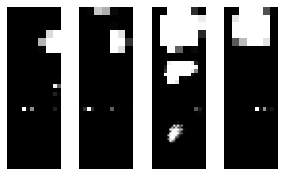

___________________________
tf.Tensor(9.827203, shape=(), dtype=float32) - tf.Tensor(0.18201287, shape=(), dtype=float32)


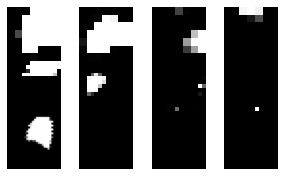

___________________________
tf.Tensor(6.8521795, shape=(), dtype=float32) - tf.Tensor(0.15981627, shape=(), dtype=float32)


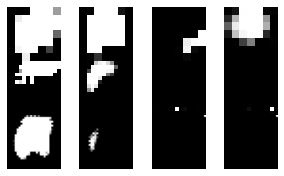

___________________________
tf.Tensor(10.60213, shape=(), dtype=float32) - tf.Tensor(0.0021281543, shape=(), dtype=float32)


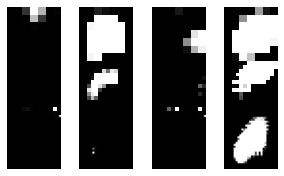

___________________________
tf.Tensor(11.33271, shape=(), dtype=float32) - tf.Tensor(1.3526965, shape=(), dtype=float32)


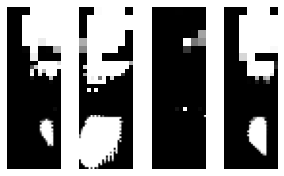

___________________________
tf.Tensor(16.29741, shape=(), dtype=float32) - tf.Tensor(0.5809621, shape=(), dtype=float32)


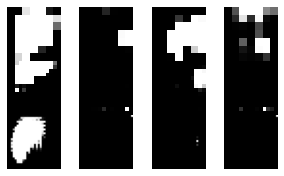

___________________________
tf.Tensor(16.768188, shape=(), dtype=float32) - tf.Tensor(1.1958, shape=(), dtype=float32)


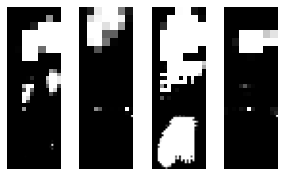

___________________________
tf.Tensor(11.539299, shape=(), dtype=float32) - tf.Tensor(0.765769, shape=(), dtype=float32)


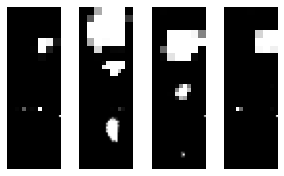

___________________________
tf.Tensor(7.351554, shape=(), dtype=float32) - tf.Tensor(0.8151413, shape=(), dtype=float32)


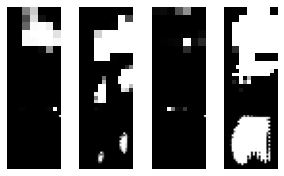

___________________________
tf.Tensor(6.3715262, shape=(), dtype=float32) - tf.Tensor(0.07769178, shape=(), dtype=float32)


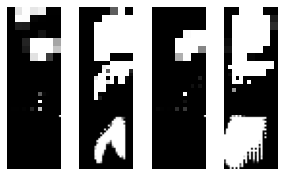

___________________________


In [ ]:
# this is the custom training loop
# if your dataset cant fit into memory, make a train_epoch tf.function
#    this avoids the dataset being iterarted eagarly which can fill up memory
def train(dataset, epochs):
     for epoch in range(epochs):
         for image_batch in dataset:
             gen_loss, dis_loss, generated_images = train_step(image_batch)
             print(gen_loss,"-", dis_loss)
             plot_sample(generated_images)
             print("___________________________")

# prediction of 0 = fake, 1 = real
@tf.function
def discriminator_loss(real_output, fake_output):
    real_loss = tf.nn.sigmoid_cross_entropy_with_logits(
        tf.ones_like(real_output), real_output)
    fake_loss = tf.nn.sigmoid_cross_entropy_with_logits(
        tf.zeros_like(fake_output), fake_output)
    return tf.nn.compute_average_loss(real_loss + fake_loss)

@tf.function
def generator_loss(fake_output):
    loss = tf.nn.sigmoid_cross_entropy_with_logits(
        tf.ones_like(fake_output), fake_output)
    return tf.nn.compute_average_loss(loss)

@tf.function
def train_step(images):
    noise = tf.random.normal([64, 100])

    #gradient tapes keep track of all calculations done in scope and create the
    #    gradients for these
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        dis_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss,
        generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(dis_loss,
        discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator,
        generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator,
        discriminator.trainable_variables))
    return gen_loss, dis_loss, generated_images
    
# lets train
dataset = mnist_dataset(64)
train(dataset, 300)